# Complete analysis and treatment of Horizontal MD4224 scan

In [1]:
import sys
import gzip
import glob
import pickle
import pandas as pd
import numpy as np
import scipy.io as sio 

sys.path.append('/eos/user/s/sterbini/MD_ANALYSIS/public/')
sys.path.append('/eos/project/l/liu/Toolbox/')

from myToolbox import *
from math import log10, floor
from scipy.signal import savgol_filter
from scipy.interpolate import interp1d
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec

Version 0.03. This is the latest version.
Please help me to improve it reporting bugs to guido.sterbini@cern.ch.
Your platform is Linux-3.10.0-1062.1.2.el7.x86_64-x86_64-with-centos-7.6.1810-Core
Your folder is /eos/home-h/harafiqu/SWAN_projects/PS/From_Scratch/H_Mini_Optimised
Your IP is 172.17.0.10
2019-10-29 10:14:45


In [2]:
%run ../MD_Functions.ipynb


	Importing MD Analysis functions for MD4224


### Import MD files

In [3]:
#myFiles=glob.glob('/eos/user/h/harafiqu/MD4224/2018.09.05_vertical/2018*.mat')
myFiles=glob.glob('/eos/user/h/harafiqu/MD4224/2018.09.03_horizontal_setup/2018*.mat')
len(myFiles)

481

### Convert matlab files to dataframe

In [4]:
# Convert mat files to dataframe
df_test = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp','PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp'])

In [5]:
# cleanup dataframe
df_test['PR_BCT_ST.Samples.cycleStamp']=df_test['PR_BCT_ST.Samples.cycleStamp']/1e9
df_test['PR_BQS72.SamplerAcquisition.cycleStamp']=df_test['PR_BQS72.SamplerAcquisition.cycleStamp']/1e9

In [6]:
df_test

,cycleStamp,matlabPLS,matlabFilePath,PR_BQS72.SamplerAcquisition.value.estimatedTuneV,PR_BQS72.SamplerAcquisition.cycleStamp,PR_BCT_ST.Samples.cycleStamp,PR_BCT_ST.Samples.value.samples,PR_BQS72.SamplerAcquisition.value.estimatedTuneH
2018-09-04 08:30:23.500,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.2400633838653782, 0.24071684060591647, 0.24...",1.536043e+09,1.536043e+09,"[-0.11624000000000001, -0.10534, -0.0999, -0.0...","[0.06925515749517883, 0.06973344379232979, 0.0..."
2018-09-04 08:31:07.900,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.240164392846053, 0.24070426568970765, 0.240...",1.536043e+09,1.536043e+09,"[-0.11624000000000001, -0.10534, -0.0999, -0.0...","[0.06903893480409946, 0.0698538814992571, 0.06..."
2018-09-04 08:30:23.500,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.24050455328258302, 0.2398882633906126, 0.23...",1.536043e+09,1.536043e+09,"[-0.13622, -0.13077, -0.12653, -0.11382, -0.10...","[0.20995352903286288, 0.21067020868710704, 0.2..."
2018-09-04 08:31:07.900,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.23999910805682345, 0.24038658159481574, 0.2...",1.536043e+09,1.536043e+09,"[-0.21553000000000003, -0.20585, -0.1967600000...","[0.20090626615692153, 0.20022577459852903, 0.2..."
2018-09-04 08:31:52.300,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.23920904522475026, 0.23922914467035167, 0.2...",1.536043e+09,1.536043e+09,"[-0.20040000000000002, -0.19313000000000002, -...","[0.19156456206690262, 0.19032274178797184, 0.1..."
2018-09-04 08:33:21.100,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.2395665702216988, 0.2391189857897399, 0.239...",1.536043e+09,1.536043e+09,"[-0.12714, -0.11745000000000001, -0.1083700000...","[0.19045308754184034, 0.1914852705347637, 0.19..."
2018-09-04 08:33:21.100,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.23962860413251058, 0.23834961636211321, 0.2...",1.536043e+09,1.536043e+09,"[-0.10353000000000001, -0.09626000000000001, -...","[0.16946551270565605, 0.17004205624494292, 0.1..."
2018-09-04 08:34:49.900,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.23882057258518413, 0.23888081153944538, 0.2...",1.536043e+09,1.536043e+09,"[-0.16831000000000002, -0.16831000000000002, -...","[0.17196781208006878, 0.1723985292401067, 0.17..."
2018-09-04 08:34:49.900,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.2382619451410699, 0.2389334619079185, 0.239...",1.536043e+09,1.536043e+09,"[-0.20524, -0.1895, -0.18163, -0.1677000000000...","[0.15291621940585948, 0.15318778737219924, 0.1..."
2018-09-04 08:36:18.700,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.23925441494855273, 0.2382666456672961, 0.23...",1.536043e+09,1.536043e+09,"[-0.16831000000000002, -0.15136000000000002, -...","[0.15184832491946984, 0.15332481868757536, 0.1..."


In [7]:
# Check cyclestamp differences

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['PR_BCT_ST.Samples.cycleStamp'] - row['PR_BQS72.SamplerAcquisition.cycleStamp'])/row['PR_BCT_ST.Samples.cycleStamp']
    differences.append(difference)
    
print 'Difference between BCT and BQS73 cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['cycleStamp'] - (row['PR_BCT_ST.Samples.cycleStamp']*1E9))/row['cycleStamp']
    differences.append(difference)
    
print '\nDifference between BCT and cyclestamp cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

Difference between BCT and BQS73 cycle times (percentage) 
 Mean: 2.7610980770525687e-11  Min: 0.0  Max: 1.3280881750622855e-08

Difference between BCT and cyclestamp cycle times (percentage) 
 Mean: 4.701978064056953e-06  Min: 4.687281837851767e-06  Max: 4.745158443302907e-06


In [8]:
df_bct = fromMatlabToDataFrame(myFiles,['PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp', 'PR_SCBFC.Samples.value.samples'])
df_bqs72 = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp'])

In [9]:
df_first = pnd.merge(df_bct, df_bqs72, left_on = 'PR_BCT_ST.Samples.cycleStamp',  right_on = 'PR_BQS72.SamplerAcquisition.cycleStamp')

In [10]:
# Have to convert this for unknown reason (myToolbox.unixtime2datetimeVectorize expects this converted cycleStamp)
df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']/1e9
# copy to new column
df_first['cf_cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']
# rename BCT cyclestamp to cycleStamp
df_first = df_first.rename(index=str, columns={"PR_BCT_ST.Samples.cycleStamp" : "cycleStamp", })
# convert to datetime
#df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
df_first['cf_timeStamp'] = df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
#df_first['cf_timeStamp']=df_first['timeStamp']
# Set index
df_first = df_first.set_index(['cycleStamp'])
df_first = df_first.drop(labels='matlabFilePath_x',axis='columns')
df_first = df_first.drop(labels='matlabFilePath_y',axis='columns')
df_first = df_first.drop(labels='cycleStamp_x',axis='columns')
df_first = df_first.drop(labels='cycleStamp_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_x',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.cycleStamp',axis='columns')
#df_first = df_first.drop(labels='PR_BCT_ST.Samples.cycleStamp',axis='columns')

In [11]:
df_first['Qx']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneH'][20:280]),axis=1)
df_first['Qy']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneV'][20:280]),axis=1)

In [12]:
# Remove anomalous cases etc
#df_first = df_first.drop(df_first[df_first['Qx'] < .295].index )
df_first = df_first.dropna(axis=0,how='all',subset =['Qy'])
df_first = df_first.dropna(axis=0,how='all',subset =['Qx'])
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneV',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneH',axis='columns')
#df_mergetest

In [13]:
df_first

,PR_BCT_ST.Samples.value.samples,PR_SCBFC.Samples.value.samples,cf_cycleStamp,cf_timeStamp,Qx,Qy
cycleStamp,,,,,,
1.536043e+09,"[-0.11624000000000001, -0.10534, -0.0999, -0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:29:39.100,0.068468,0.239291
1.536043e+09,"[-0.11624000000000001, -0.10534, -0.0999, -0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:29:39.100,0.068468,0.239291
1.536043e+09,"[-0.13622, -0.13077, -0.12653, -0.11382, -0.10...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:30:23.500,0.209375,0.239995
1.536043e+09,"[-0.21553000000000003, -0.20585, -0.1967600000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:31:07.900,0.199853,0.239851
1.536043e+09,"[-0.20040000000000002, -0.19313000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:31:52.300,0.190123,0.239320
1.536043e+09,"[-0.12714, -0.11745000000000001, -0.1083700000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:32:36.700,0.190050,0.238540
1.536043e+09,"[-0.10353000000000001, -0.09626000000000001, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:33:21.100,0.170671,0.238617
1.536043e+09,"[-0.16831000000000002, -0.16831000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:34:05.500,0.171046,0.238833
1.536043e+09,"[-0.20524, -0.1895, -0.18163, -0.1677000000000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:34:49.900,0.152070,0.238388


In [14]:
# Check chirp time
test = myToolbox.japcMatlabImport(myFiles[0])
test.PR_BQS72.SamplerAcquisition.value.acqOffset

20

# Intensity, Losses, Ratio

In [15]:
df_second=intensity_df(df_first,start=70,end=1185)

In [16]:
df_second = df_second.drop(labels='PR_BCT_ST.Samples.value.samples',axis='columns');
df_second = df_second.set_index(['cf_timeStamp']);
df_second

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,
2018-09-04 08:29:39.100,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.068468,0.239291,7.102362e+11,0.774874,0.992251
2018-09-04 08:29:39.100,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.068468,0.239291,7.102362e+11,0.774874,0.992251
2018-09-04 08:30:23.500,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.209375,0.239995,7.301678e+11,1.755472,0.982445
2018-09-04 08:31:07.900,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.199853,0.239851,7.119099e+11,1.411161,0.985888
2018-09-04 08:31:52.300,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.190123,0.239320,7.243861e+11,1.241589,0.987584
2018-09-04 08:32:36.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.190050,0.238540,7.443178e+11,1.106104,0.988939
2018-09-04 08:33:21.100,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.170671,0.238617,7.017158e+11,1.237806,0.987622
2018-09-04 08:34:05.500,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.171046,0.238833,6.969991e+11,0.985538,0.990145
2018-09-04 08:34:49.900,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.152070,0.238388,7.227126e+11,0.887386,0.991126


### Check for duplicates

In [17]:
df_second = df_second.drop(df_second.index[0])
df_second[df_second.index.duplicated()]

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,


### Plot Intensity, Losses, Ratio

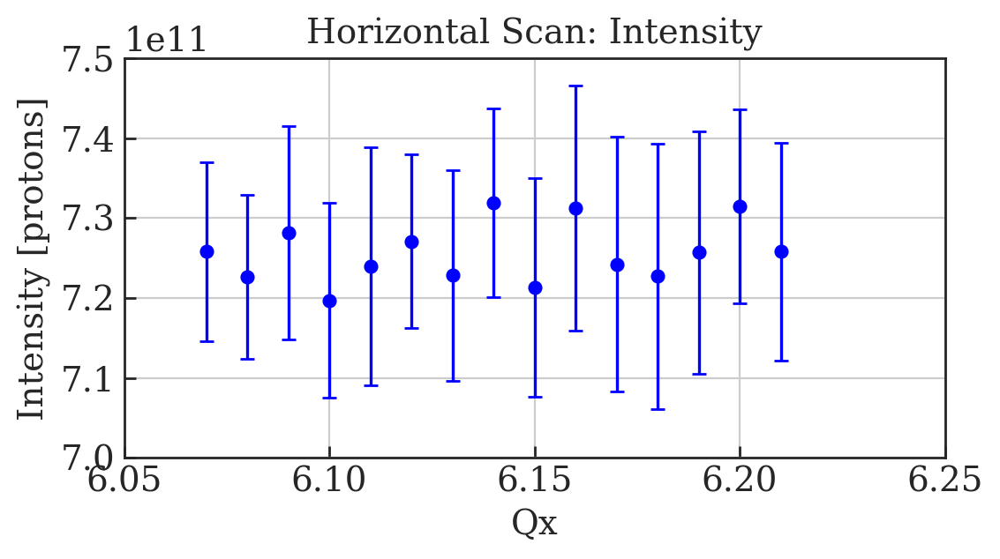

In [18]:
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df_second['intensity'][(df_second['Qx']>lower_lim)][(df_second['Qx']<upper_lim)] ) )
    y_error_172.append( np.std( df_second['intensity'][(df_second['Qx']>lower_lim)][(df_second['Qx']<upper_lim)] ) )
    
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');

plt.errorbar(x_data, y_data_172, y_error_172, linestyle='None', marker='o', capsize=3, color='b')

x_d = np.linspace(6.0, 7.0, 2)
y_d = (7.25E11, 7.25E11)

plt.xlabel('Qx');
plt.ylabel('Intensity [protons]');
plt.title('Horizontal Scan: Intensity')
plt.ylim(70E10,75E10)
plt.xlim(6.05, 6.25)
#plt.legend()
plt.grid();
fig.savefig('MD4224_Complete_Horizontal_Intensities_Errors.png');

# Timber: Horizontal

In [19]:
dfH=read_data(year=2018,date=4,month=9,hour=8,minutes=20,span=8,user='CPS%MD1',WS='65.H');

In [20]:
len(dfH)

227

In [21]:
dfH

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BCT.LT:SAMPLES,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.13622, -0.13077, -0.12653, -0.11382, -0.10...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+18
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.21553, -0.20585, -0.19676, -0.178, -0.1586...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+18
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.2004, -0.19313, -0.18163, -0.16044, -0.142...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+18
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.10353, -0.09626, -0.09203, -0.07931, -0.06...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+18
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.20524, -0.1895, -0.18163, -0.1677, -0.1483...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+18
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.12532, -0.11079, -0.10111, -0.089, -0.0787...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+18
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.17557, -0.16468, -0.15438, -0.1338, -0.119...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+18
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.16589, -0.14712, -0.1338, -0.10958, -0.093...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+18
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.13077, -0.12532, -0.12472, -0.11564, -0.10...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+18
2018-09-04 08:42:13.900,175.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.19253, -0.17739, -0.16468, -0.14591, -0.12...","[0.174921255067789, 0.175532868924527, 0.17512...",1.536051e+18


# Manual Fit

In [22]:
df_H_filtered = Multi_filter(dfH, with_plot = True, WS = '65.H' )


Multi_filter row  0
5 parameter fit sigma =  4.4119310383040915  +/-  0.002914145266276778
3 parameter fit sigma =  4.411930986822637  +/-  0.010816417382478002
Second moment =  4.3764926897884795


/usr/local/bin/start_ipykernel.py:79: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:161: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:163: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  1
5 parameter fit sigma =  4.385078204284094  +/-  0.0030937376352799125
3 parameter fit sigma =  4.385077923670447  +/-  0.011540243857238536
Second moment =  4.259797370207958

Multi_filter row  2
5 parameter fit sigma =  4.434069732151142  +/-  0.0029127442997559597
3 parameter fit sigma =  4.434069219375807  +/-  0.010678926112903846
Second moment =  4.351412601781533

Multi_filter row  3
5 parameter fit sigma =  4.468285259732235  +/-  0.003124287050226527
3 parameter fit sigma =  4.468284998488029  +/-  0.011511872830552472
Second moment =  4.377511954189166

Multi_filter row  4
5 parameter fit sigma =  4.59375611180132  +/-  0.0028428103920089868
3 parameter fit sigma =  4.5937560326213065  +/-  0.010113211080327601
Second moment =  4.51728732744514

Multi_filter row  5
5 parameter fit sigma =  4.697891265586504  +/-  0.0029637498972557345
3 parameter fit sigma =  4.697891178560968  +/-  0.01026656510179562
Second moment =  4.846254714643309

Multi_filter row 


Multi_filter row  43
5 parameter fit sigma =  4.8029279976204196  +/-  0.003495917733946858
3 parameter fit sigma =  4.8029254308872  +/-  0.012644063399368823
Second moment =  4.737634460427686

Multi_filter row  44
5 parameter fit sigma =  4.821255427903209  +/-  0.0035173473862649277
3 parameter fit sigma =  4.821255117804676  +/-  0.012754042959218961
Second moment =  4.816287500113392

Multi_filter row  45
5 parameter fit sigma =  5.319063160407108  +/-  0.004604455368937491
3 parameter fit sigma =  5.3190604727438355  +/-  0.015901383751559754
Second moment =  5.141877479576826

Multi_filter row  46
5 parameter fit sigma =  5.790448522671267  +/-  0.004672381048590634
3 parameter fit sigma =  5.790449233157407  +/-  0.015277758817701347
Second moment =  5.678166447494334

Multi_filter row  47
5 parameter fit sigma =  4.348981030949833  +/-  0.002835274335436684
3 parameter fit sigma =  4.348980986982779  +/-  0.010456858001503241
Second moment =  4.4215175821403925

Multi_filter


Multi_filter row  85
5 parameter fit sigma =  4.437458999956741  +/-  0.0028960710740445054
3 parameter fit sigma =  4.437458624584091  +/-  0.010648185158178803
Second moment =  4.33024010954803

Multi_filter row  86
5 parameter fit sigma =  4.4092876988889005  +/-  0.0027968370755140945
3 parameter fit sigma =  4.409288719152602  +/-  0.010389500462277558
Second moment =  4.43367988779502

Multi_filter row  87
5 parameter fit sigma =  4.503467166055622  +/-  0.003267252786969994
3 parameter fit sigma =  4.503469337779128  +/-  0.012245554740549365
Second moment =  4.407507038016954

Multi_filter row  88
5 parameter fit sigma =  4.636240911534021  +/-  0.003097617278902683
3 parameter fit sigma =  4.636240875233502  +/-  0.01141109422803188
Second moment =  4.590016020055857

Multi_filter row  89
5 parameter fit sigma =  4.973159329365637  +/-  0.0037084461755382482
3 parameter fit sigma =  4.973159933049034  +/-  0.013265821747996846
Second moment =  4.818429996340825

Multi_filter 


Multi_filter row  127
5 parameter fit sigma =  5.47140930464889  +/-  0.004303413900432663
3 parameter fit sigma =  5.471409072080677  +/-  0.014556704364692457
Second moment =  5.601206134950219

Multi_filter row  128
5 parameter fit sigma =  5.919787326011903  +/-  0.005037633443044629
3 parameter fit sigma =  5.919787695608012  +/-  0.016361700342454016
Second moment =  5.5059411476500335

Multi_filter row  129
5 parameter fit sigma =  4.41980319852834  +/-  0.0028046886422514344
3 parameter fit sigma =  4.4198038609957635  +/-  0.010439650934729275
Second moment =  4.364078654036144

Multi_filter row  130
5 parameter fit sigma =  4.416615383715263  +/-  0.0029342131633795215
3 parameter fit sigma =  4.416615286414225  +/-  0.010954677614264552
Second moment =  4.31176905860845

Multi_filter row  131
5 parameter fit sigma =  4.499386213116249  +/-  0.002843624180186387
3 parameter fit sigma =  4.499385234680585  +/-  0.010441589046505934
Second moment =  4.363610915421009

Multi_fi


Multi_filter row  169
5 parameter fit sigma =  4.984515967131949  +/-  0.003445902398587343
3 parameter fit sigma =  4.984515554475306  +/-  0.011863190628658756
Second moment =  4.835284519015939

Multi_filter row  170
5 parameter fit sigma =  5.463460246325279  +/-  0.004546048186186064
3 parameter fit sigma =  5.4634592274875615  +/-  0.015534213116481881
Second moment =  5.165023205918372

Multi_filter row  171
5 parameter fit sigma =  5.993457601647336  +/-  0.005099984947802033
3 parameter fit sigma =  5.993456840929918  +/-  0.016602076793227546
Second moment =  5.640843505504249

Multi_filter row  172
5 parameter fit sigma =  4.384724106676884  +/-  0.002848167316275948
3 parameter fit sigma =  4.384724623985665  +/-  0.010685555095255006
Second moment =  4.371576040729943

Multi_filter row  173
5 parameter fit sigma =  4.458278879450483  +/-  0.0030108124812569005
3 parameter fit sigma =  4.4582781137583565  +/-  0.011319678933284592
Second moment =  4.442206535903683

Multi_


Multi_filter row  211
5 parameter fit sigma =  4.424315833004393  +/-  0.002942747902659792
3 parameter fit sigma =  4.424315706414014  +/-  0.01097471160800633
Second moment =  4.361144981324213

Multi_filter row  212
5 parameter fit sigma =  4.587936027290125  +/-  0.0031431135073126688
3 parameter fit sigma =  4.58793589498223  +/-  0.011677442137390108
Second moment =  4.5225487179783475

Multi_filter row  213
5 parameter fit sigma =  4.732862030896154  +/-  0.0032365666832259794
3 parameter fit sigma =  4.732861400750446  +/-  0.011670461443721386
Second moment =  4.720630150953136

Multi_filter row  214
5 parameter fit sigma =  4.77590023650177  +/-  0.0031016752680976816
3 parameter fit sigma =  4.775900291633621  +/-  0.010998563191012448
Second moment =  4.702202902117167

Multi_filter row  215
5 parameter fit sigma =  4.873807548265324  +/-  0.0033532949696412485
3 parameter fit sigma =  4.87380810245368  +/-  0.011868867525417796
Second moment =  4.833670503439342

Multi_fi

In [23]:
df_H_filtered = df_H_filtered.dropna(axis=0, how='all', subset=['profile H']);
df_H_filtered = df_H_filtered.dropna(axis=0, how='all', subset=['sig H']);
df_H_filtered = df_H_filtered.drop(labels = 'PR.BCT.LT:SAMPLES',axis='columns');
df_H_filtered['cycleStamp'] = df_H_filtered['cycleStamp']/1e9;
df_H_filtered['timeStamp_h'] = df_H_filtered['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize);


In [24]:
df_H_filtered

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,timeStamp_h
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...","[-0.0010291567039261706, -0.001231909621088295...",2018-09-04 10:30:23.500
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...","[-0.0005403673674068132, 7.05067213957189e-05,...",2018-09-04 10:31:07.900
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...","[0.0014204721379618146, 0.001009509217427873, ...",2018-09-04 10:31:52.300
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....","[0.000569148482410825, 0.0015954702265423837, ...",2018-09-04 10:33:21.100
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...","[0.0013127674308776593, 0.00151857347547657, 0...",2018-09-04 10:34:49.900
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...","[0.0025572118017685164, 0.0023501739147005207,...",2018-09-04 10:36:18.700
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+09,4.704099,4.927503294667217,0.013057,6.990972365092053,-3.3162589470865695,"[-29.48574105291343, -29.453741052913433, -29....","[-0.001186698579288048, 0.001264047734976903, ...",2018-09-04 10:37:47.500
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+09,5.061085,5.176246325534791,0.017240,6.713900226898849,-3.394103806486972,"[-31.011896193513028, -30.87989619351303, -30....","[0.0012531608091851942, 0.0033193790161270276,...",2018-09-04 10:39:16.300
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+09,5.892221,5.866034303890619,0.019750,6.902342903858677,-3.474954237427583,"[-35.17304576257242, -35.10704576257242, -34.9...","[-0.001107980961924132, -0.0004984713001990604...",2018-09-04 10:40:45.100
2018-09-04 08:42:13.900,175.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174921255067789, 0.175532868924527, 0.17512...",1.536051e+09,4.351022,4.416157449662227,0.010081,7.222033873364809,-2.448335591030603,"[-26.4446644089694, -26.347664408969397, -26.2...","[0.0008066847745771266, 0.0012169879923084048,...",2018-09-04 10:42:13.900


# Merge Timber WS dataframe with Intensity/Tunes dataframe

In [25]:
df_third = pnd.merge(df_H_filtered, df_second, left_index=True, right_index=True, how='outer');
df_third

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,timeStamp_h,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...","[-0.0010291567039261706, -0.001231909621088295...",2018-09-04 10:30:23.500,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.209375,0.239995,7.301678e+11,1.755472,0.982445
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...","[-0.0005403673674068132, 7.05067213957189e-05,...",2018-09-04 10:31:07.900,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.199853,0.239851,7.119099e+11,1.411161,0.985888
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...","[0.0014204721379618146, 0.001009509217427873, ...",2018-09-04 10:31:52.300,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.190123,0.239320,7.243861e+11,1.241589,0.987584
2018-09-04 08:32:36.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.190050,0.238540,7.443178e+11,1.106104,0.988939
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....","[0.000569148482410825, 0.0015954702265423837, ...",2018-09-04 10:33:21.100,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.170671,0.238617,7.017158e+11,1.237806,0.987622
2018-09-04 08:34:05.500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.171046,0.238833,6.969991e+11,0.985538,0.990145
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...","[0.0013127674308776593, 0.00151857347547657, 0...",2018-09-04 10:34:49.900,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.152070,0.238388,7.227126e+11,0.887386,0.991126
2018-09-04 08:35:34.300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.152020,0.238310,7.310808e+11,0.606180,0.993938
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...","[0.0025572118017685164, 0.0023501739147005207,...",2018-09-04 10:36:18.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.133166,0.238409,6.959341e+11,0.570801,0.994292
2018-09-04 08:37:03.100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.133072,0.238154,7.310808e+11,0.271576,0.997284


In [26]:
df_third=df_third.dropna(axis=0,how='all',subset =['Qx']);
df_third=df_third.dropna(axis=0,how='all',subset =['sig H']);
df_third=df_third.dropna(axis=1,how='all');
df_third = df_third.drop(labels = 'timeStamp_h',axis='columns');
df_third = df_third.drop(labels = 'cf_cycleStamp',axis='columns');
df_third

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,PR_SCBFC.Samples.value.samples,Qx,Qy,intensity,losses,ratio
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...","[-0.0010291567039261706, -0.001231909621088295...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.209375,0.239995,7.301678e+11,1.755472,0.982445
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...","[-0.0005403673674068132, 7.05067213957189e-05,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.199853,0.239851,7.119099e+11,1.411161,0.985888
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...","[0.0014204721379618146, 0.001009509217427873, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.190123,0.239320,7.243861e+11,1.241589,0.987584
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....","[0.000569148482410825, 0.0015954702265423837, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.170671,0.238617,7.017158e+11,1.237806,0.987622
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...","[0.0013127674308776593, 0.00151857347547657, 0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.152070,0.238388,7.227126e+11,0.887386,0.991126
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...","[0.0025572118017685164, 0.0023501739147005207,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.133166,0.238409,6.959341e+11,0.570801,0.994292
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+09,4.704099,4.927503294667217,0.013057,6.990972365092053,-3.3162589470865695,"[-29.48574105291343, -29.453741052913433, -29....","[-0.001186698579288048, 0.001264047734976903, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.114450,0.238259,7.231689e+11,0.779939,0.992201
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+09,5.061085,5.176246325534791,0.017240,6.713900226898849,-3.394103806486972,"[-31.011896193513028, -30.87989619351303, -30....","[0.0012531608091851942, 0.0033193790161270276,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.095983,0.238594,7.043024e+11,1.211873,0.987881
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+09,5.892221,5.866034303890619,0.019750,6.902342903858677,-3.474954237427583,"[-35.17304576257242, -35.10704576257242, -34.9...","[-0.001107980961924132, -0.0004984713001990604...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.

# Emittances

In [27]:
span=span_range(df_third)
span

xrange(225)

In [28]:
#%run ../MD_Functions.ipynb

In [29]:
# Calculate emittances in Vertical
df_fourth = emittance_df(df_third, WS='65.H', verbose=True)

Emittance  0  =  1.0720585167841377
Emittance  1  =  1.039389501677297
Emittance  2  =  1.0736544997647173
Emittance  3  =  1.0847021738486387
Emittance  4  =  1.1803327033780053
Emittance  5  =  1.2577484255275342
Emittance  6  =  1.465641978716663
Emittance  7  =  1.7123883393906132
Emittance  8  =  2.542525638998941
Emittance  9  =  1.0757330077108824
Emittance  10  =  1.1092037394109615
Emittance  11  =  1.1397954698735193
Emittance  12  =  1.2076829822013382
Emittance  13  =  1.3218406848334272
Emittance  14  =  1.9167099850367684
Emittance  15  =  2.650150661103901
Emittance  16  =  1.0851398904201601
Emittance  17  =  1.0517367521161256
Emittance  18  =  1.0527135819384437
Emittance  19  =  1.1719847369934921
Emittance  20  =  1.3021520221345089
Emittance  21  =  1.4731680110494205
Emittance  22  =  1.8299161402860247
Emittance  23  =  2.3646157083824937
Emittance  24  =  1.089521660151752
Emittance  25  =  1.0816995058318428
Emittance  26  =  1.117322470587402
Emittance  27  = 

Emittance  223  =  1.6389682789780633
Emittance  224  =  2.144958296698871


In [30]:
df_fourth

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,...,Qx,Qy,intensity,losses,ratio,emittance H,betx,bety,dx,emittance H noDisp
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...",...,0.209375,0.239995,7.301678e+11,1.755472,0.982445,1.072059,22.435882,11.715731,3.413603,1.960295
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...",...,0.199853,0.239851,7.119099e+11,1.411161,0.985888,1.039390,22.392001,11.721015,3.434507,1.940300
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...",...,0.190123,0.239320,7.243861e+11,1.241589,0.987584,1.073654,22.339713,11.726460,3.457001,1.988541
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....",...,0.170671,0.238617,7.017158e+11,1.237806,0.987622,1.084702,22.207503,11.737483,3.506113,2.031370
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...",...,0.152070,0.238388,7.227126e+11,0.887386,0.991126,1.180333,22.035852,11.748196,3.559735,2.163780
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...",...,0.133166,0.238409,6.959341e+11,0.570801,0.994292,1.257748,21.797181,11.759253,3.623272,2.287772
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+09,4.704099,4.927503294667217,0.013057,6.990972365092053,-3.3162589470865695,"[-29.48574105291343, -29.453741052913433, -29....",...,0.114450,0.238259,7.231689e+11,0.779939,0.992201,1.465642,21.467022,11.770369,3.698824,2.555578
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+09,5.061085,5.176246325534791,0.017240,6.713900226898849,-3.394103806486972,"[-31.011896193513028, -30.87989619351303, -30....",...,0.095983,0.238594,7.043024e+11,1.211873,0.987881,1.712388,20.999678,11.781491,3.791097,2.882865
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+09,5.892221,5.866034303890619,0.019750,6.902342903858677,-3.474954237427583,"[-35.17304576257242, -35.10704576257242, -34.9...",...,0.077534,0.238870,7.249947e+11,1.536863,0.984631,2.542526,20.300948,11.792737,3.909099,3.829834
2018-09-04 08:42:13.900,175.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174921255067789, 0.175532868924527, 0.17512...",1.536051e+09,4.351022,4.416157449662227,0.010081,7.222033873364809,-2.448335591030603,"[-26.4446644089694, -26.347664408969397, -26.2...",...,0.209286,0.239391,7.380797e+11,1.902385,0.980976,1.075733,22.435503,11.715780,3.413798,1.964086


# Emittances from 2nd Moment

In [31]:
df_fifth = emittance_df_2(df_fourth, WS='65.H', verbose=True)

Emittance from 2nd moment 0  =  1.040693336025172
Emittance from 2nd moment 1  =  0.9301054993827126
Emittance from 2nd moment 2  =  1.0002077253304604
Emittance from 2nd moment 3  =  1.0030060880303926
Emittance from 2nd moment 4  =  1.1088947329048733
Emittance from 2nd moment 5  =  1.4045298273735003
Emittance from 2nd moment 6  =  1.2391646137282577
Emittance from 2nd moment 7  =  1.5855394500470394
Emittance from 2nd moment 8  =  2.5767951407814196
Emittance from 2nd moment 9  =  1.018222512601362
Emittance from 2nd moment 10  =  0.973570969974511
Emittance from 2nd moment 11  =  1.1165657917805618
Emittance from 2nd moment 12  =  1.188847666981425
Emittance from 2nd moment 13  =  1.235537326522712
Emittance from 2nd moment 14  =  1.6484733588782878
Emittance from 2nd moment 15  =  2.1540461565806095
Emittance from 2nd moment 16  =  1.0126911437719806
Emittance from 2nd moment 17  =  0.9902452033171648
Emittance from 2nd moment 18  =  1.1797950653147526
Emittance from 2nd moment 1

Emittance from 2nd moment 165  =  0.954807837191821
Emittance from 2nd moment 166  =  1.144876568839345
Emittance from 2nd moment 167  =  1.1189089226838282
Emittance from 2nd moment 168  =  1.4928406743557967
Emittance from 2nd moment 169  =  1.3714594226723342
Emittance from 2nd moment 170  =  1.700254383356813
Emittance from 2nd moment 171  =  2.25406532128253
Emittance from 2nd moment 172  =  1.0368433157663133
Emittance from 2nd moment 173  =  1.081457758866058
Emittance from 2nd moment 174  =  1.156567488350599
Emittance from 2nd moment 175  =  1.155026987293299
Emittance from 2nd moment 176  =  1.1106624235352824
Emittance from 2nd moment 177  =  1.3933401144929294
Emittance from 2nd moment 178  =  1.8180148452195732
Emittance from 2nd moment 179  =  2.676959621054712
Emittance from 2nd moment 180  =  1.1970844954827975
Emittance from 2nd moment 181  =  1.0113990688835657
Emittance from 2nd moment 182  =  1.1087608125634338
Emittance from 2nd moment 183  =  1.1619117852185237
Em

In [32]:
df_fifth

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,...,intensity,losses,ratio,emittance H,betx,bety,dx,emittance H noDisp,emittance H 2ndMoment noDisp,emittance H 2ndMoment
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...",...,7.301678e+11,1.755472,0.982445,1.072059,22.435882,11.715731,3.413603,1.960295,1.928930,1.040693
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...",...,7.119099e+11,1.411161,0.985888,1.039390,22.392001,11.721015,3.434507,1.940300,1.831016,0.930105
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...",...,7.243861e+11,1.241589,0.987584,1.073654,22.339713,11.726460,3.457001,1.988541,1.915094,1.000208
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....",...,7.017158e+11,1.237806,0.987622,1.084702,22.207503,11.737483,3.506113,2.031370,1.949674,1.003006
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...",...,7.227126e+11,0.887386,0.991126,1.180333,22.035852,11.748196,3.559735,2.163780,2.092342,1.108895
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...",...,6.959341e+11,0.570801,0.994292,1.257748,21.797181,11.759253,3.623272,2.287772,2.434553,1.404530
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+09,4.704099,4.927503294667217,0.013057,6.990972365092053,-3.3162589470865695,"[-29.48574105291343, -29.453741052913433, -29....",...,7.231689e+11,0.779939,0.992201,1.465642,21.467022,11.770369,3.698824,2.555578,2.329101,1.239165
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+09,5.061085,5.176246325534791,0.017240,6.713900226898849,-3.394103806486972,"[-31.011896193513028, -30.87989619351303, -30....",...,7.043024e+11,1.211873,0.987881,1.712388,20.999678,11.781491,3.791097,2.882865,2.756016,1.585539
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+09,5.892221,5.866034303890619,0.019750,6.902342903858677,-3.474954237427583,"[-35.17304576257242, -35.10704576257242, -34.9...",...,7.249947e+11,1.536863,0.984631,2.542526,20.300948,11.792737,3.909099,3.829834,3.864104,2.576795
2018-09-04 08:42:13.900,175.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174921255067789, 0.175532868924527, 0.17512...",1.536051e+09,4.351022,4.416157449662227,0.010081,7.222033873364809,-2.448335591030603,"[-26.4446644089694, -26.347664408969397, -26.2...",...,7.380797e+11,1.902385,0.980976,1.075733,22.435503,11.715780,3.413798,1.964086,1.906575,1.018223


# Save Dataframe to pickle

In [33]:
df_fifth.to_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')

In [34]:
df0 = pnd.read_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')
#df0 = df_fifth

## Find correct tomo file for sims

In [35]:
# First tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536135630))

'2018-09-05 10:20:30'

In [36]:
# Last tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536152855))

'2018-09-05 15:07:35'

In [37]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-04 10:30:23'

In [38]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-04 10:30:23'

# Plots

In [39]:
# These are our tune points:
scan_points = np.linspace(607, 621, 15);
scan_points = scan_points/100;
scan_points

array([6.07, 6.08, 6.09, 6.1 , 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17,
       6.18, 6.19, 6.2 , 6.21])

In [40]:
from math import log10, floor

def round_sig(x, sig=4):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [41]:
Qx_points=[]
for i in scan_points:
    Qx_points.append(round_sig(i,5))
Qx_points

[6.07,
 6.08,
 6.09,
 6.1,
 6.11,
 6.12,
 6.13,
 6.14,
 6.15,
 6.16,
 6.17,
 6.18,
 6.19,
 6.2,
 6.21]

In [42]:
Qx_point_separation = Qx_points[1] - Qx_points[0]
Qx_pt_sep = Qx_point_separation/2
print 'Tune points separated by +/- ', Qx_pt_sep

Tune points separated by +/-  0.005


In [43]:
# Make dictionary of nearest tune point and iterators
tune_points = {}
for i in Qx_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qx'], (i-Qx_pt_sep-6)), np.less_equal(df0['Qx'], (i+Qx_pt_sep-6)) ) )[0]
tune_points

{6.07: array([187, 202, 209, 217]),
 6.08: array([  8,  15,  23,  31,  39,  46,  54,  62,  76,  84,  91,  99, 107,
        114, 128, 136, 142, 148, 155, 163, 171, 179]),
 6.09: array([186, 194, 201, 208, 216, 224]),
 6.1: array([  7,  14,  22,  30,  38,  45,  53,  61,  69,  75,  83,  90,  98,
        106, 113, 121, 127, 135, 141, 154, 162, 170, 178]),
 6.11: array([  6,  21,  29,  37,  52,  60,  68,  82,  89,  97, 105, 112, 120,
        134, 140, 153, 161, 169, 177, 185, 193, 200, 207, 215, 223]),
 6.12: array([ 44, 184, 192, 199, 206, 214, 222]),
 6.13: array([  5,  13,  20,  28,  36,  43,  51,  59,  67,  74,  81,  96, 104,
        111, 119, 126, 133, 147, 160, 168, 176]),
 6.14: array([183, 191, 198, 205, 213, 221]),
 6.15: array([  4,  12,  19,  27,  35,  50,  58,  66,  73,  80,  88,  95, 103,
        110, 118, 125, 132, 146, 152, 159, 167, 175]),
 6.16: array([182, 190, 197, 204, 212, 220]),
 6.17: array([  3,  11,  18,  26,  34,  42,  49,  57,  65,  72,  79,  87,  94,
        102,

In [44]:
import matplotlib.cm as cm
# One colour per data point
colors = cm.rainbow(np.linspace(0, 1, len(df0)))

## Plot all WS profiles grouped by tune point

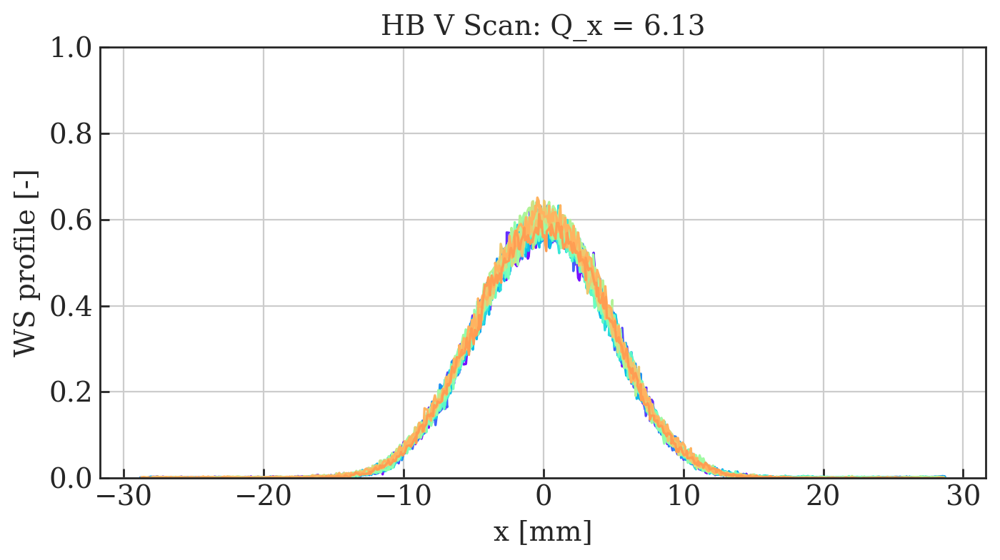

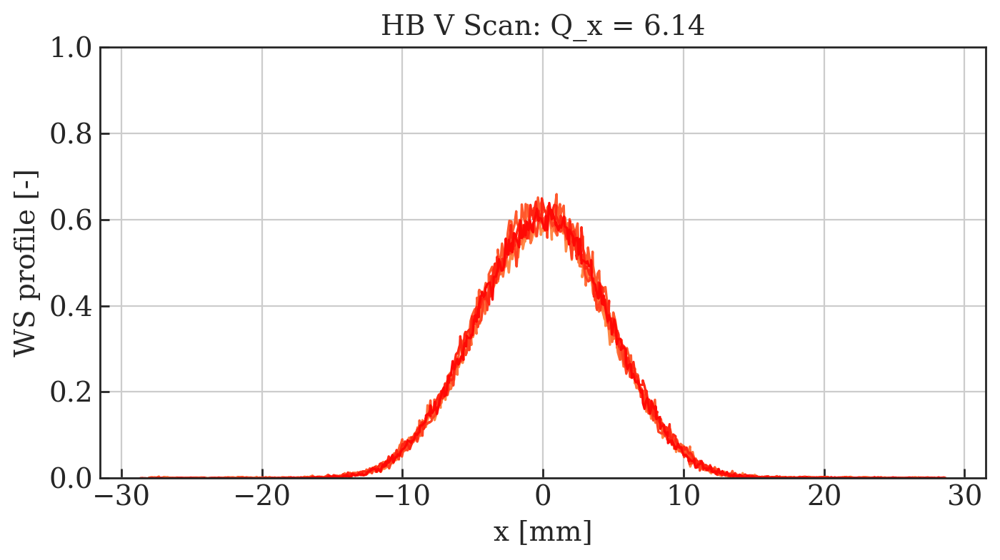

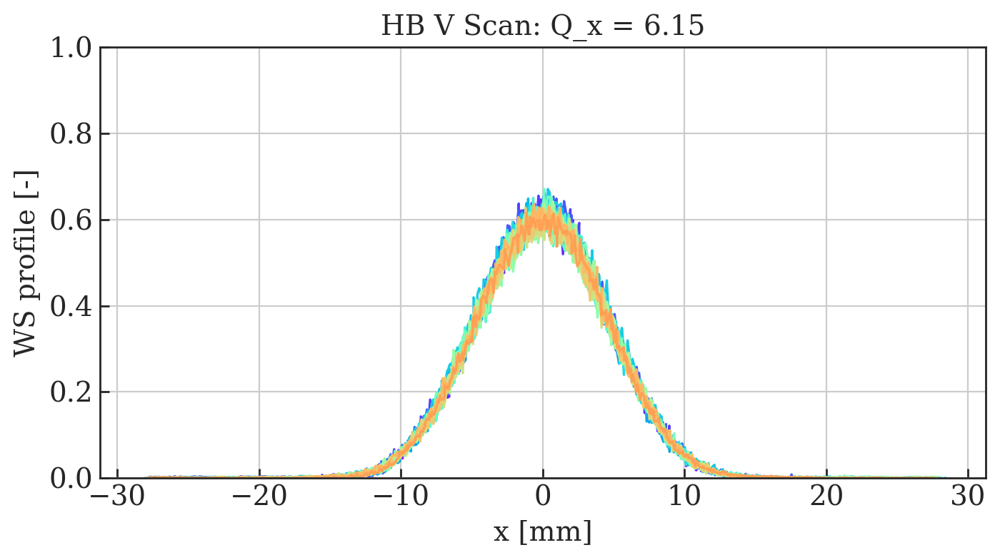

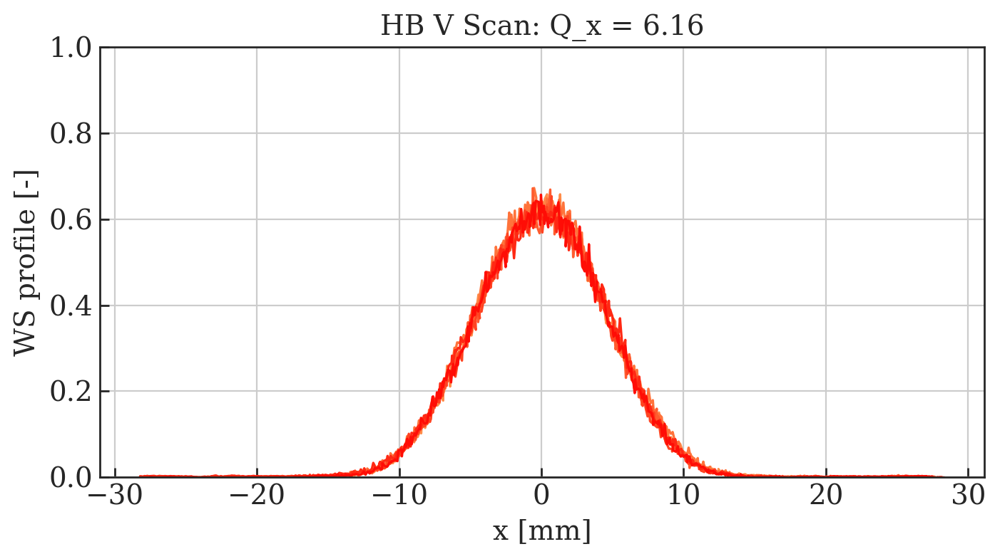

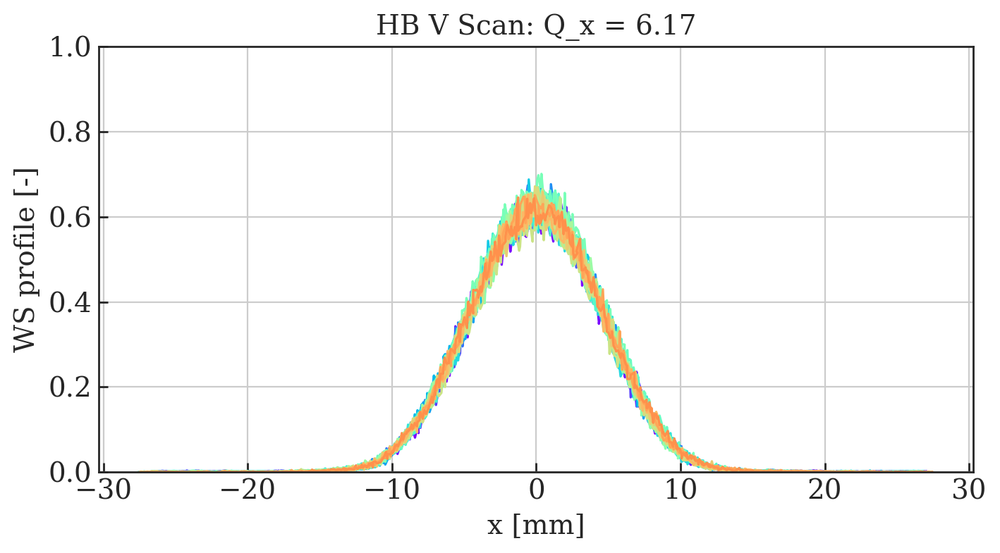

...

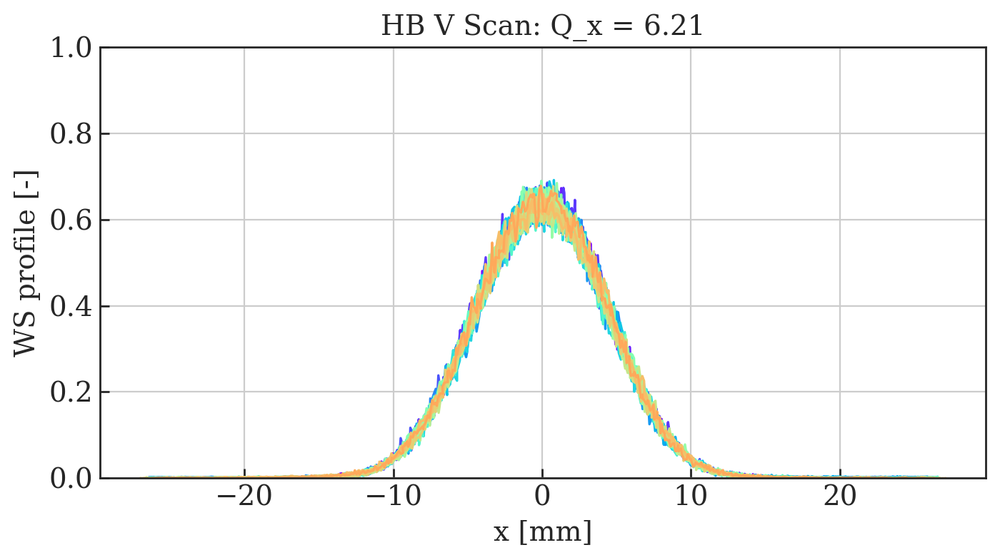

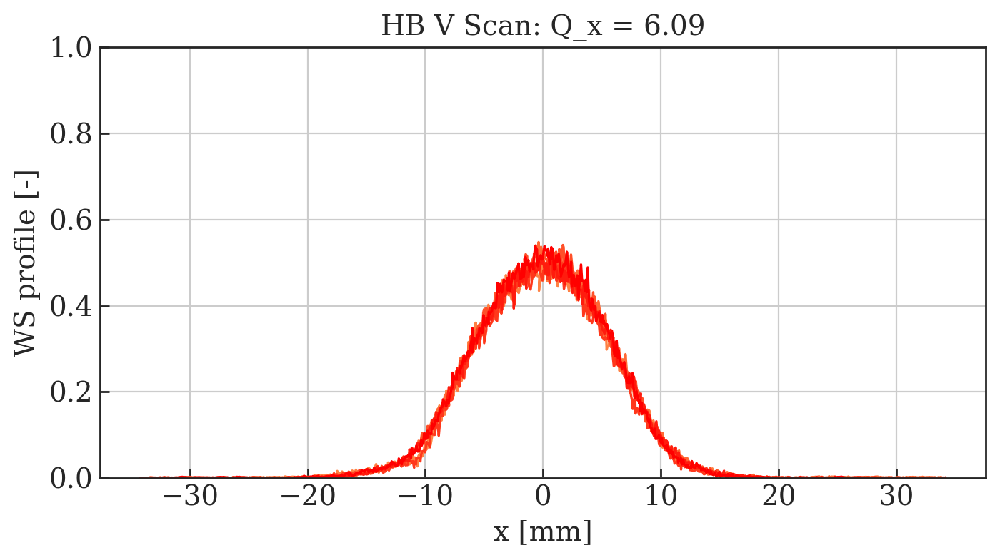

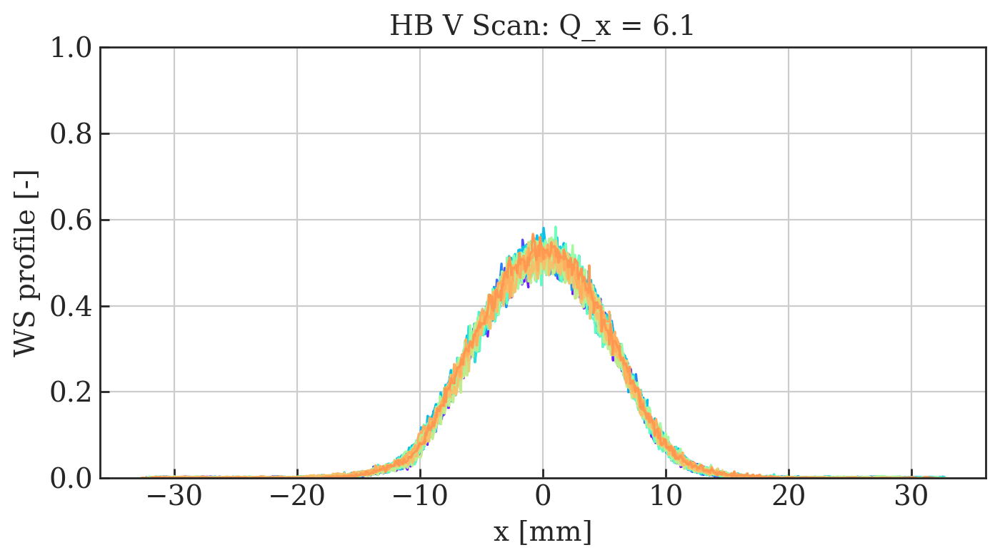

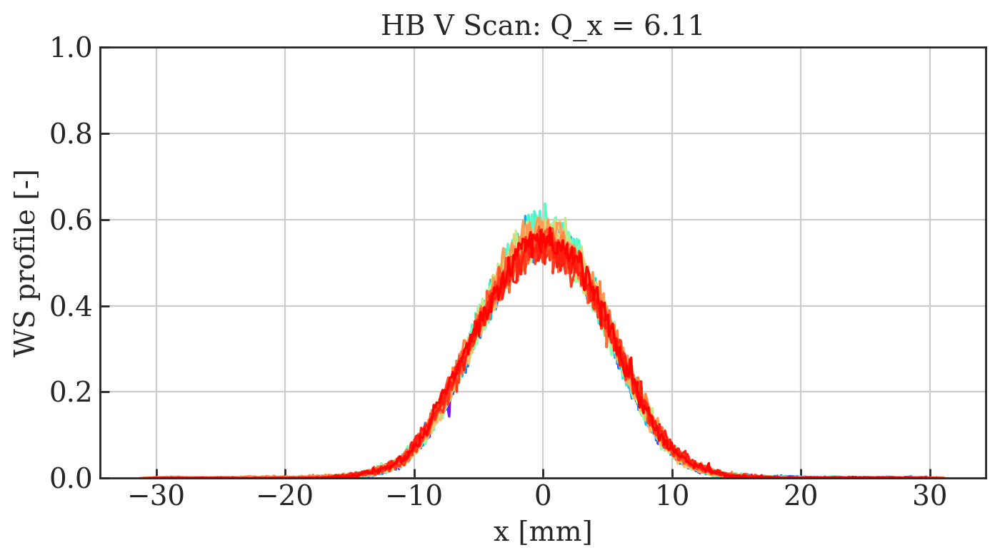

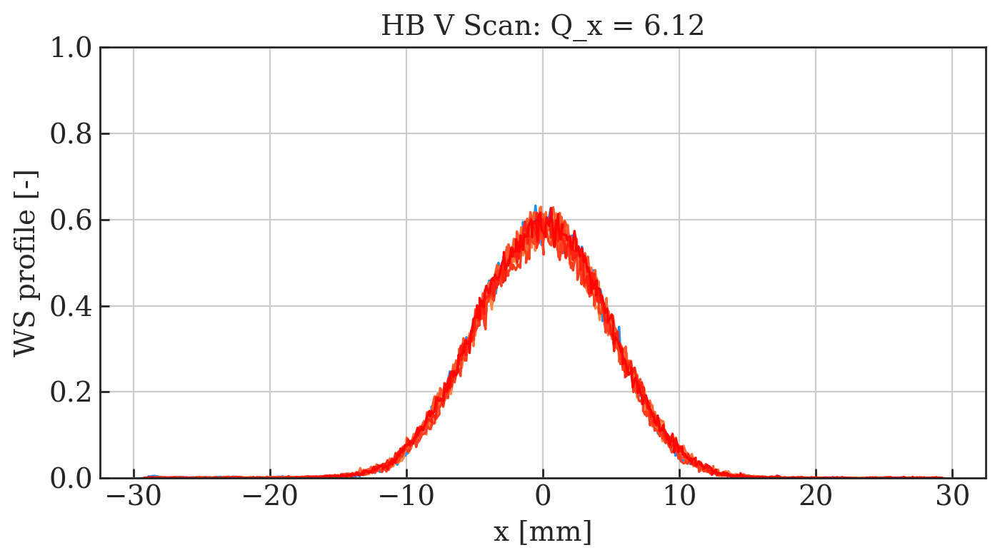

In [45]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['position H'].iloc[value[i]], df0['profile H'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('x [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_x = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Horizontal_Manual_Fit_WS_Profiles_Qx=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

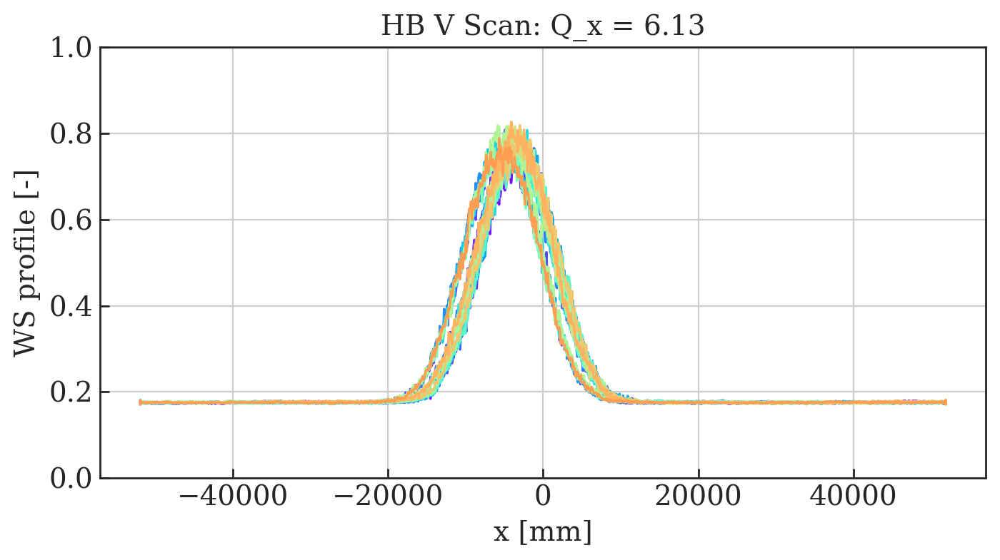

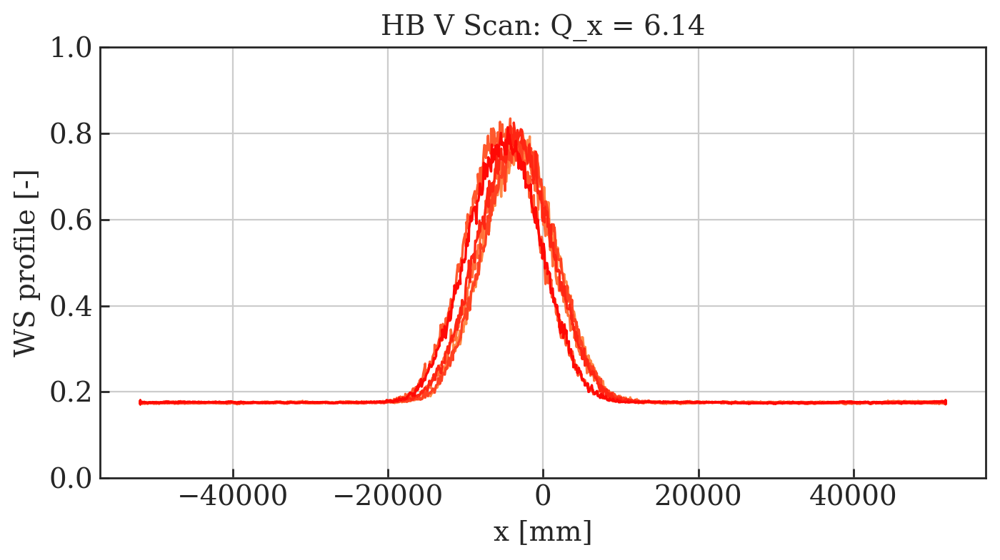

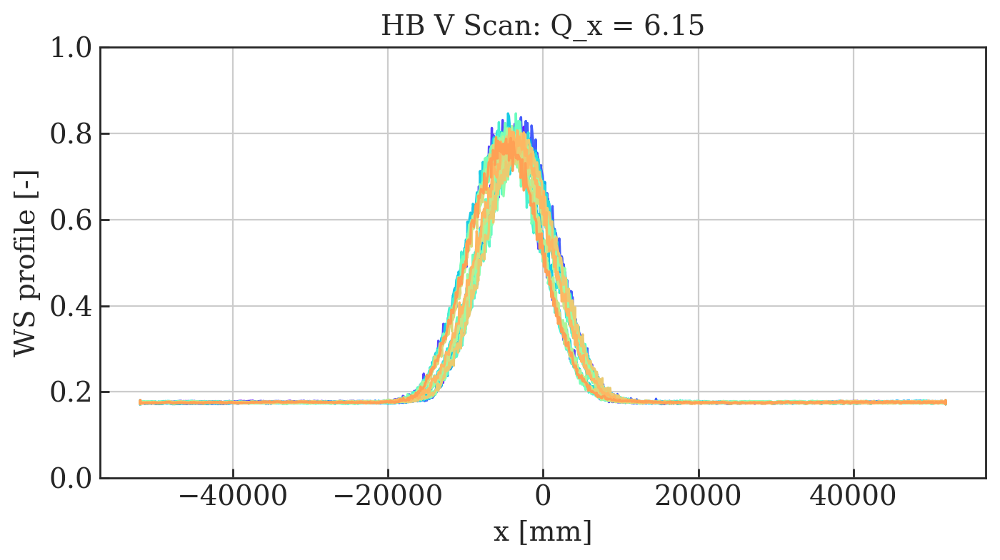

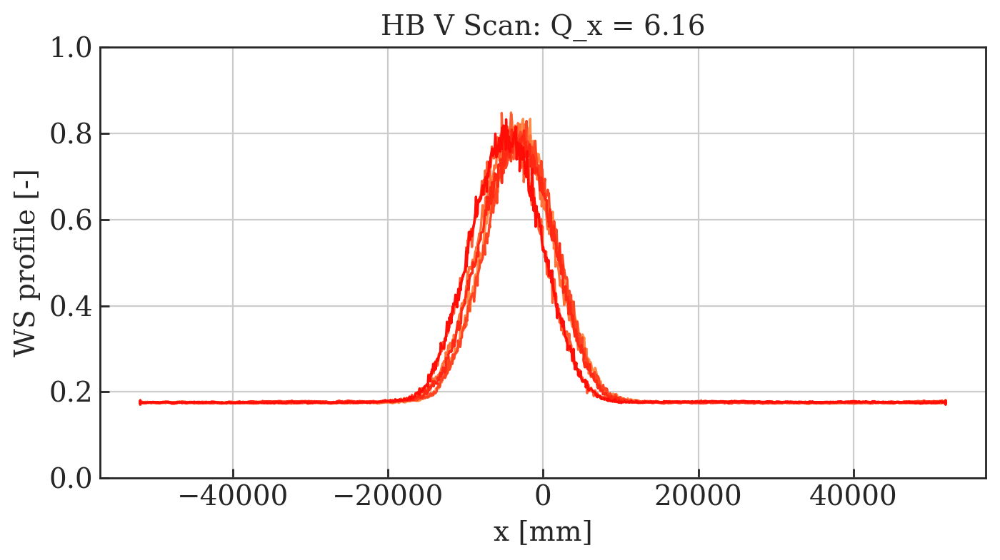

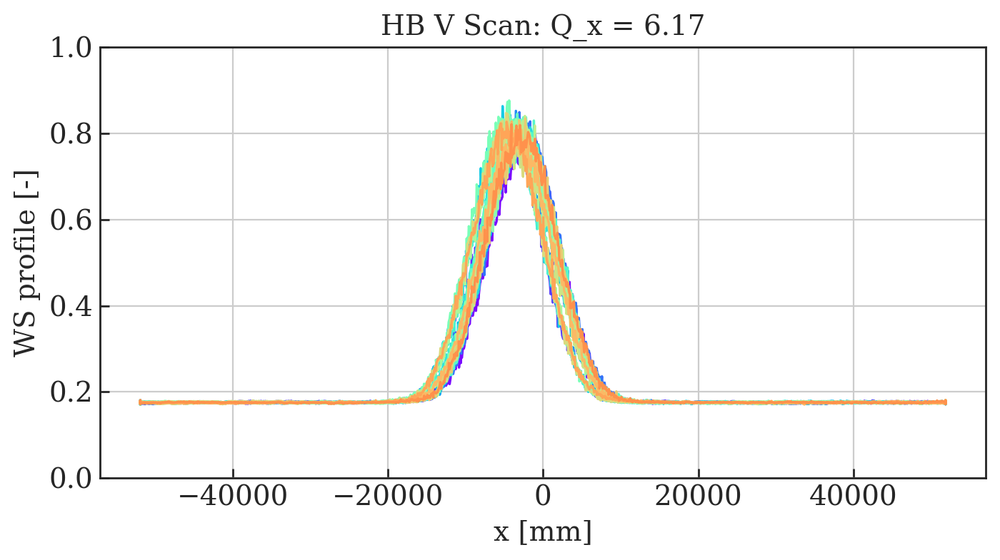

...

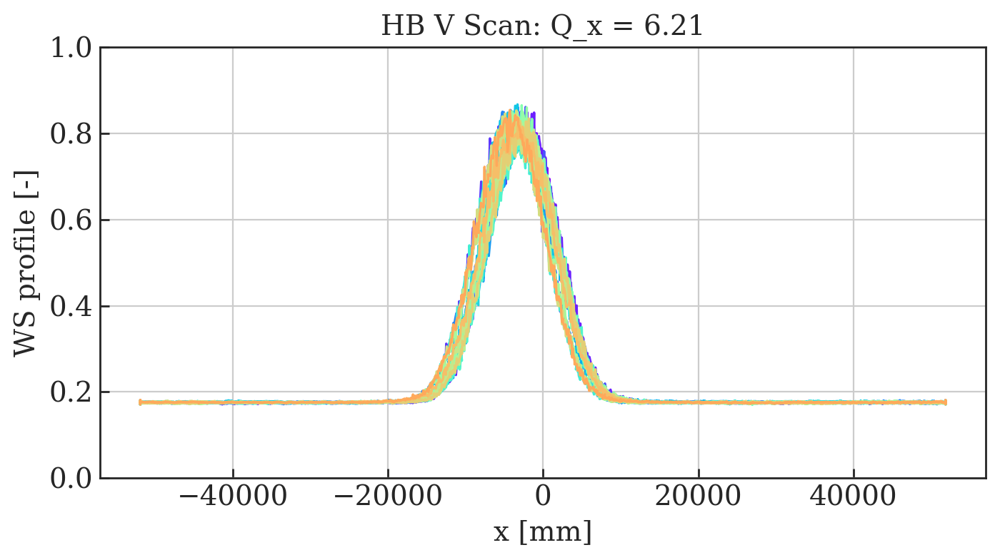

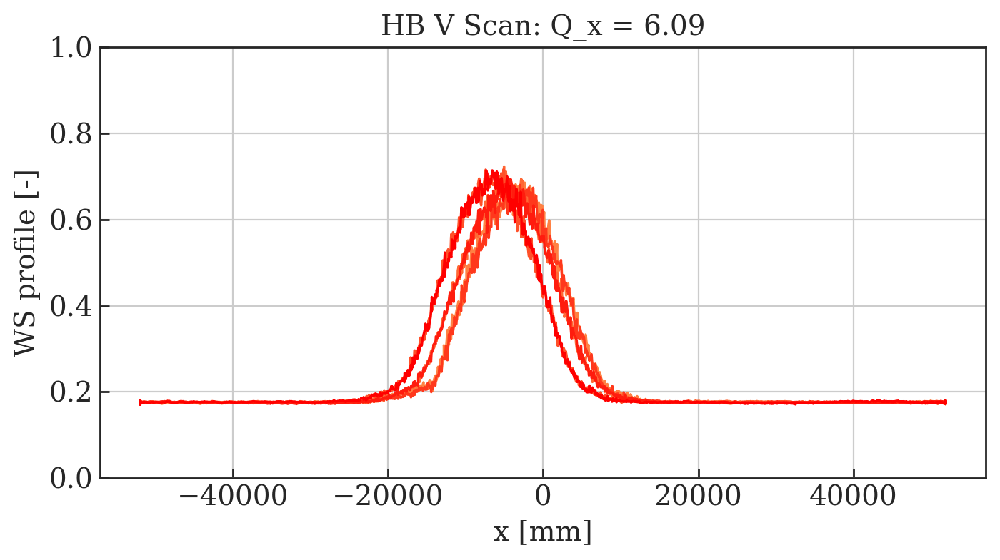

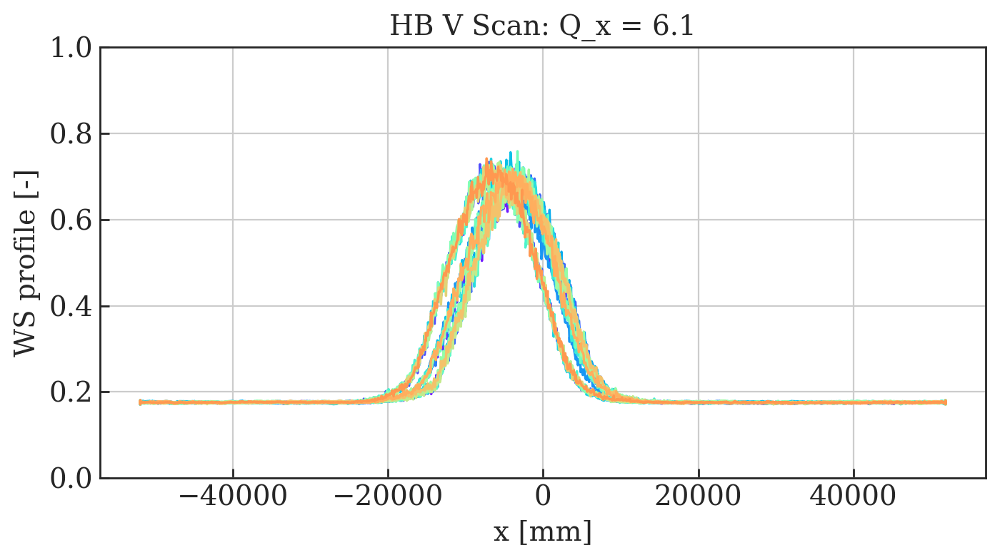

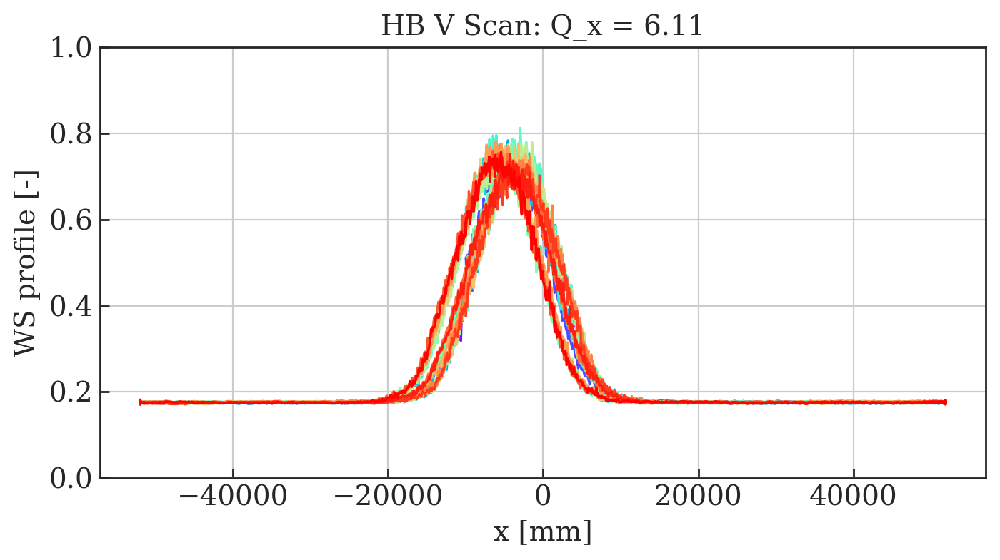

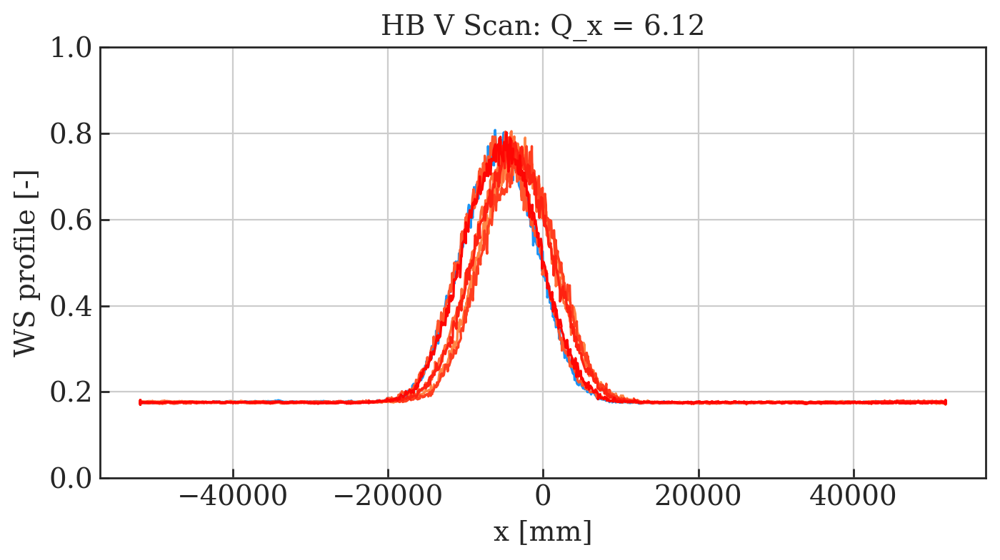

In [46]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['PR.BWS.65.H_ROT:PROF_POSITION_IN'].iloc[value[i]], df0['PR.BWS.65.H_ROT:PROF_DATA_IN'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('x [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_x = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Horizontal_Manual_Fit_WS_Profiles_Raw_Qx=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

## Plot Horizontal emittance

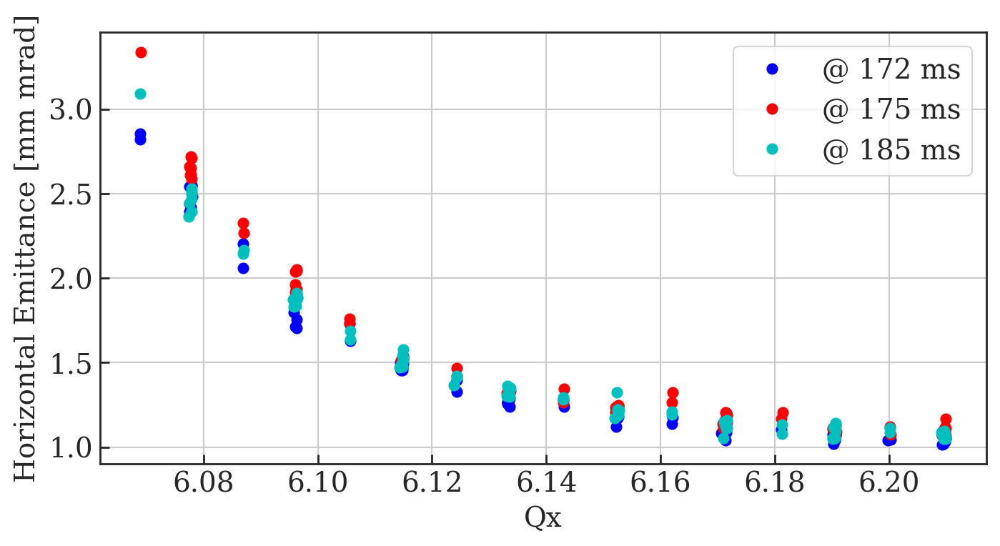

In [47]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
#plt.ylim(0,5);
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_Using_Sim_Optics.png');

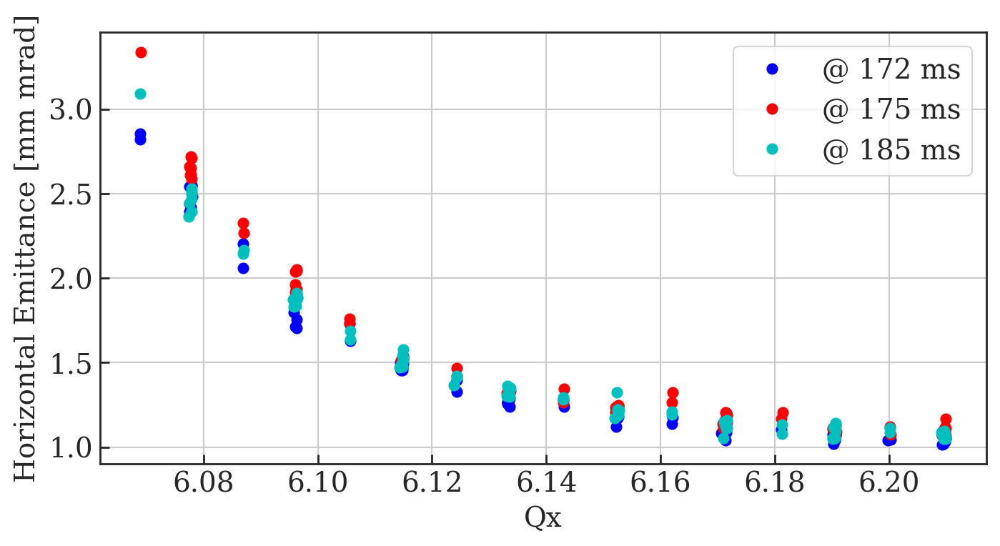

In [48]:
# Plot each shot: Qy vs Ey

fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
#plt.ylim(0,5);
plt.grid();
fig.savefig('MD4224_Horizontal_WS_Delay_Emittance_Using_Sim_Optics.png');

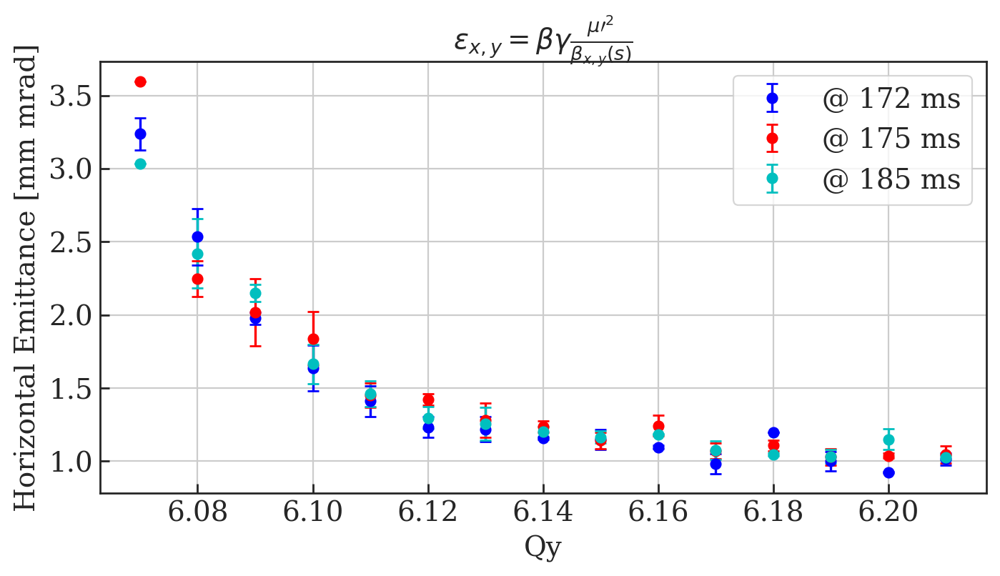

In [49]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

#plt.ylim(0.5, 3.5)

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics.png');

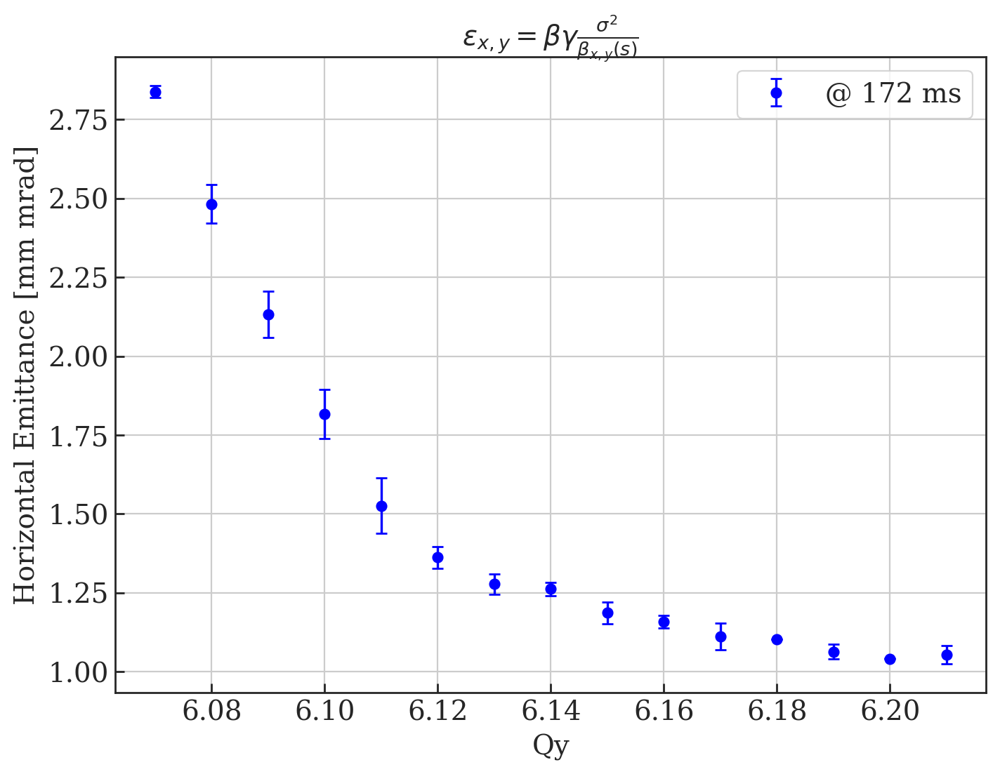

In [50]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 6), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
        
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.xlabel('Qy');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

#plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics_172.png');

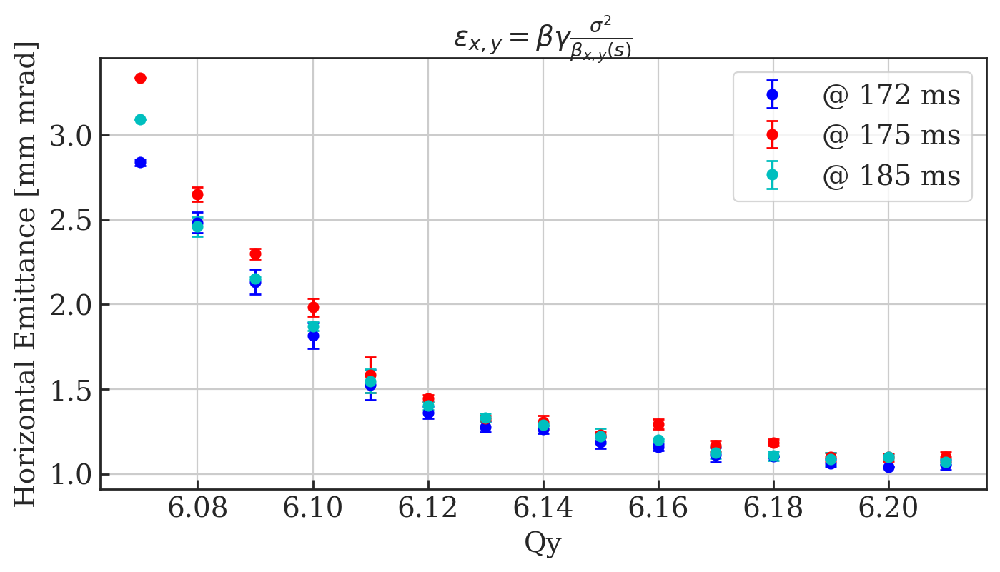

In [51]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

#plt.ylim(0.5, 3.5)

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics.png');

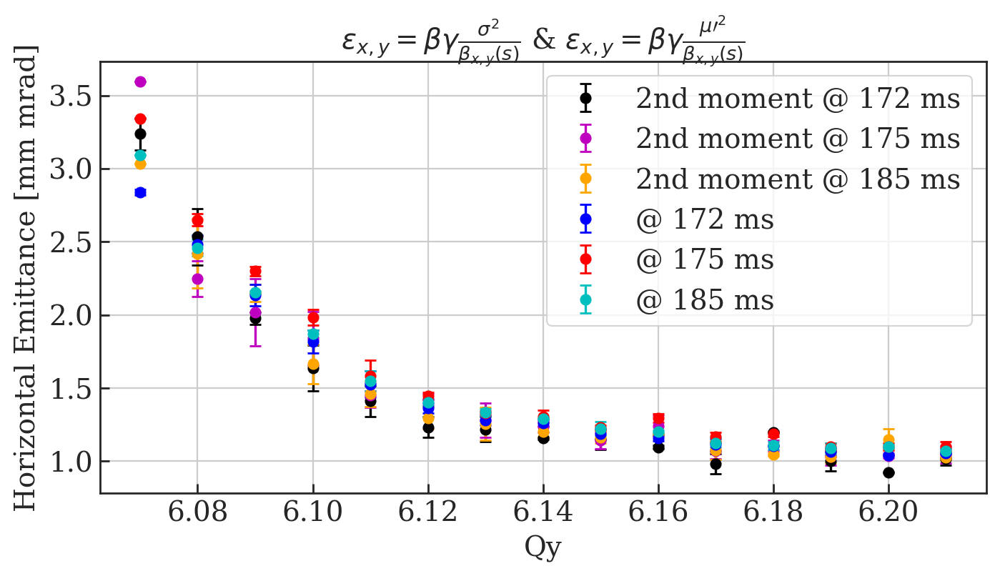

In [52]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_data_1722.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$ & $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_both_Errors_Using_Sim_Optics.png');

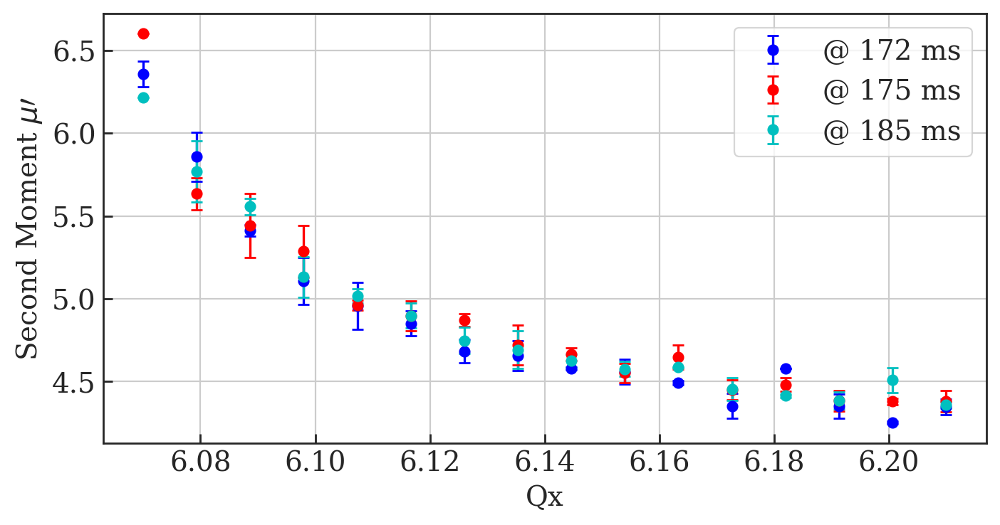

In [53]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_2nd_Moment_Errors_Using_Sim_Optics.png');

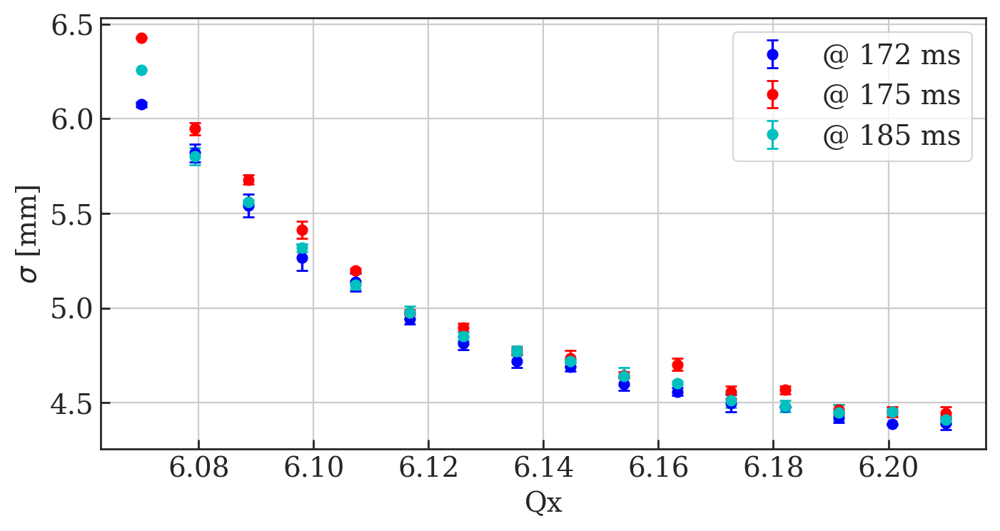

In [54]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'$\sigma$ [mm]');

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Sigma_Errors_Using_Sim_Optics.png');

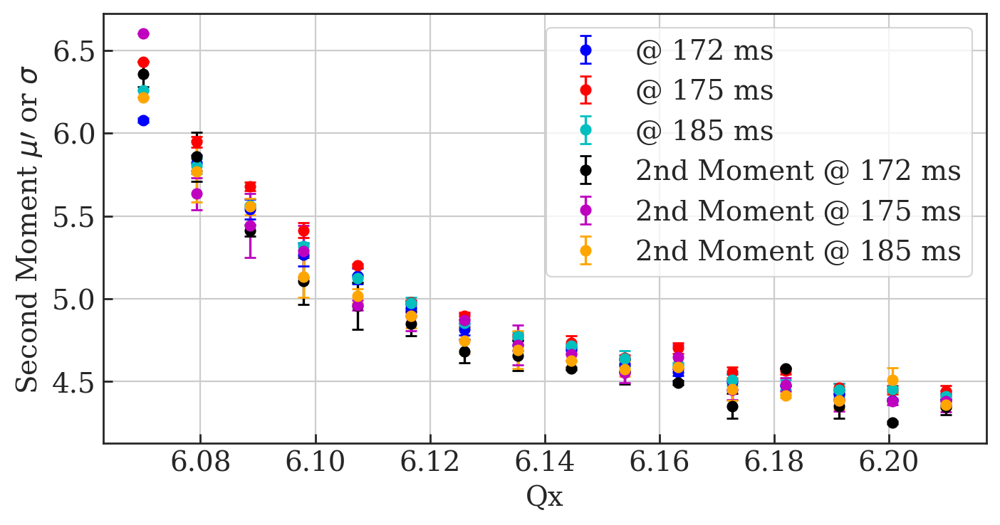

In [55]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_1722.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_data_172.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd Moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd Moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd Moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$ or $\sigma$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_2nd_Moment_and_Sigma_Errors_Using_Sim_Optics.png');

In [56]:
np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>.05)][(df0['Qx']<.1045)] )

2.202622639850918

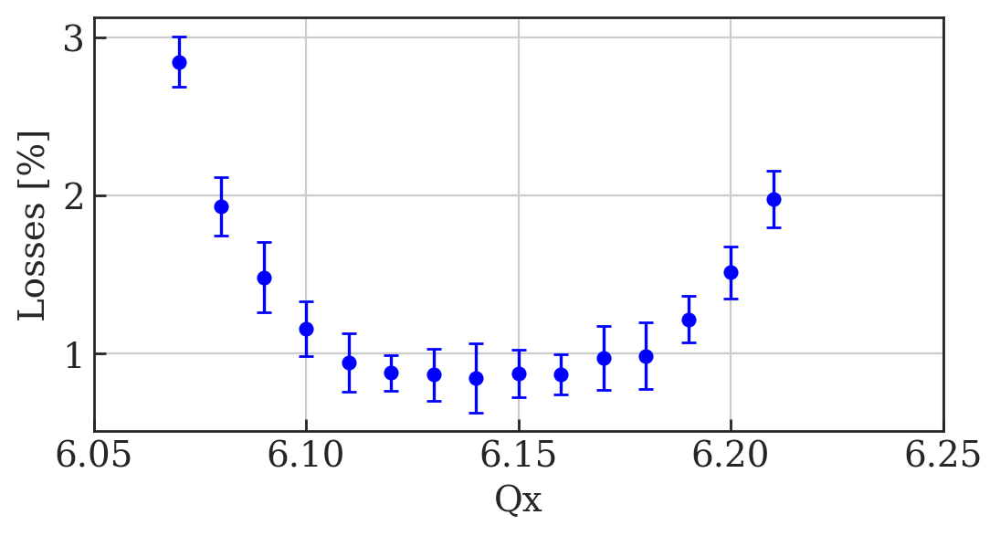

In [57]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['losses'][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['losses'][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.xlabel('Qx');
plt.ylabel('Losses [%]');
plt.xlim(6.05, 6.25)

#plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Losses_Errors_Using_Sim_Optics.png');

# Load Distributions From Simulation Data

In [58]:
# Read .mat files into a dictionary

# matfiles = glob.glob("13_May/*.mat")
#matfiles = glob.glob("../Simulation_Output/V_Scan_Matched_Initial/Bunch_Profiles/*.mat")
matfiles = glob.glob("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/*.mat")
sims = dict()

for f in matfiles:
    first = f.split('/')[-1]
    second = first.split('.')[0]
    sims[str(second)] = f
    
sims

{'607_SbS_c172': '../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/607_SbS_c172.mat',
 '608_SbS_c172': '../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/608_SbS_c172.mat',
 '609_SbS_c172': '../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/609_SbS_c172.mat',
 '610_SbS_c172': '../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/610_SbS_c172.mat',
 '611_SbS_c172': '../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/611_SbS_c172.mat',
 '612_SbS_c172': '../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/612_SbS_c172.mat',
 '613_SbS_c172': '../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/613_SbS_c172.mat',
 '614_SbS_c172': '../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/614_SbS_c172.mat',
 '615_SbS_c172': '../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/615_SbS_c172.mat',
 '616_SbS_c172': '../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/616_SbS_c172.mat',
 '617_SbS_c172': '../MD4224_Re

# Dictionary of tune points

In [59]:
# These are our tune points:
scan_points = np.linspace(607, 621, 15);
scan_points = scan_points/100;

Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
print Qy_points

[6.07, 6.08, 6.09, 6.1, 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2, 6.21]


In [60]:
# Make dictionary of nearest tune point and iterators
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qx'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qx'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

Tune points separated by +/-  0.005


{6.07: array([187, 202, 209, 217]),
 6.08: array([  8,  15,  23,  31,  39,  46,  54,  62,  76,  84,  91,  99, 107,
        114, 128, 136, 142, 148, 155, 163, 171, 179]),
 6.09: array([186, 194, 201, 208, 216, 224]),
 6.1: array([  7,  14,  22,  30,  38,  45,  53,  61,  69,  75,  83,  90,  98,
        106, 113, 121, 127, 135, 141, 154, 162, 170, 178]),
 6.11: array([  6,  21,  29,  37,  52,  60,  68,  82,  89,  97, 105, 112, 120,
        134, 140, 153, 161, 169, 177, 185, 193, 200, 207, 215, 223]),
 6.12: array([ 44, 184, 192, 199, 206, 214, 222]),
 6.13: array([  5,  13,  20,  28,  36,  43,  51,  59,  67,  74,  81,  96, 104,
        111, 119, 126, 133, 147, 160, 168, 176]),
 6.14: array([183, 191, 198, 205, 213, 221]),
 6.15: array([  4,  12,  19,  27,  35,  50,  58,  66,  73,  80,  88,  95, 103,
        110, 118, 125, 132, 146, 152, 159, 167, 175]),
 6.16: array([182, 190, 197, 204, 212, 220]),
 6.17: array([  3,  11,  18,  26,  34,  42,  49,  57,  65,  72,  79,  87,  94,
        102,

# Function to find Peak

# Test Peakfinder

In [61]:
peak = peakfinder(np.array(df0['position H'].iloc[0]), np.array(df0['profile H'].iloc[0]),tolerance = 0.01, verbose=True)
print peak



	MAX(y_dat) =  0.6728868609218155
	index from y_dat peak not within tolerance of 0.01 mm. 
	try manual search
	index =  0
	index of x_dat =  -26.44740240003148  is  0
	Mean of peak point +/- 3 points =  -0.0009820836308117667
	 using peak value
0.6728868609218155


peak @ 77.65471725958027


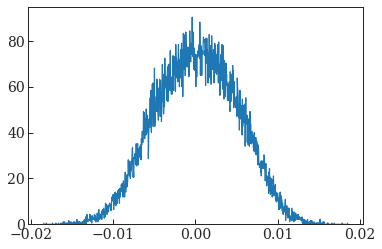

In [62]:
matfiles = glob.glob("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/*.mat")
plt.clf()

d = particles_from_matfile("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/610_SbS_c172.mat")
x, bins_, p = plt.hist(d['particles']['x'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')
    
    
peak = peakfinder(np.array(bins_[:-1]), np.array(x))
print 'peak @', peak

plt.plot(bins_[:-1], x);

# Check all simulation data peaks

In [63]:
for key, value in sorted(sims.iteritems()):
    print value
    d = particles_from_matfile(value)
    plt.clf()
    x, bins_, p = plt.hist(d['particles']['x'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')

    peak = peakfinder(np.array(bins_[:-1]), np.array(x), verbose=True)
    print '\n peak = ', peak, '\n'
    plt.close()

../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/607_SbS_c172.mat

	MAX(y_dat) =  70.0026577683382
	x_dat[index] =  -0.00021539973349458605
	index of x_dat =  -0.00021539973349458605  is  492
	Mean of peak point +/- 3 points =  60.23484505647529

 peak =  60.23484505647529 

../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/608_SbS_c172.mat

	MAX(y_dat) =  73.7430313264063
	x_dat[index] =  -0.0008256533376572936
	index of x_dat =  -0.0008256533376572936  is  485
	Mean of peak point +/- 3 points =  64.1602449836475

 peak =  64.1602449836475 

../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/609_SbS_c172.mat

	MAX(y_dat) =  79.73330827461034
	x_dat[index] =  -0.0006493579333515971
	index of x_dat =  -0.0006493579333515971  is  498
	Mean of peak point +/- 3 points =  67.33184697069653

 peak =  67.33184697069653 

../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/610_SbS_c172.mat

	MAX(y_dat) =  90.23694281952622
	x_dat[index] =  -0.0004004346314

# Plot wirescanner profiles with simulation data


Importing simulation file: 607_SbS_c172
Qx =  6.07 , ctime = 172.0 [ms]
[187, 209]
	 using peak value

Importing simulation file: 608_SbS_c172
Qx =  6.08 , ctime = 172.0 [ms]
[8, 31, 54, 76, 99, 142, 163]
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value

Importing simulation file: 609_SbS_c172
Qx =  6.09 , ctime = 172.0 [ms]
[186, 208]

Importing simulation file: 610_SbS_c172
Qx =  6.1 , ctime = 172.0 [ms]
[7, 30, 53, 75, 98, 121, 141, 162]

Importing simulation file: 611_SbS_c172
Qx =  6.11 , ctime = 172.0 [ms]
[6, 29, 52, 97, 120, 140, 161, 185, 207]
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value

Importing simulation file: 612_SbS_c172
Qx =  6.12 , ctime = 172.0 [ms]
[184, 206]

Impor

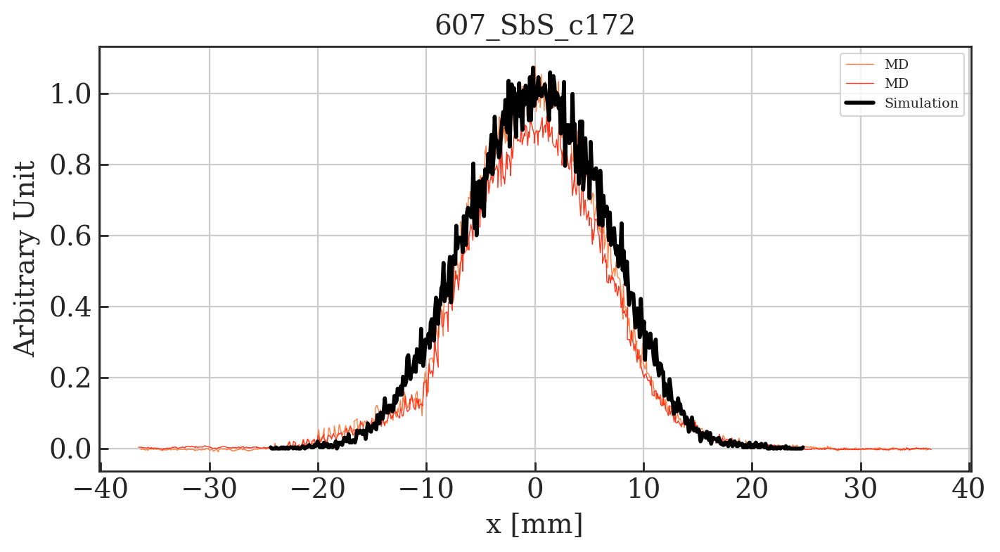

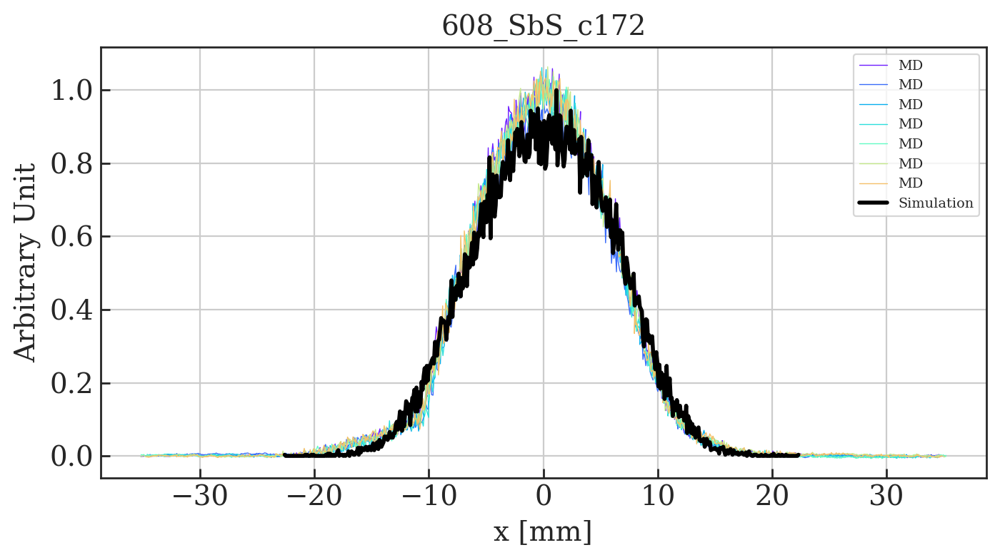

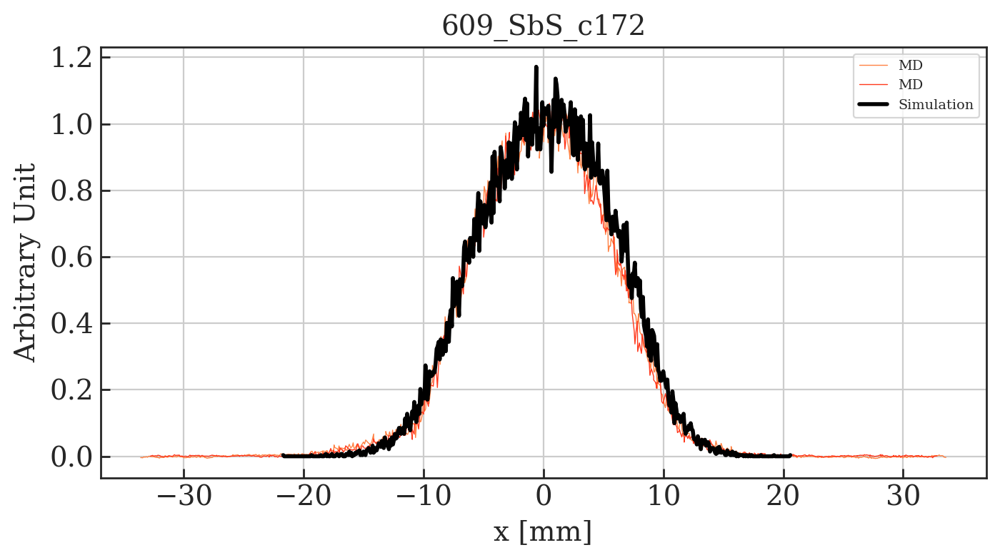

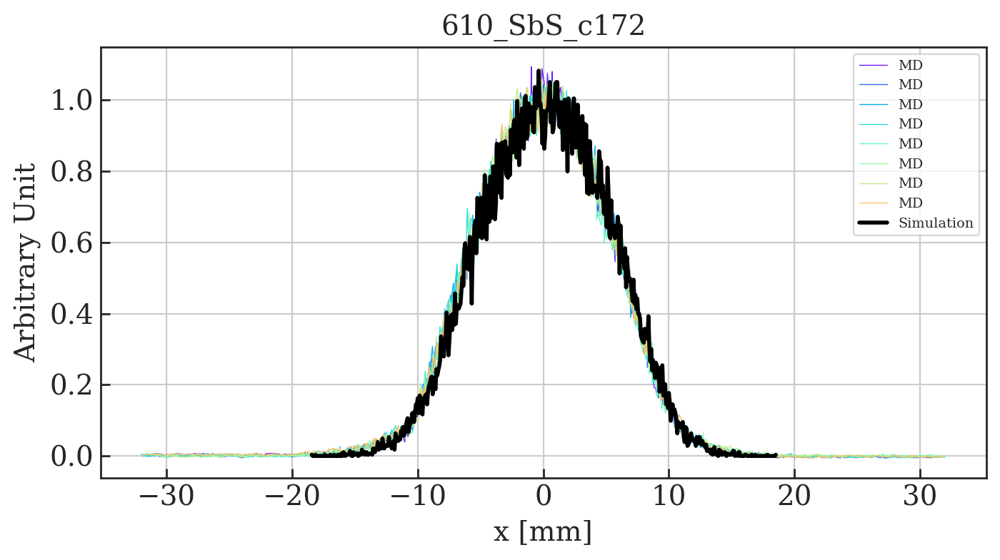

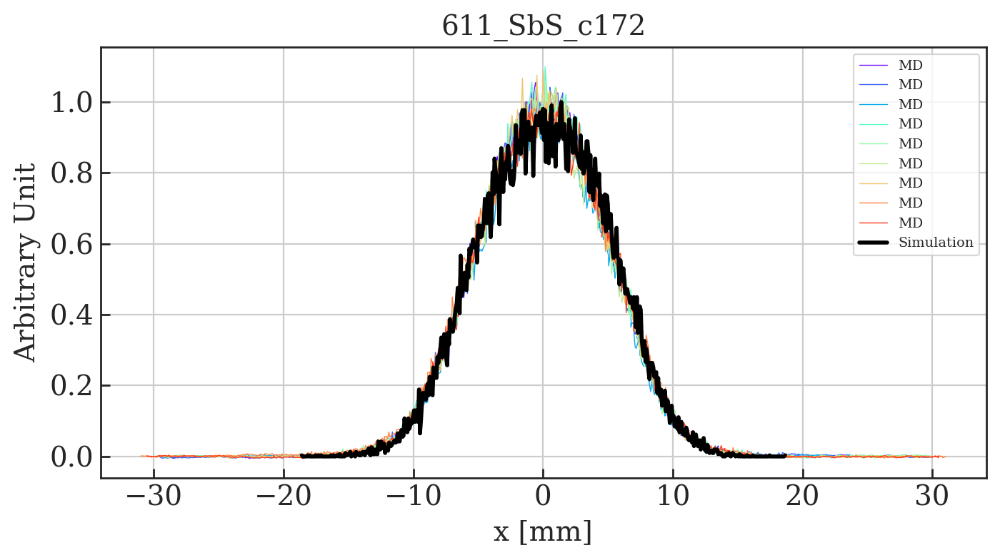

...

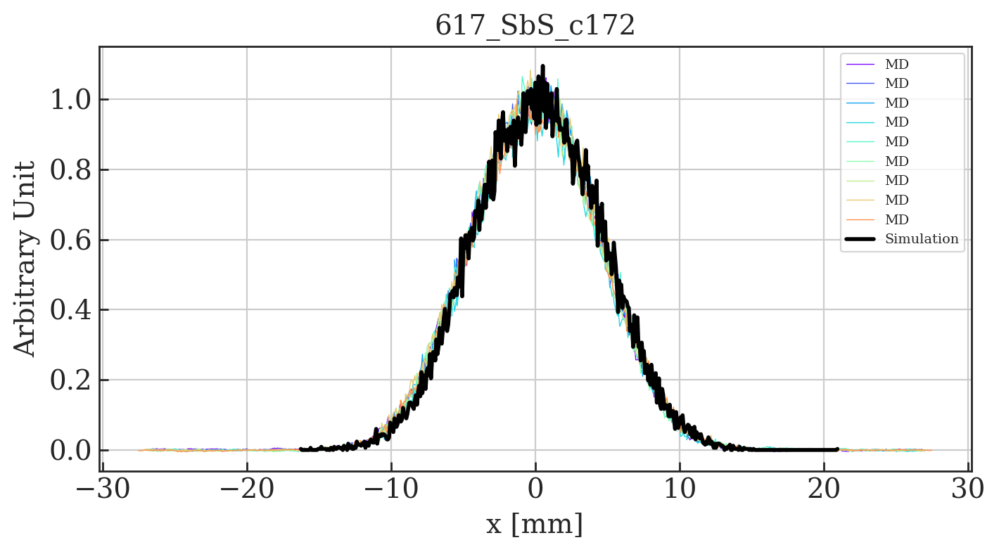

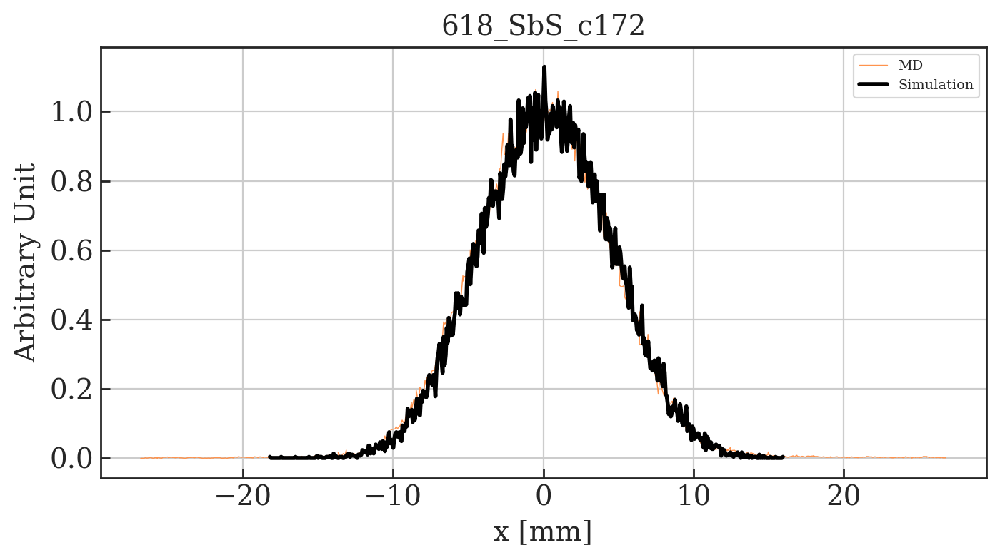

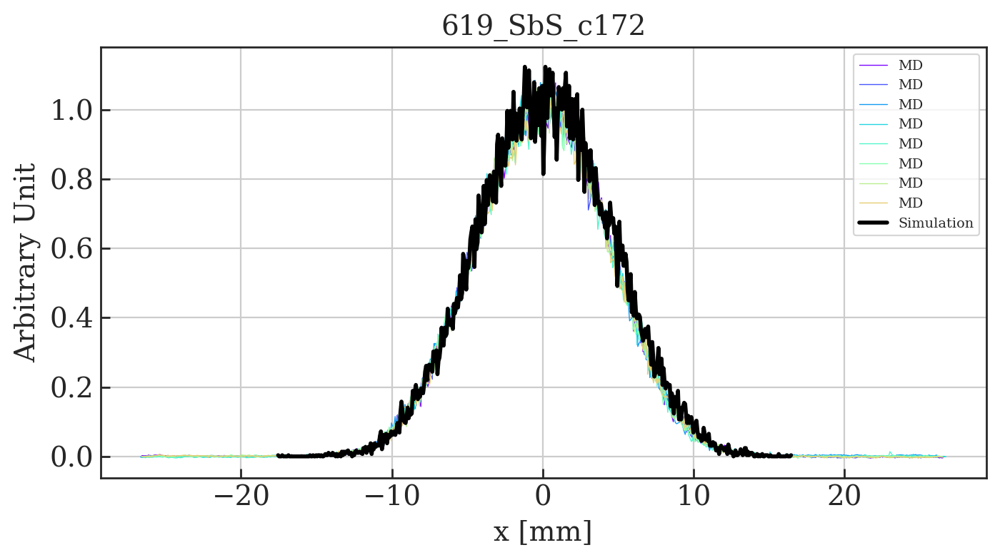

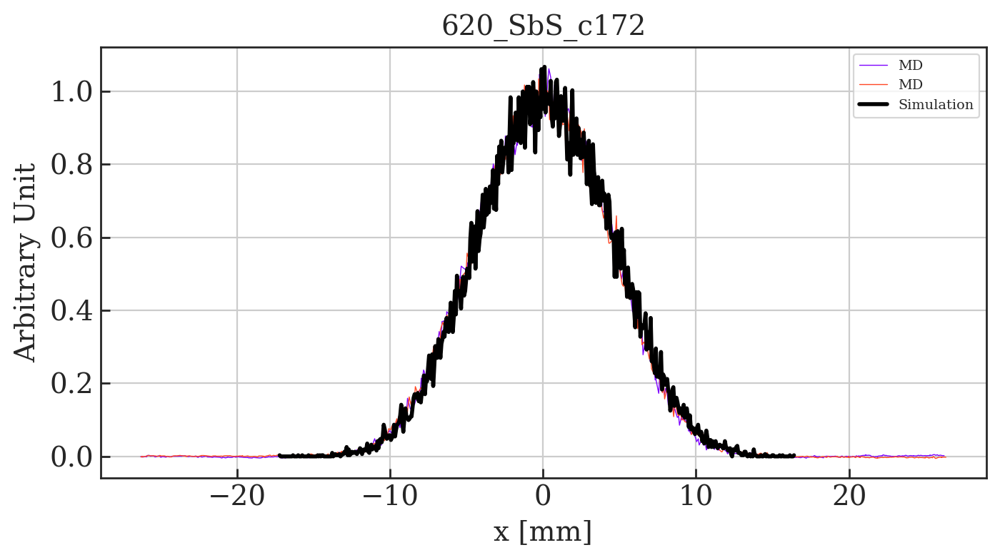

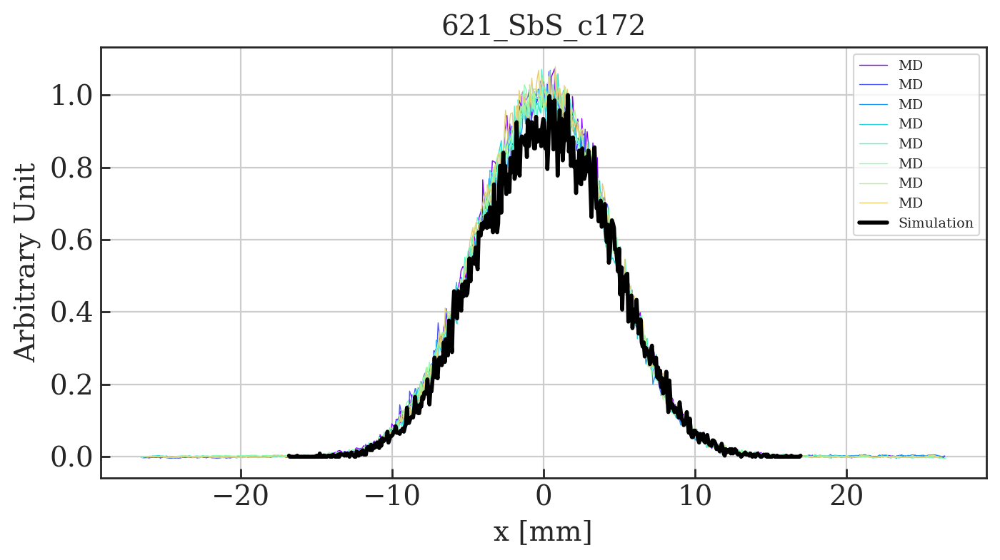

In [64]:
#Main function
verbose = True

for key, value in sorted(sims.iteritems()):
    if verbose: print '\nImporting simulation file:', key
    
    tune_x = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qx = ', tune_x, ', ctime =', time, '[ms]'
        
    d = particles_from_matfile(value)
        
    # Find MD data with same tune and ctime
    
    md_points = []
    for i in tune_points[tune_x]:
        if df0['PR.BWS.65.H_ROT:ACQ_DELAY'].iloc()[i] == time:
            md_points.append(i)
            
    if verbose: print md_points
        
    # Plot data
    main_label = key
    Plot_profiles_MD_cf_Sims(d, df0, md_points, 0, main_label, bins=500)  

# Compare SC Models only


Importing simulation file: 607_SbS_c172
Qx =  6.07 , ctime = 172.0 [ms], label =  SbS
[187, 209]

	MAX(y_dat) =  0.07000265776833227
	x_dat[index] =  -0.21539973349458919
	index of x_dat =  -0.21539973349458919  is  492
	Mean of peak point +/- 3 points =  0.060234845056475576

Importing simulation file: 608_SbS_c172
Qx =  6.08 , ctime = 172.0 [ms], label =  SbS
[8, 31, 54, 76, 99, 142, 163]

	MAX(y_dat) =  0.07374303132640889
	x_dat[index] =  -0.8256533376572932
	index of x_dat =  -0.8256533376572932  is  485
	Mean of peak point +/- 3 points =  0.06416024498364771

Importing simulation file: 609_SbS_c172
Qx =  6.09 , ctime = 172.0 [ms], label =  SbS
[186, 208]

	MAX(y_dat) =  0.07973330827461132
	x_dat[index] =  -0.6493579333516024
	index of x_dat =  -0.6493579333516024  is  498
	Mean of peak point +/- 3 points =  0.06733184697069641

Importing simulation file: 610_SbS_c172
Qx =  6.1 , ctime = 172.0 [ms], label =  SbS
[7, 30, 53, 75, 98, 121, 141, 162]

	MAX(y_dat) =  0.09023694281953

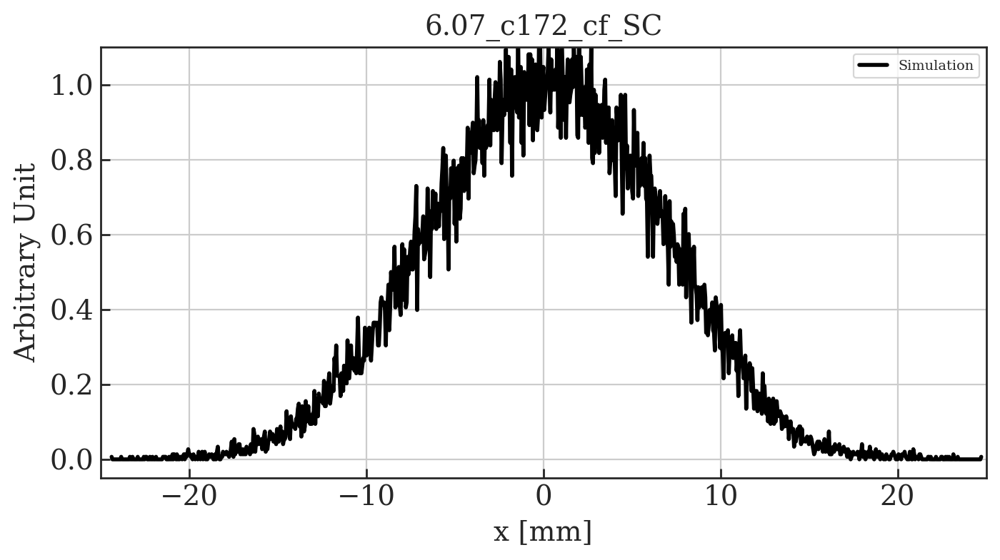

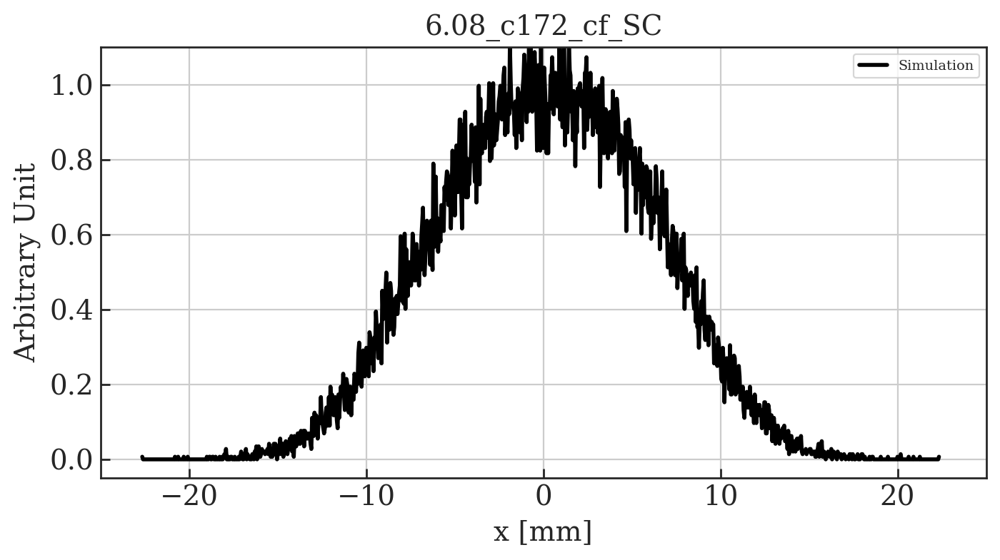

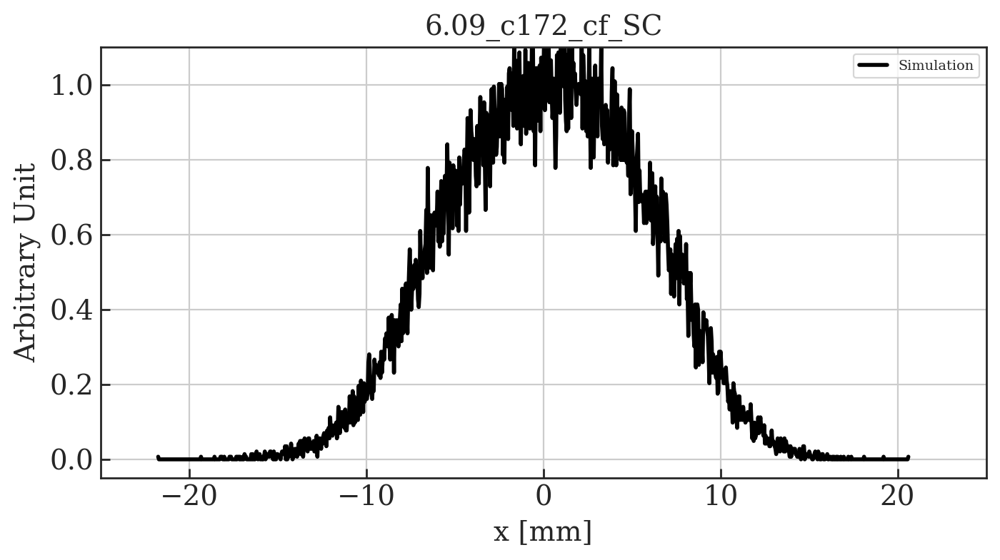

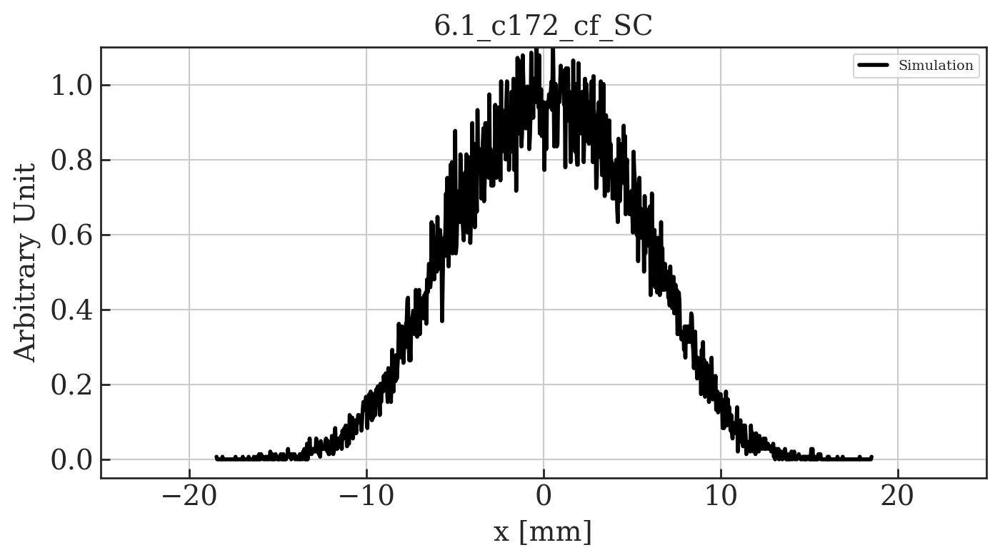

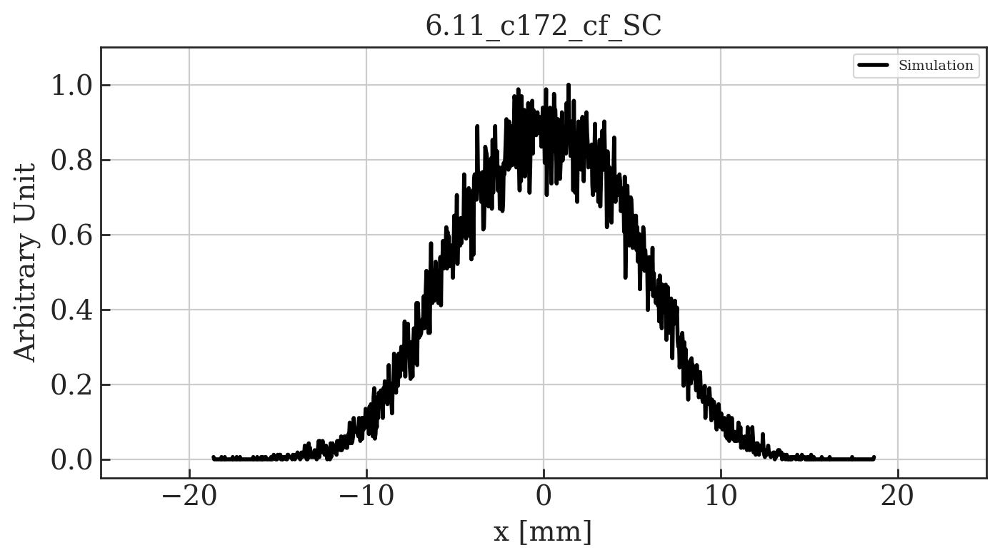

...

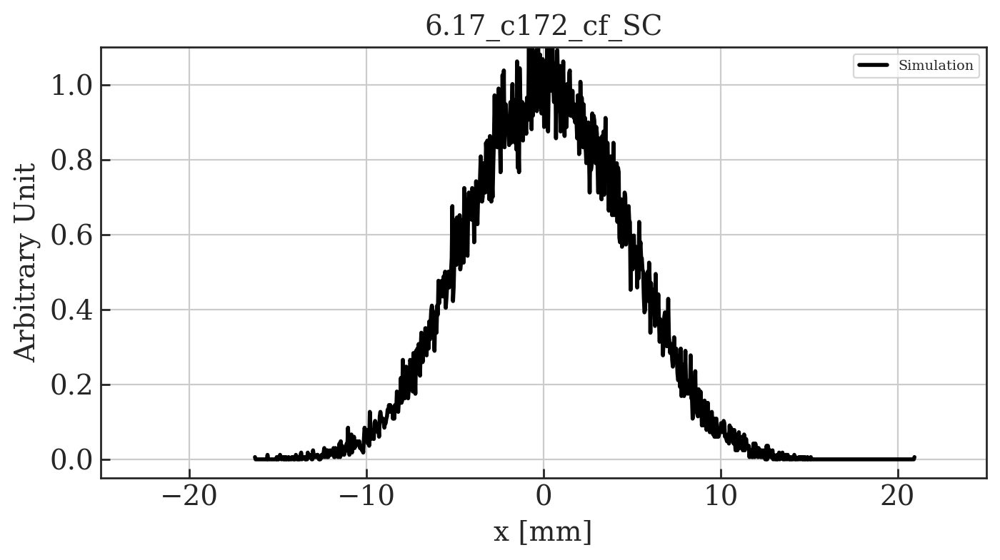

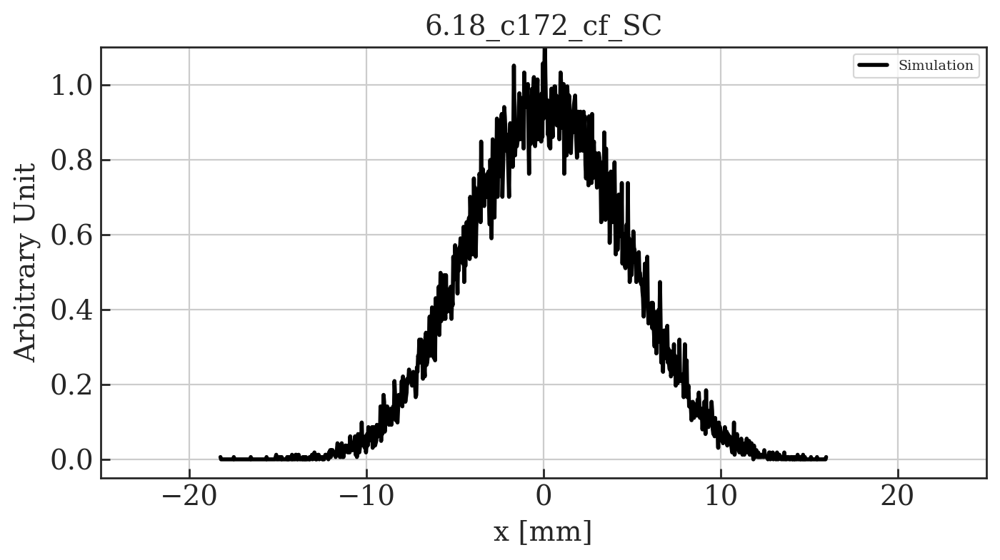

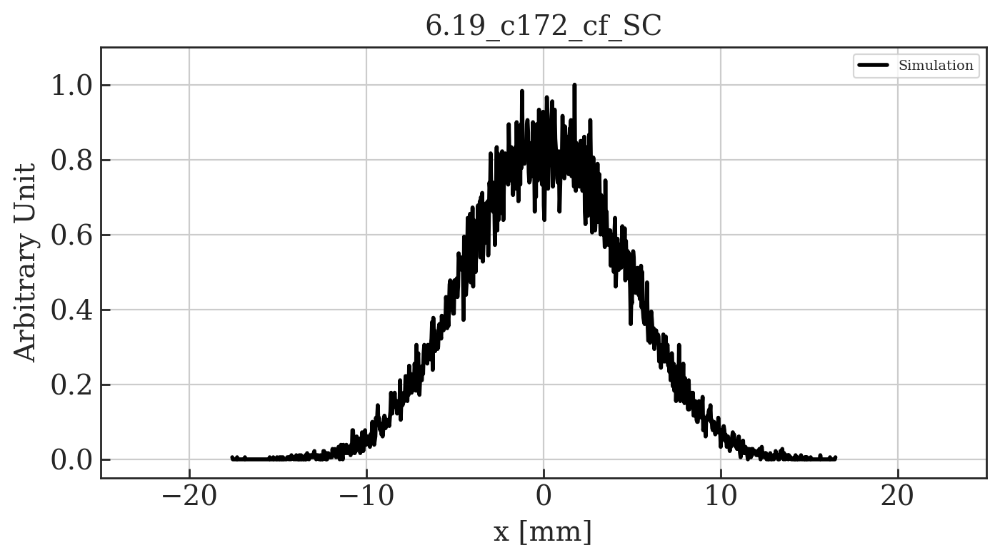

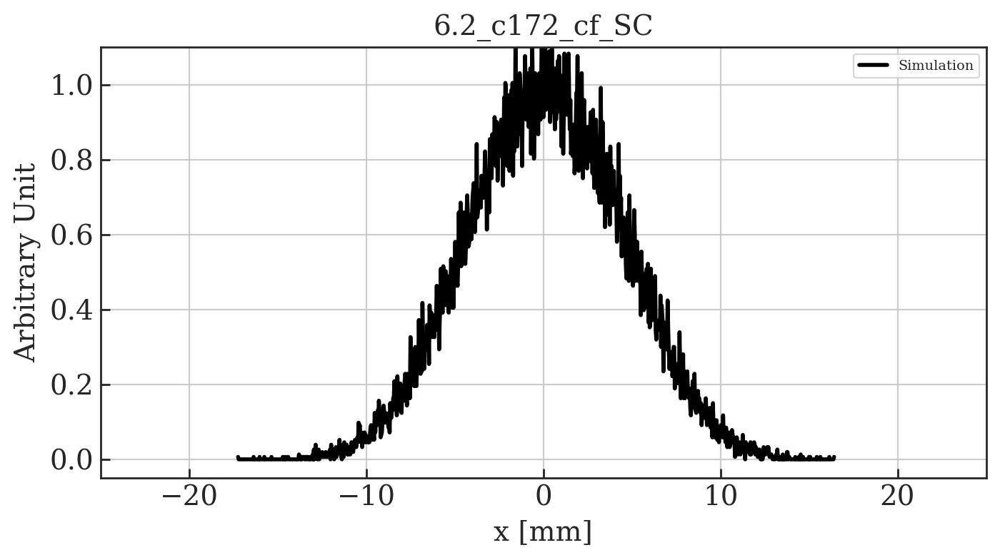

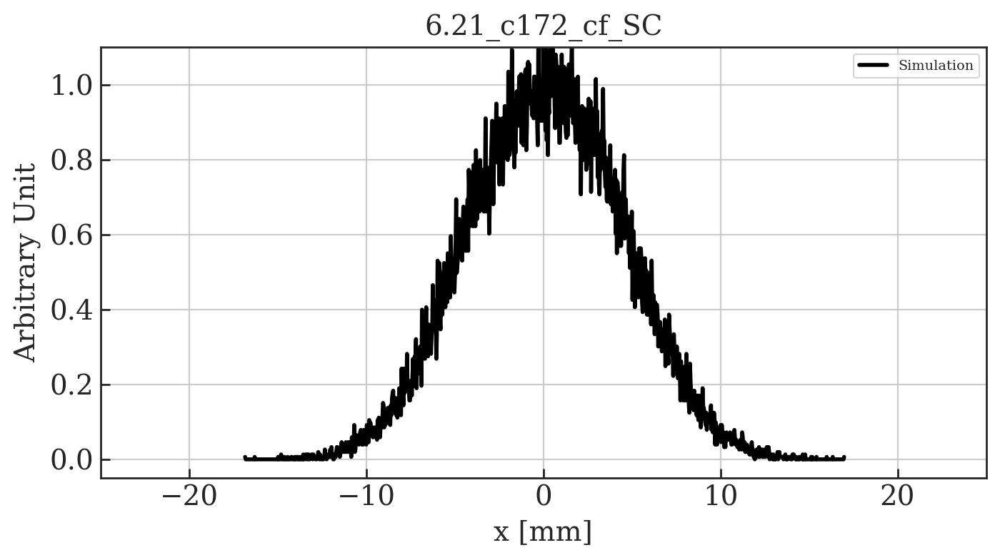

In [65]:
#Main function to plot comparison plots without MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qx = ', tune_y, ', ctime =', time, '[ms], label = ', label

        sim_labels=['Simulation']
        
        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.65.H_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        else: print 'ERROR: More than 3 space charge methods found'

# Compare Sims and MD data


Importing simulation file: 607_SbS_c172
Qy =  6.07 , ctime = 172.0 [ms], label =  SbS
[187, 209]

	MAX(y_dat) =  0.06308379043076819
	index from y_dat peak not within tolerance of 1 mm. 
	try manual search
	index =  0
	index of x_dat =  -24.392767478602533  is  0
	Mean of peak point +/- 3 points =  3.488504539950281e-05
	 using peak value
	 using peak value

Importing simulation file: 608_SbS_c172
Qy =  6.08 , ctime = 172.0 [ms], label =  SbS
[8, 31, 54, 76, 99, 142, 163]

	MAX(y_dat) =  0.06539141091112781
	x_dat[index] =  0.9751947914654231
	index of x_dat =  0.9751947914654231  is  105
	Mean of peak point +/- 3 points =  0.06244676663096861
	 using peak value

Importing simulation file: 609_SbS_c172
Qy =  6.09 , ctime = 172.0 [ms], label =  SbS
[186, 208]

	MAX(y_dat) =  0.07237331058772169
	x_dat[index] =  0.9191208204620835
	index of x_dat =  0.9191208204620835  is  107
	Mean of peak point +/- 3 points =  0.06797887973437859

Importing simulation file: 610_SbS_c172
Qy =  6.1 , ct

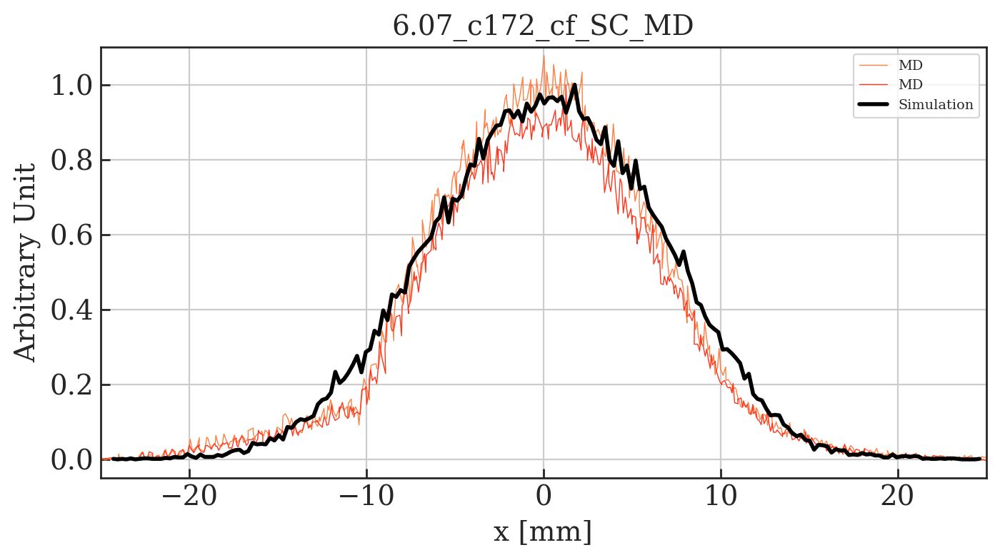

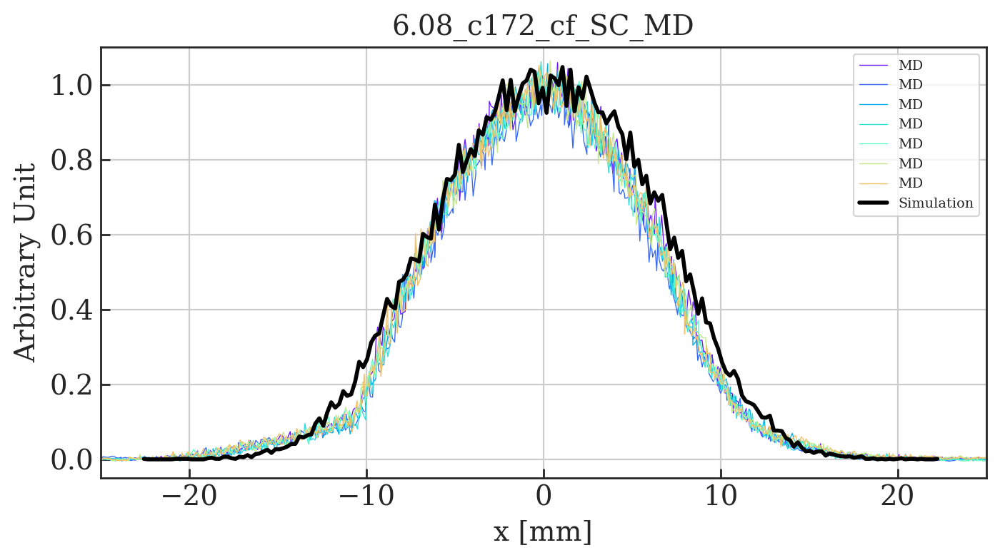

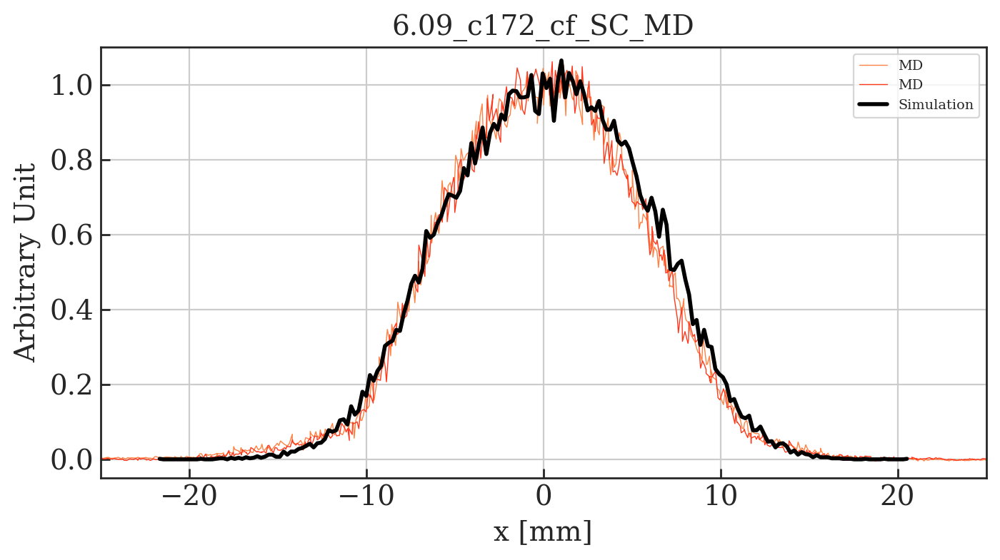

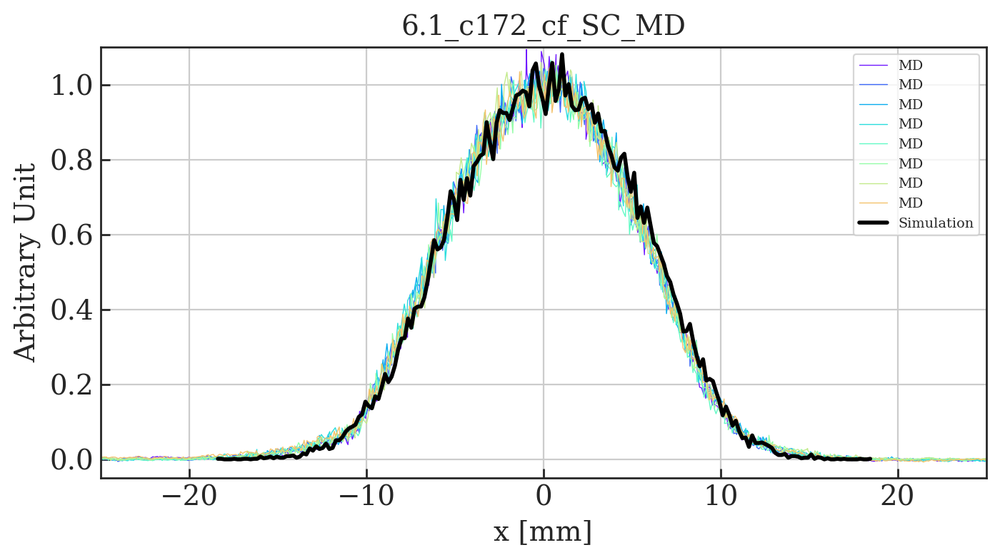

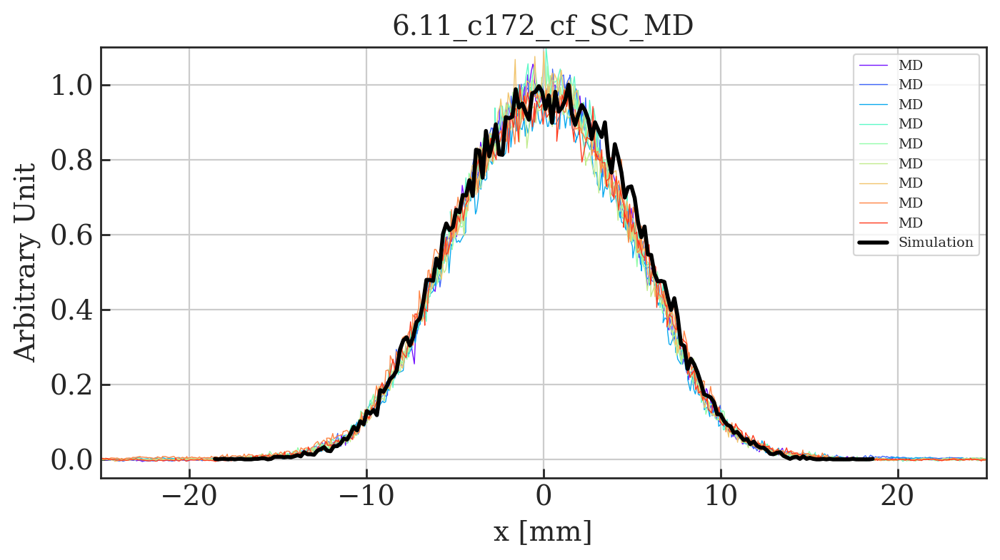

...

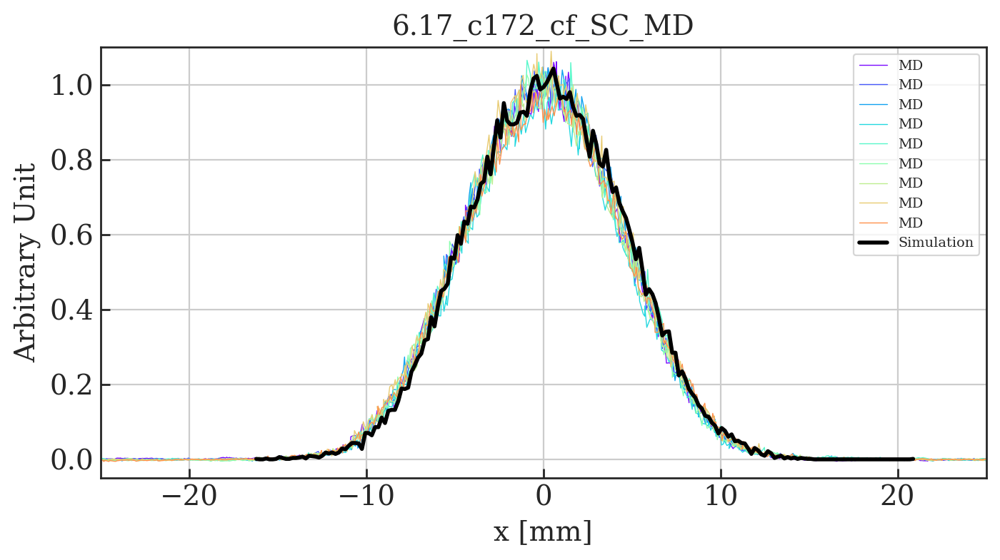

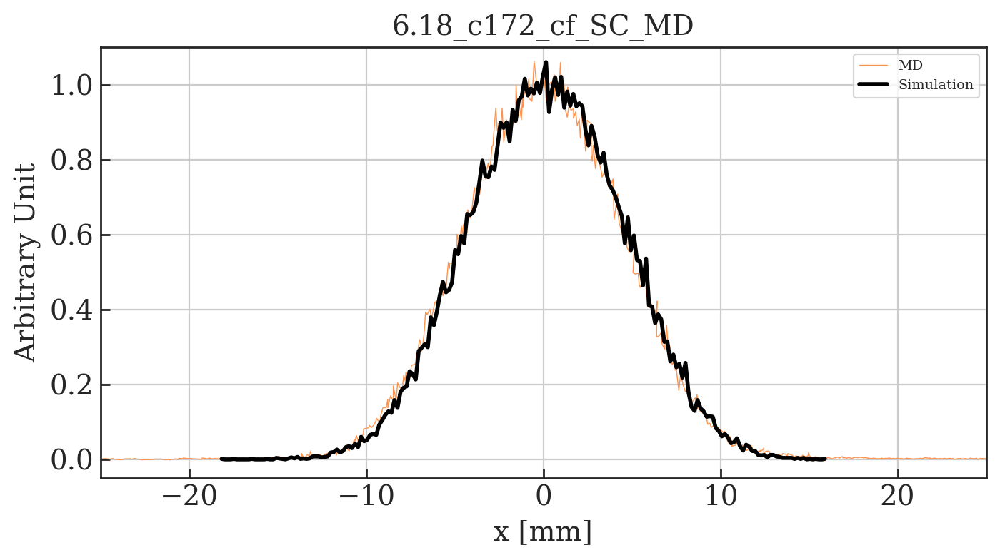

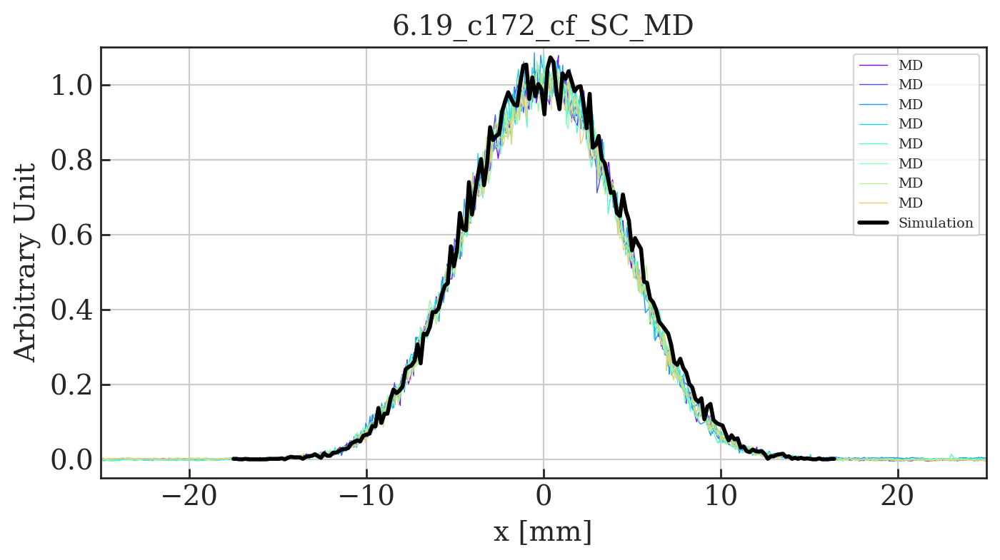

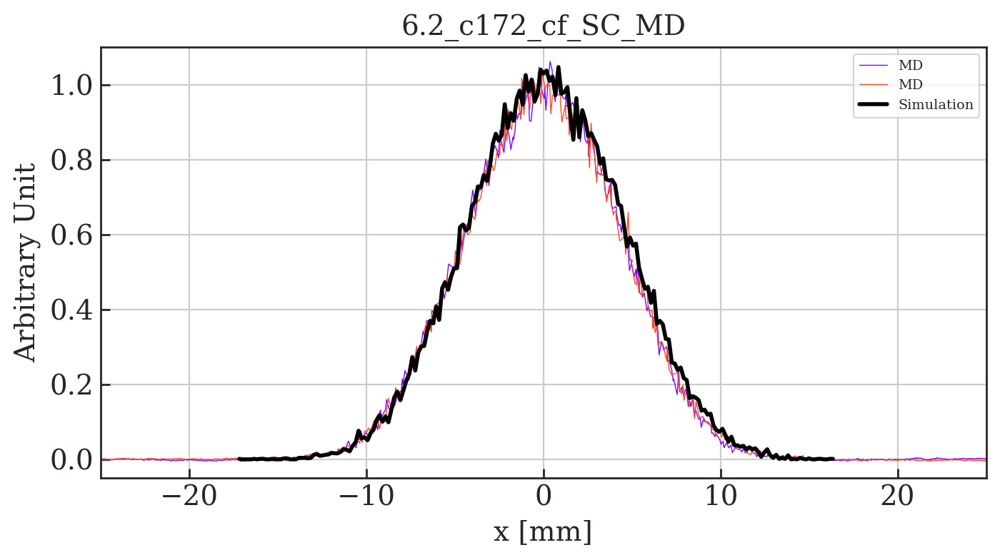

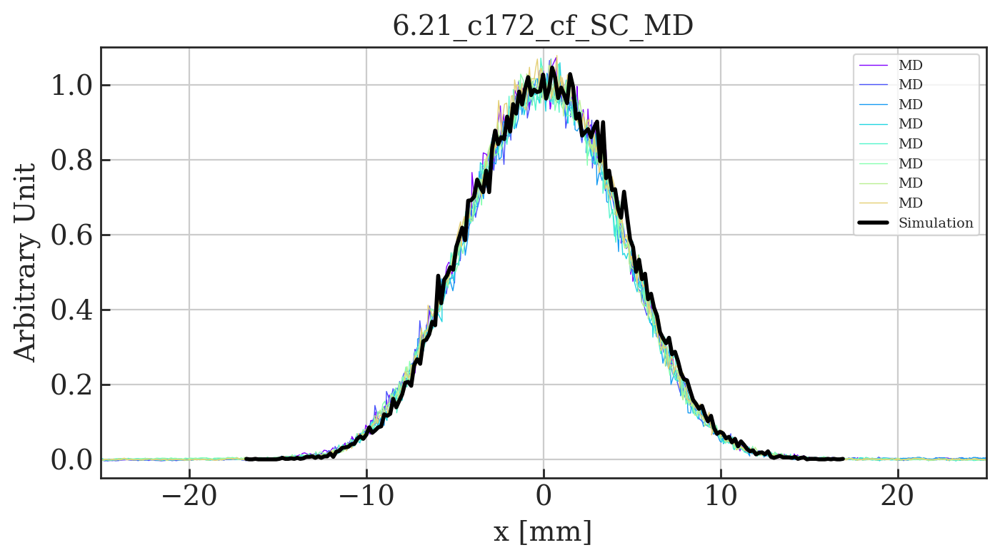

In [66]:
#Main function to plot comparison plots with MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label
        
        sim_labels=['Simulation']

        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.65.H_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC_MD'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 0, main_label=main_label, bins=200, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 0, particles_from_matfile(this_plot[1]), main_label=main_label, bins=200, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 0, particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, bins=200, sim_labels=sim_labels, plot_md=True)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Calculate emittances for simulated bunches

Qx =  6.07 , ctime = 172.0 [ms]
Qx =  6.08 , ctime = 172.0 [ms]
Qx =  6.09 , ctime = 172.0 [ms]
Qx =  6.1 , ctime = 172.0 [ms]
Qx =  6.11 , ctime = 172.0 [ms]
Qx =  6.12 , ctime = 172.0 [ms]
Qx =  6.13 , ctime = 172.0 [ms]
Qx =  6.14 , ctime = 172.0 [ms]
Qx =  6.15 , ctime = 172.0 [ms]
Qx =  6.16 , ctime = 172.0 [ms]
Qx =  6.17 , ctime = 172.0 [ms]
Qx =  6.18 , ctime = 172.0 [ms]
Qx =  6.19 , ctime = 172.0 [ms]
Qx =  6.2 , ctime = 172.0 [ms]
Qx =  6.21 , ctime = 172.0 [ms]


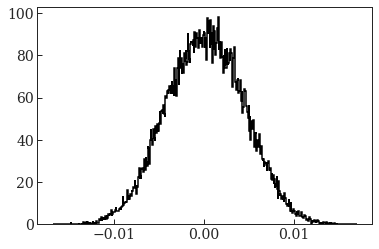

In [67]:
# Make dataframe with name, tunes, position V, profile V 
data = []

# Each row as a list
for key, value in sorted(sims.iteritems()):
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qx = ', tune_y, ', ctime =', time, '[ms]'

    d = particles_from_matfile(value)
    plt.clf()
    x1, bins_1, p1 = plt.hist(d['particles']['x'][0][0][0], bins = 500, density=True, histtype=u'step', lw=1.5, color='k')
          
    qy = 6.24
    qx = tune_y
    pos = np.array(bins_1[:-1]) + (abs(bins_1[0]-bins_1[1])/2)
    prof = x1
    
    new_data = [qx, qy, pos, prof]
    
    data.append(new_data)    

# Create dataframe
df_sim = pd.DataFrame(data, columns = ['Qx', 'Qy', 'PR.BWS.65.H_ROT:PROF_POSITION_IN', 'PR.BWS.65.H_ROT:PROF_DATA_IN'])

In [68]:
df_sim

,Qx,Qy,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN
0,6.07,6.24,"[-0.024343626487250684, -0.024245344504546996,...","[0.20349609816376663, 0.0, 0.0, 0.0, 0.0, 0.20..."
1,6.08,6.24,"[-0.02261591570004215, -0.02252587329358602, -...","[0.2221175642361721, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,6.09,6.24,"[-0.02171784281565975, -0.021633060180318464, ...","[0.2358973617591925, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,6.10,6.24,"[-0.01842608963673909, -0.01835206230612175, -...","[0.2701704874836241, 0.0, 0.0, 0.0, 0.27017048..."
4,6.11,6.24,"[-0.018593139504973915, -0.018518504071113825,...","[0.2679692334540658, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
5,6.12,6.24,"[-0.01809445419373009, -0.018016903633338514, ...","[0.5157925332586638, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
6,6.13,6.24,"[-0.016839495863406998, -0.016768565291276533,...","[0.2819658632276837, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
7,6.14,6.24,"[-0.0159973191381702, -0.01592987597577459, -0...","[0.2965459994696282, 0.29654599946961296, 0.0,..."
8,6.15,6.24,"[-0.01699908734846183, -0.016932071274230184, ...","[0.2984358637730539, 0.2984358637730539, 0.0, ..."
9,6.16,6.24,"[-0.01733182048862815, -0.01726428932297039, -...","[0.29615955544668565, 0.0, 0.29615955544668565..."


In [69]:
# Gaussian and 2nd moment fits
df_sim_filtered = Multi_filter_sim(df_sim, with_plot = True, WS = '65.H', smooth=True)


Multi_filter row  0

	initial guess: mu0 0.4234331540794046
	initial guess: offs0 0.01356640654425063
	initial guess: ampl 60.434465038483516
	initial guess: slope 0
	initial guess: sigma0 35.05599383061584
3 parameter fit sigma =  6.591165872836085  +/-  0.01148206132033574
Removing centre shift of  0.20019598966383834
Second moment =  6.391648565412478

Multi_filter row  1

	initial guess: mu0 0.9751947914654214
	initial guess: offs0 0.0
	initial guess: ampl 62.58215257488413
	initial guess: slope 0
	initial guess: sigma0 32.11703669772996
3 parameter fit sigma =  6.227008121659448  +/-  0.01968320356485251
Removing centre shift of  0.22583870076974147
Second moment =  5.829269946547189

Multi_filter row  2

	initial guess: mu0 1.4278166325097703
	initial guess: offs0 0.0
	initial guess: ampl 68.35182223011222
	initial guess: slope 0
	initial guess: sigma0 30.240939994342007
3 parameter fit sigma =  5.769808767502352  +/-  0.021381596216992167
Removing centre shift of  0.32714385068

/usr/local/bin/start_ipykernel.py:81: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:83: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  6

	initial guess: mu0 0.39663316429609796
	initial guess: offs0 0.01879772421517891
	initial guess: ampl 84.78042159962979
	initial guess: slope 0
	initial guess: sigma0 25.30007668347811
3 parameter fit sigma =  4.711717430823863  +/-  0.009962192781351653
Removing centre shift of  0.19817335675790895
Second moment =  4.49813656356908

Multi_filter row  7

	initial guess: mu0 -0.6877212743653157
	initial guess: offs0 0.0197697332979742
	initial guess: ampl 85.02679866697541
	initial guess: slope 0
	initial guess: sigma0 24.05615983537904
3 parameter fit sigma =  4.630196463579673  +/-  0.009165575670771831
Removing centre shift of  0.18727558953558332
Second moment =  4.4291555747352005

Multi_filter row  8

	initial guess: mu0 -0.24506879055062603
	initial guess: offs0 0.019895724251536927
	initial guess: ampl 89.80645702511606
	initial guess: slope 0
	initial guess: sigma0 23.903822655873306
3 parameter fit sigma =  4.522487930842476  +/-  0.005652771313685336
Re

In [70]:
df_sim_filtered

,Qx,Qy,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H
0,6.07,6.24,"[-0.024343626487250684, -0.024245344504546996,...","[0.20349609816376663, 0.0, 0.0, 0.0, 0.0, 0.20...",6.391649,6.591165872836085,0.011482,1008.7890339696817,0.20019598966383834,"[-24.543822476914524, -24.445540494210835, -24...","[0.05935302863109863, 0.05862625685194232, 0.0..."
1,6.08,6.24,"[-0.02261591570004215, -0.02252587329358602, -...","[0.2221175642361721, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.829270,6.227008121659448,0.019683,1018.619285742979,0.22583870076974147,"[-22.84175440081189, -22.75171199435576, -22.6...","[0.05367841135707494, 0.048125472251170635, 0...."
2,6.09,6.24,"[-0.02171784281565975, -0.021633060180318464, ...","[0.2358973617591925, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.358744,5.769808767502352,0.021382,1021.100331020854,0.32714385068264257,"[-22.044986666342393, -21.960204031001105, -21...","[0.057008529091804865, 0.05111109504782505, 0...."
3,6.10,6.24,"[-0.01842608963673909, -0.01835206230612175, -...","[0.2701704874836241, 0.0, 0.0, 0.0, 0.27017048...",4.945262,5.294508861579428,0.017126,1019.3364358215546,0.24298434717309983,"[-18.66907398391219, -18.595046653294848, -18....","[0.07429688405799707, 0.07140220026352985, 0.0..."
4,6.11,6.24,"[-0.018593139504973915, -0.018518504071113825,...","[0.2679692334540658, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.794881,5.129639868510316,0.017734,1019.3441264759875,0.16624786282766002,"[-18.759387367801576, -18.684751933941484, -18...","[0.0714584622544187, 0.07145846225441865, 0.07..."
5,6.12,6.24,"[-0.01809445419373009, -0.018016903633338514, ...","[0.5157925332586638, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.584987,4.844014811755803,0.013299,1015.6019556700967,0.22666573021973802,"[-18.32111992394983, -18.243569363558255, -18....","[0.10745677776222158, 0.10193042919159315, 0.0..."
6,6.13,6.24,"[-0.016839495863406998, -0.016768565291276533,...","[0.2819658632276837, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.498137,4.711717430823863,0.009962,1012.9626874069554,0.19817335675790895,"[-17.037669220164908, -16.966738648034443, -16...","[0.06579203475312621, 0.06176395099273073, 0.0..."
7,6.14,6.24,"[-0.0159973191381702, -0.01592987597577459, -0...","[0.2965459994696282, 0.29654599946961296, 0.0,...",4.429156,4.630196463579673,0.009166,1012.2437930790517,0.18727558953558332,"[-16.184594727705782, -16.117151565310174, -16...","[0.10873353313886185, 0.11296990455985637, 0.1..."
8,6.15,6.24,"[-0.01699908734846183, -0.016932071274230184, ...","[0.2984358637730539, 0.2984358637730539, 0.0, ...",4.388209,4.522487930842476,0.005653,1007.9607432443506,0.13554096747373315,"[-17.13462831593556, -17.067612241703916, -17....","[0.2064181391096956, 0.18829881880918875, 0.17..."
9,6.16,6.24,"[-0.01733182048862815, -0.01726428932297039, -...","[0.29615955544668565, 0.0, 0.29615955544668565...",4.331723,4.487722947366073,0.007631,1009.8916139317298,0.1619552020137406,"[-17.49377569064189, -17.426244524984128, -17....","[0.12833580736023045, 0.11564325498394393, 0.1..."


# Calculate Emittance for simulated bunches

In [71]:
# Calculate emittances in Vertical
df_sim_emittance = emittance_df(df_sim_filtered, WS='65.H', verbose=True)

Emittance  0  =  3.578477045663279
Emittance  1  =  3.0239786264548423
Emittance  2  =  2.41279390745502
Emittance  3  =  1.8493202712403332
Emittance  4  =  1.6755751614633667
Emittance  5  =  1.3870748781722282
Emittance  6  =  1.2675678276202407
Emittance  7  =  1.2009354798621206
Emittance  8  =  1.1114000936491633
Emittance  9  =  1.0908261993284616
Emittance  10  =  1.1140312097464455
Emittance  11  =  1.0701490666017401
Emittance  12  =  1.1408927105221374
Emittance  13  =  1.1070630059889737
Emittance  14  =  1.1249659755718613


In [72]:
df_sim_emittance

,Qx,Qy,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,emittance H,betx,bety,dx,emittance H noDisp
0,6.07,6.24,"[-0.024343626487250684, -0.024245344504546996,...","[0.20349609816376663, 0.0, 0.0, 0.0, 0.0, 0.20...",6.391649,6.591165872836085,0.011482,1008.7890339696817,0.20019598966383834,"[-24.543822476914524, -24.445540494210835, -24...","[0.05935302863109863, 0.05862625685194232, 0.0...",3.578477,19.912049,11.797357,3.966339,4.929645
1,6.08,6.24,"[-0.02261591570004215, -0.02252587329358602, -...","[0.2221175642361721, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.829270,6.227008121659448,0.019683,1018.619285742979,0.22583870076974147,"[-22.84175440081189, -22.75171199435576, -22.6...","[0.05367841135707494, 0.048125472251170635, 0....",3.023979,20.413116,11.791224,3.890362,4.291970
2,6.09,6.24,"[-0.02171784281565975, -0.021633060180318464, ...","[0.2358973617591925, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.358744,5.769808767502352,0.021382,1021.100331020854,0.32714385068264257,"[-22.044986666342393, -21.960204031001105, -21...","[0.057008529091804865, 0.05111109504782505, 0....",2.412794,20.804788,11.785121,3.825040,3.615486
3,6.10,6.24,"[-0.01842608963673909, -0.01835206230612175, -...","[0.2701704874836241, 0.0, 0.0, 0.0, 0.27017048...",4.945262,5.294508861579428,0.017126,1019.3364358215546,0.24298434717309983,"[-18.66907398391219, -18.595046653294848, -18....","[0.07429688405799707, 0.07140220026352985, 0.0...",1.849320,21.116999,11.779054,3.768311,2.999344
4,6.11,6.24,"[-0.018593139504973915, -0.018518504071113825,...","[0.2679692334540658, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.794881,5.129639868510316,0.017734,1019.3441264759875,0.16624786282766002,"[-18.759387367801576, -18.684751933941484, -18...","[0.0714584622544187, 0.07145846225441865, 0.07...",1.675575,21.369811,11.773030,3.718497,2.782148
5,6.12,6.24,"[-0.01809445419373009, -0.018016903633338514, ...","[0.5157925332586638, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.584987,4.844014811755803,0.013299,1015.6019556700967,0.22666573021973802,"[-18.32111992394983, -18.243569363558255, -18....","[0.10745677776222158, 0.10193042919159315, 0.0...",1.387075,21.577147,11.767050,3.674283,2.457107
6,6.13,6.24,"[-0.016839495863406998, -0.016768565291276533,...","[0.2819658632276837, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.498137,4.711717430823863,0.009962,1012.9626874069554,0.19817335675790895,"[-17.037669220164908, -16.966738648034443, -16...","[0.06579203475312621, 0.06176395099273073, 0.0...",1.267568,21.748954,11.761117,3.634635,2.306361
7,6.14,6.24,"[-0.0159973191381702, -0.01592987597577459, -0...","[0.2965459994696282, 0.29654599946961296, 0.0,...",4.429156,4.630196463579673,0.009166,1012.2437930790517,0.18727558953558332,"[-16.184594727705782, -16.117151565310174, -16...","[0.10873353313886185, 0.11296990455985637, 0.1...",1.200935,21.892518,11.755232,3.598747,2.212637
8,6.15,6.24,"[-0.01699908734846183, -0.016932071274230184, ...","[0.2984358637730539, 0.2984358637730539, 0.0, ...",4.388209,4.522487930842476,0.005653,1007.9607432443506,0.13554096747373315,"[-17.13462831593556, -17.067612241703916, -17....","[0.2064181391096956, 0.18829881880918875, 0.17...",1.111400,22.013293,11.749394,3.565979,2.099312
9,6.16,6.24,"[-0.01733182048862815, -0.01726428932297039, -...","[0.29615955544668565, 0.0, 0.29615955544668565...",4.331723,4.487722947366073,0.007631,1009.8916139317298,0.1619552020137406,"[-17.49377569064189, -17.426244524984128, -17....","[0.12833580736023045, 0.11564325498394393, 0.1...",1.090826,22.115436,11.743606,3.535821,2.057613


In [73]:
df_sim_emittance_2 = emittance_df_2(df_sim_emittance, WS='65.H', verbose=True)

Emittance from 2nd moment 0  =  3.284549302167596
Emittance from 2nd moment 1  =  2.4932062075537385
Emittance from 2nd moment 2  =  1.9159806808051152
Emittance from 2nd moment 3  =  1.4666737706780901
Emittance from 2nd moment 4  =  1.3242991775779562
Emittance from 2nd moment 5  =  1.1313195811433927
Emittance from 2nd moment 6  =  1.0632135016826092
Emittance from 2nd moment 7  =  1.012963584043621
Emittance from 2nd moment 8  =  0.9885877467689294
Emittance from 2nd moment 9  =  0.9502610958795332
Emittance from 2nd moment 10  =  0.9773483010660486
Emittance from 2nd moment 11  =  0.9455783642979778
Emittance from 2nd moment 12  =  1.0243969234454886
Emittance from 2nd moment 13  =  0.9901523301547501
Emittance from 2nd moment 14  =  0.9920666379750555


# Calculate Emittance using 2nd moment for simulated bunches

In [74]:
df_sim_emittance_2

,Qx,Qy,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,emittance H,betx,bety,dx,emittance H noDisp,emittance H 2ndMoment noDisp,emittance H 2ndMoment
0,6.07,6.24,"[-0.024343626487250684, -0.024245344504546996,...","[0.20349609816376663, 0.0, 0.0, 0.0, 0.0, 0.20...",6.391649,6.591165872836085,0.011482,1008.7890339696817,0.20019598966383834,"[-24.543822476914524, -24.445540494210835, -24...","[0.05935302863109863, 0.05862625685194232, 0.0...",3.578477,19.912049,11.797357,3.966339,4.929645,4.635717,3.284549
1,6.08,6.24,"[-0.02261591570004215, -0.02252587329358602, -...","[0.2221175642361721, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.829270,6.227008121659448,0.019683,1018.619285742979,0.22583870076974147,"[-22.84175440081189, -22.75171199435576, -22.6...","[0.05367841135707494, 0.048125472251170635, 0....",3.023979,20.413116,11.791224,3.890362,4.291970,3.761198,2.493206
2,6.09,6.24,"[-0.02171784281565975, -0.021633060180318464, ...","[0.2358973617591925, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.358744,5.769808767502352,0.021382,1021.100331020854,0.32714385068264257,"[-22.044986666342393, -21.960204031001105, -21...","[0.057008529091804865, 0.05111109504782505, 0....",2.412794,20.804788,11.785121,3.825040,3.615486,3.118672,1.915981
3,6.10,6.24,"[-0.01842608963673909, -0.01835206230612175, -...","[0.2701704874836241, 0.0, 0.0, 0.0, 0.27017048...",4.945262,5.294508861579428,0.017126,1019.3364358215546,0.24298434717309983,"[-18.66907398391219, -18.595046653294848, -18....","[0.07429688405799707, 0.07140220026352985, 0.0...",1.849320,21.116999,11.779054,3.768311,2.999344,2.616697,1.466674
4,6.11,6.24,"[-0.018593139504973915, -0.018518504071113825,...","[0.2679692334540658, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.794881,5.129639868510316,0.017734,1019.3441264759875,0.16624786282766002,"[-18.759387367801576, -18.684751933941484, -18...","[0.0714584622544187, 0.07145846225441865, 0.07...",1.675575,21.369811,11.773030,3.718497,2.782148,2.430872,1.324299
5,6.12,6.24,"[-0.01809445419373009, -0.018016903633338514, ...","[0.5157925332586638, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.584987,4.844014811755803,0.013299,1015.6019556700967,0.22666573021973802,"[-18.32111992394983, -18.243569363558255, -18....","[0.10745677776222158, 0.10193042919159315, 0.0...",1.387075,21.577147,11.767050,3.674283,2.457107,2.201351,1.131320
6,6.13,6.24,"[-0.016839495863406998, -0.016768565291276533,...","[0.2819658632276837, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.498137,4.711717430823863,0.009962,1012.9626874069554,0.19817335675790895,"[-17.037669220164908, -16.966738648034443, -16...","[0.06579203475312621, 0.06176395099273073, 0.0...",1.267568,21.748954,11.761117,3.634635,2.306361,2.102006,1.063214
7,6.14,6.24,"[-0.0159973191381702, -0.01592987597577459, -0...","[0.2965459994696282, 0.29654599946961296, 0.0,...",4.429156,4.630196463579673,0.009166,1012.2437930790517,0.18727558953558332,"[-16.184594727705782, -16.117151565310174, -16...","[0.10873353313886185, 0.11296990455985637, 0.1...",1.200935,21.892518,11.755232,3.598747,2.212637,2.024665,1.012964
8,6.15,6.24,"[-0.01699908734846183, -0.016932071274230184, ...","[0.2984358637730539, 0.2984358637730539, 0.0, ...",4.388209,4.522487930842476,0.005653,1007.9607432443506,0.13554096747373315,"[-17.13462831593556, -17.067612241703916, -17....","[0.2064181391096956, 0.18829881880918875, 0.17...",1.111400,22.013293,11.749394,3.565979,2.099312,1.976499,0.988588
9,6.16,6.24,"[-0.01733182048862815, -0.01726428932297039, -...","[0.29615955544668565, 0.0, 0.29615955544668565...",4.331723,4.487722947366073,0.007631,1009.8916139317298,0.1619552020137406,"[-17.49377569064189, -17.426244524984128, -17....","[0.12833580736023045, 0.11564325498394393, 0.1...",1.090826,22.115436,11.743606,3.535821,2.057613,1.917048,0.950261


# Save simulation dataframe to pickle file

In [75]:
df_sim_emittance_2.to_pickle('MD4224_HighBrightness_Horizontal_Using_Sim_Optics_Complete_simulation_data')

In [76]:
df0_sim = pnd.read_pickle('MD4224_HighBrightness_Horizontal_Using_Sim_Optics_Complete_simulation_data')

# Plots

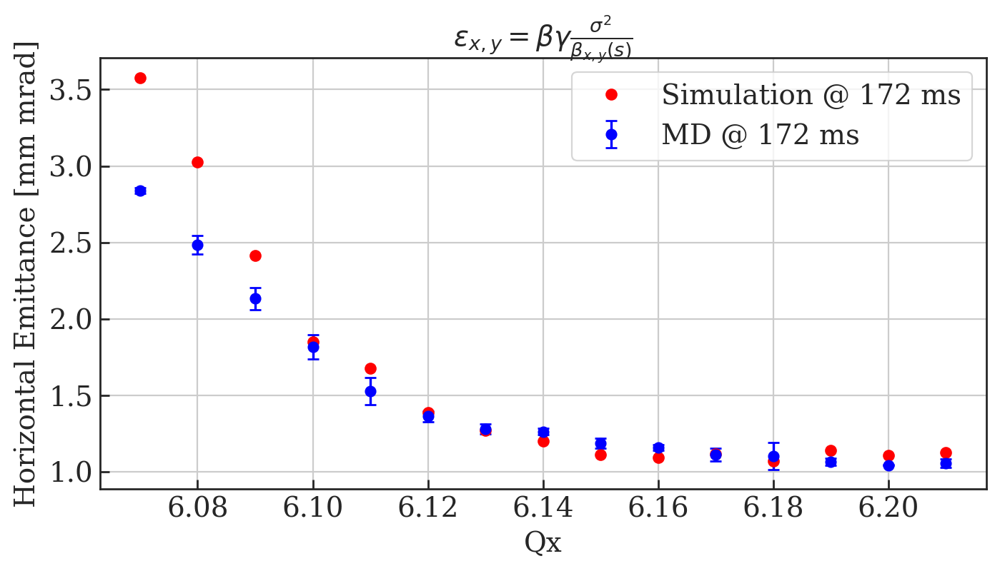

In [77]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
y_error_172[11] = max(y_error_172)
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qx'], df0_sim['emittance H'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

# plt.ylim(0.5, 3.5)
#plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics_Sim_172.png');

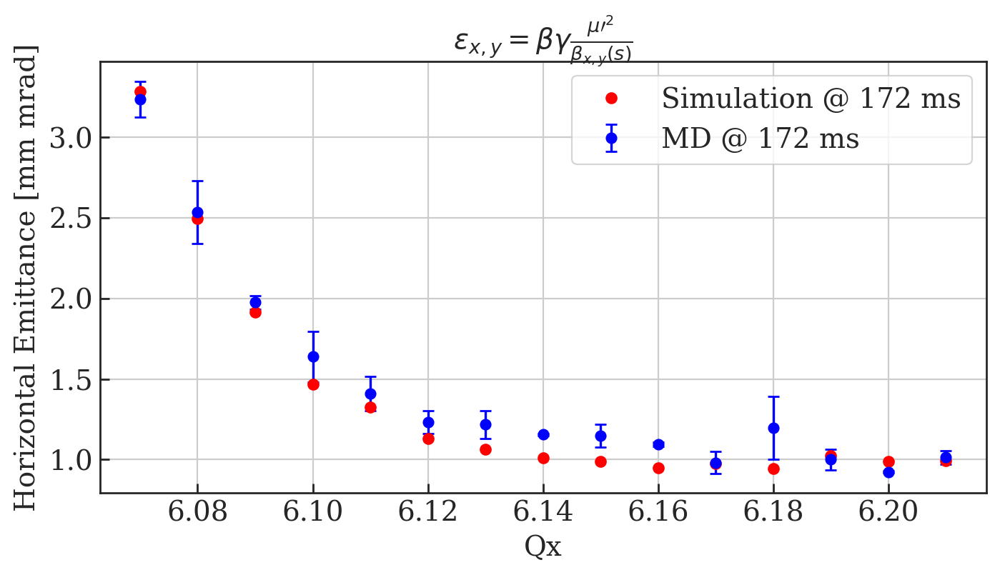

In [78]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
y_error_172[11] = max(y_error_172)
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qx'], df0_sim['emittance H 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

# plt.ylim(0.5, 3.5)
#plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics_Sim_172.png');

# Core Fit

In [79]:
df0

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,...,intensity,losses,ratio,emittance H,betx,bety,dx,emittance H noDisp,emittance H 2ndMoment noDisp,emittance H 2ndMoment
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...",...,7.301678e+11,1.755472,0.982445,1.072059,22.435882,11.715731,3.413603,1.960295,1.928930,1.040693
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...",...,7.119099e+11,1.411161,0.985888,1.039390,22.392001,11.721015,3.434507,1.940300,1.831016,0.930105
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...",...,7.243861e+11,1.241589,0.987584,1.073654,22.339713,11.726460,3.457001,1.988541,1.915094,1.000208
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....",...,7.017158e+11,1.237806,0.987622,1.084702,22.207503,11.737483,3.506113,2.031370,1.949674,1.003006
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...",...,7.227126e+11,0.887386,0.991126,1.180333,22.035852,11.748196,3.559735,2.163780,2.092342,1.108895
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...",...,6.959341e+11,0.570801,0.994292,1.257748,21.797181,11.759253,3.623272,2.287772,2.434553,1.404530
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+09,4.704099,4.927503294667217,0.013057,6.990972365092053,-3.3162589470865695,"[-29.48574105291343, -29.453741052913433, -29....",...,7.231689e+11,0.779939,0.992201,1.465642,21.467022,11.770369,3.698824,2.555578,2.329101,1.239165
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+09,5.061085,5.176246325534791,0.017240,6.713900226898849,-3.394103806486972,"[-31.011896193513028, -30.87989619351303, -30....",...,7.043024e+11,1.211873,0.987881,1.712388,20.999678,11.781491,3.791097,2.882865,2.756016,1.585539
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+09,5.892221,5.866034303890619,0.019750,6.902342903858677,-3.474954237427583,"[-35.17304576257242, -35.10704576257242, -34.9...",...,7.249947e+11,1.536863,0.984631,2.542526,20.300948,11.792737,3.909099,3.829834,3.864104,2.576795
2018-09-04 08:42:13.900,175.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174921255067789, 0.175532868924527, 0.17512...",1.536051e+09,4.351022,4.416157449662227,0.010081,7.222033873364809,-2.448335591030603,"[-26.4446644089694, -26.347664408969397, -26.2...",...,7.380797e+11,1.902385,0.980976,1.075733,22.435503,11.715780,3.413798,1.964086,1.906575,1.018223


In [80]:
df0_sim

,Qx,Qy,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,emittance H,betx,bety,dx,emittance H noDisp,emittance H 2ndMoment noDisp,emittance H 2ndMoment
0,6.07,6.24,"[-0.024343626487250684, -0.024245344504546996,...","[0.20349609816376663, 0.0, 0.0, 0.0, 0.0, 0.20...",6.391649,6.591165872836085,0.011482,1008.7890339696817,0.20019598966383834,"[-24.543822476914524, -24.445540494210835, -24...","[0.05935302863109863, 0.05862625685194232, 0.0...",3.578477,19.912049,11.797357,3.966339,4.929645,4.635717,3.284549
1,6.08,6.24,"[-0.02261591570004215, -0.02252587329358602, -...","[0.2221175642361721, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.829270,6.227008121659448,0.019683,1018.619285742979,0.22583870076974147,"[-22.84175440081189, -22.75171199435576, -22.6...","[0.05367841135707494, 0.048125472251170635, 0....",3.023979,20.413116,11.791224,3.890362,4.291970,3.761198,2.493206
2,6.09,6.24,"[-0.02171784281565975, -0.021633060180318464, ...","[0.2358973617591925, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.358744,5.769808767502352,0.021382,1021.100331020854,0.32714385068264257,"[-22.044986666342393, -21.960204031001105, -21...","[0.057008529091804865, 0.05111109504782505, 0....",2.412794,20.804788,11.785121,3.825040,3.615486,3.118672,1.915981
3,6.10,6.24,"[-0.01842608963673909, -0.01835206230612175, -...","[0.2701704874836241, 0.0, 0.0, 0.0, 0.27017048...",4.945262,5.294508861579428,0.017126,1019.3364358215546,0.24298434717309983,"[-18.66907398391219, -18.595046653294848, -18....","[0.07429688405799707, 0.07140220026352985, 0.0...",1.849320,21.116999,11.779054,3.768311,2.999344,2.616697,1.466674
4,6.11,6.24,"[-0.018593139504973915, -0.018518504071113825,...","[0.2679692334540658, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.794881,5.129639868510316,0.017734,1019.3441264759875,0.16624786282766002,"[-18.759387367801576, -18.684751933941484, -18...","[0.0714584622544187, 0.07145846225441865, 0.07...",1.675575,21.369811,11.773030,3.718497,2.782148,2.430872,1.324299
5,6.12,6.24,"[-0.01809445419373009, -0.018016903633338514, ...","[0.5157925332586638, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.584987,4.844014811755803,0.013299,1015.6019556700967,0.22666573021973802,"[-18.32111992394983, -18.243569363558255, -18....","[0.10745677776222158, 0.10193042919159315, 0.0...",1.387075,21.577147,11.767050,3.674283,2.457107,2.201351,1.131320
6,6.13,6.24,"[-0.016839495863406998, -0.016768565291276533,...","[0.2819658632276837, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.498137,4.711717430823863,0.009962,1012.9626874069554,0.19817335675790895,"[-17.037669220164908, -16.966738648034443, -16...","[0.06579203475312621, 0.06176395099273073, 0.0...",1.267568,21.748954,11.761117,3.634635,2.306361,2.102006,1.063214
7,6.14,6.24,"[-0.0159973191381702, -0.01592987597577459, -0...","[0.2965459994696282, 0.29654599946961296, 0.0,...",4.429156,4.630196463579673,0.009166,1012.2437930790517,0.18727558953558332,"[-16.184594727705782, -16.117151565310174, -16...","[0.10873353313886185, 0.11296990455985637, 0.1...",1.200935,21.892518,11.755232,3.598747,2.212637,2.024665,1.012964
8,6.15,6.24,"[-0.01699908734846183, -0.016932071274230184, ...","[0.2984358637730539, 0.2984358637730539, 0.0, ...",4.388209,4.522487930842476,0.005653,1007.9607432443506,0.13554096747373315,"[-17.13462831593556, -17.067612241703916, -17....","[0.2064181391096956, 0.18829881880918875, 0.17...",1.111400,22.013293,11.749394,3.565979,2.099312,1.976499,0.988588
9,6.16,6.24,"[-0.01733182048862815, -0.01726428932297039, -...","[0.29615955544668565, 0.0, 0.29615955544668565...",4.331723,4.487722947366073,0.007631,1009.8916139317298,0.1619552020137406,"[-17.49377569064189, -17.426244524984128, -17....","[0.12833580736023045, 0.11564325498394393, 0.1...",1.090826,22.115436,11.743606,3.535821,2.057613,1.917048,0.950261


# Test some stuff

In [81]:
# Check cutting of data
x_data = df0['position H'].iloc()[0]
y_data = df0['profile H'].iloc()[0]

In [82]:
len(x_data)

600

In [83]:
len(y_data)

600

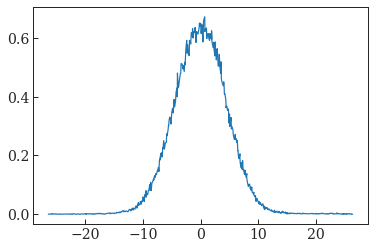

In [84]:
plt.plot(x_data, y_data)

In [85]:
indx_max = np.argmax(y_data)
indx_max

288

In [86]:
quart_len_x_dat = int(len(x_data)/4)
quart_len_x_dat

150

In [87]:
X = x_data[int(indx_max-quart_len_x_dat) : int(indx_max+quart_len_x_dat)]
Y = y_data[int(indx_max-quart_len_x_dat) : int(indx_max+quart_len_x_dat)]

In [88]:
len(X)

300

In [89]:
len(Y)

300

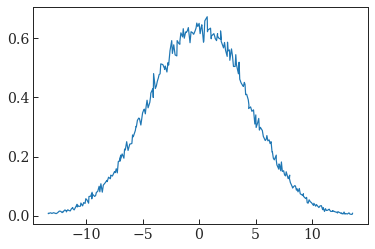

In [90]:
plt.plot(X, Y)

## Current method doesn't work, have to manually find half-peak x axis index

In [91]:
indx_max = np.argmax(y_data)
peak = y_data[indx_max]

print 'peak of ', peak, ' found at index ', indx_max

first = int(0)

for i in xrange(len(y_data)):
    if y_data[i] > peak/2:
        print 'half peak of ', y_data[i] , ' found at index ', i
        first = i
        break
        
for i in reversed(xrange(len(y_data))):
    if y_data[i] > peak/2:
        print 'half peak of ', y_data[i] , ' found at index ', i
        second = i
        break

X = x_data[int(first) : int(second)]
Y = y_data[int(first) : int(second)]



peak of  0.6728868609218155  found at index  288
half peak of  0.34742879445777264  found at index  226
half peak of  0.3407757980252474  found at index  337


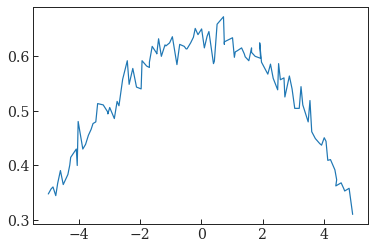

In [92]:
plt.plot(X, Y)

In [93]:
def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))


ampl = max(Y)
sigma0 = 1
mu0 = 0

popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])
result3 = gaussian_3_parameters(X, popt3[0], popt3[1], popt3[2])
print 'found sigma to be :', popt3[2]

found sigma to be : 4.504605171424325


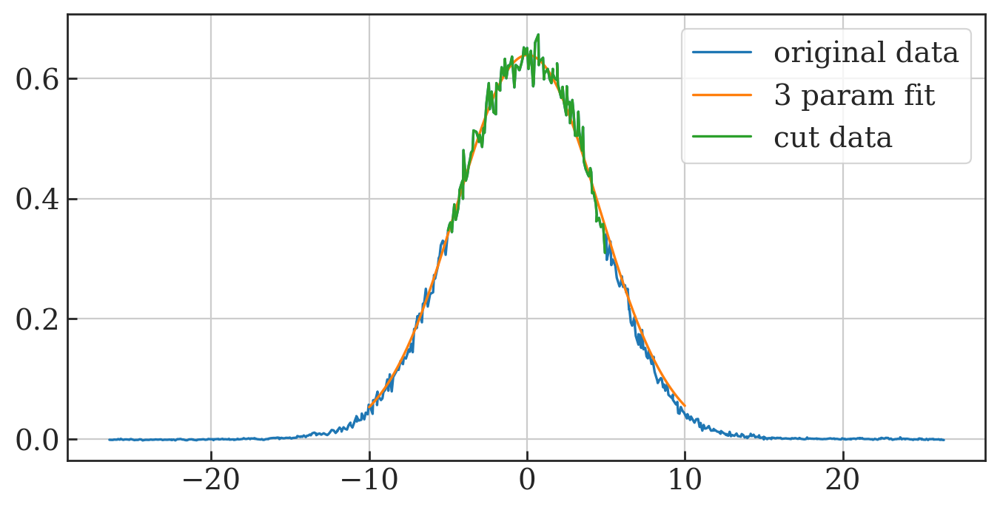

In [94]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

x_dat = np.linspace(-10, 10, 1000)
result3 = gaussian_3_parameters(x_dat, popt3[0], popt3[1], popt3[2])
plt.plot(x_data, y_data, label='original data')
plt.plot(x_dat, result3, label='3 param fit');
plt.plot(X, Y, label='cut data')
plt.grid()
plt.legend()

In [95]:
def find_factor_of_peak_indices(x_data, y_data, fac, verbose = False):
    indices = []
    first = int(0)
    second = int(0)    
    
    indx_max = np.argmax(y_data)
    peak = y_data[indx_max]
    
    for i in xrange(len(y_data)):
        if y_data[i] > peak*fac:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            first = i
            break
        
    for i in reversed(xrange(len(y_data))):
        if y_data[i] > peak*fac:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            second = i
            break
            
    
    
    indices.append(first)
    indices.append(second)
    
    return indices

def find_half_peak_indices(x_data, y_data, verbose = False):
    indices = []
    first = int(0)
    second = int(0)    
    
    indx_max = np.argmax(y_data)
    peak = y_data[indx_max]
    
    for i in xrange(len(y_data)):
        if y_data[i] > peak/2:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            first = i
            break
        
    for i in reversed(xrange(len(y_data))):
        if y_data[i] > peak/2:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            second = i
            break
    
    indices.append(first)
    indices.append(second)
    
    return indices

def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def second_moment(values, weights):
    weighted_average = np.average(values, weights=weights)
    second_moment = np.sqrt(np.average((values-weighted_average)**2, weights=weights))
    return (second_moment)

def Core_filter(ndf, with_plot = True, WS = '65.H', sig_limit_mm=10, smooth = False):
    
    df = ndf.copy()
    
    position_label = 'position H'
    profile_label = 'profile H'
    window = 40
    
    
    mu_3 = []
    sigma_3 = []
    A_3 = []
    sig_err_3 = []
    
    mom_2nd = []
    
    # Iterate over dataframe
    for j in range(0, len(df), 1):
        print '\nCore_filter row ', j    
    
        y_data = df[profile_label].iloc()[j]
        x_data = df[position_label].iloc()[j]
        indx_max = np.argmax(y_data)  
        peak = y_data[indx_max]
        
#         print '\nPeak magnitude ', peak, 'found at index ', indx_max
        
        quart_len_x_dat = int(len(x_data)/4)
        
#         print '\nUsing indices', int(indx_max-quart_len_x_dat), ' to ', int(indx_max+quart_len_x_dat)
        
        # Use only half of the data, around the peak        
#         half_peak_indices = find_half_peak_indices(x_data, y_data)
        # equivalent
        half_peak_indices = find_factor_of_peak_indices(x_data, y_data, 0.5, verbose=True)
        
        X = x_data[half_peak_indices[0] : half_peak_indices[1]]
#         X = X/1000
        Y = y_data[half_peak_indices[0] : half_peak_indices[1]]
        
        indx_max = np.argmax(Y)        
        mu0 = X[indx_max]
        x_tmp = X
        y_tmp = Y
        offs0 = min(y_tmp)
        ampl = max(y_tmp)-offs0
#         x1 = x_tmp[np.searchsorted(y_tmp[:window], offs0+ampl/2)]
#         x2 = x_tmp[np.searchsorted(-y_tmp[window:], -offs0+ampl/2)]
#         FWHM = x2-x1
        #sigma0 = np.abs(2*FWHM/2.355)
        sigma0 = 1
        ampl *= np.sqrt(2*np.pi)*sigma0
        slope = 0
    
        popt3 = []
        pcov3 = []   
        
        try:
            popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])

            fit_A_3 = popt3[0]
            fit_mean_3 = popt3[1]
            fit_sigma_3 = popt3[2]

            A_3.append(np.array(popt3[0]))
            mu_3.append(np.array(popt3[1]))
            sigma_3.append(np.array(abs(popt3[2])))
            sig_err_3.append(np.sqrt(np.diag(pcov3[2]))[2][2])   
            
            print '3 parameter fit sigma = ', popt3[2] , ' +/- ', np.sqrt(np.diag(pcov3[2]))[2][2]
# Plot
#------------------------------------------------      
            if with_plot:
                fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

                x_dat = np.linspace(-20, 20, 1000)
                result3 = gaussian_3_parameters(x_dat, popt3[0], popt3[1], popt3[2])

                plt.plot(df[position_label].iloc()[j], df[profile_label].iloc()[j], label='filtered data');
                plt.plot(X, Y, label='raw core data');
                plt.plot(x_dat, result3, label='3 param core fit' );

                tit = 'WS profile & fit ' + str(j);
                savename = 'MD4224_HB_Vertical_Corefit_' + str(j);

                plt.title(tit);
                plt.ylabel('Profile [-]');
                plt.xlabel('Position [mm]');
                plt.legend();            
                plt.grid();
                fig.savefig(savename);
                plt.close();            
            
        except:            
            
            print '3 parameter fit not found'
                        
            result3 = 'NaN'

            fit_A_3 = 'NaN'
            fit_mean_3 = 'NaN'
            fit_sigma_3 = 'NaN'

            A_3.append('NaN')
            mu_3.append('NaN')
            sigma_3.append('NaN')
            sig_err_3.append('NaN')   
        
        second_mom = second_moment(X, Y)

        mom_2nd.append(second_mom)
    
    df['Core 2ndMoment '+WS[-1]] = mom_2nd   
    
    df['Core sig '+WS[-1]] = sigma_3
    df['Core sig err'+WS[-1]] = sig_err_3
    df['Core A '+WS[-1]] = A_3
    df['Core mu '+WS[-1]] = mu_3
    
    return df

In [96]:
df0_core = Core_filter(df0)


Core_filter row  0
half peak of  0.34742879445777264  found at index  226
half peak of  0.3407757980252474  found at index  337
3 parameter fit sigma =  4.5046051780348835  +/-  0.05132406792964815

Core_filter row  1
half peak of  0.3542494452715167  found at index  227
half peak of  0.3781827137103708  found at index  332
3 parameter fit sigma =  4.5299928485467325  +/-  0.056017033381494594

Core_filter row  2
half peak of  0.3516996117297235  found at index  226
half peak of  0.3336140155486549  found at index  339
3 parameter fit sigma =  4.588150387418887  +/-  0.04614742183738423

Core_filter row  3
half peak of  0.3212952385471327  found at index  226
half peak of  0.32186198027915214  found at index  344
3 parameter fit sigma =  4.555790572305601  +/-  0.0477385680575198

Core_filter row  4
half peak of  0.32182621288576785  found at index  233
half peak of  0.3341287159723485  found at index  352
3 parameter fit sigma =  4.620943117039162  +/-  0.03971223653960263

Core_filt

/usr/local/bin/start_ipykernel.py:129: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:131: RuntimeWarning: invalid value encountered in sqrt



Core_filter row  7
half peak of  0.278831589086852  found at index  257
half peak of  0.3015772732776105  found at index  395
3 parameter fit sigma =  5.604280064628406  +/-  0.06427721010195515

Core_filter row  8
half peak of  0.2451539742844289  found at index  294
half peak of  0.2490925445474523  found at index  451
3 parameter fit sigma =  6.458561552855952  +/-  0.0707925768383567

Core_filter row  9
half peak of  0.338981658201161  found at index  224
half peak of  0.34137495329835044  found at index  337
3 parameter fit sigma =  4.590823613481488  +/-  0.044822808863322926

Core_filter row  10
half peak of  0.3434760534706204  found at index  230
half peak of  0.3398595520945443  found at index  343
3 parameter fit sigma =  4.588182086674194  +/-  0.04659711002845375

Core_filter row  11
half peak of  0.3429115244811537  found at index  229
half peak of  0.3357163705387515  found at index  349
3 parameter fit sigma =  4.628622279758146  +/-  0.04018764814527717

Core_filter r


Core_filter row  49
half peak of  0.32586427832037895  found at index  224
half peak of  0.33946249118617844  found at index  344
3 parameter fit sigma =  4.599305766043539  +/-  0.04386928353820274

Core_filter row  50
half peak of  0.3177242737253242  found at index  230
half peak of  0.313148450325728  found at index  349
3 parameter fit sigma =  4.55162377982586  +/-  0.04134171952990651

Core_filter row  51
half peak of  0.3264368964407032  found at index  242
half peak of  0.31546377622929844  found at index  361
3 parameter fit sigma =  4.79908850849249  +/-  0.044290456251029474

Core_filter row  52
half peak of  0.3059092930272751  found at index  251
half peak of  0.31438264490346646  found at index  379
3 parameter fit sigma =  5.2311008528022285  +/-  0.05283175854761392

Core_filter row  53
half peak of  0.275022038480436  found at index  263
half peak of  0.26774711524351147  found at index  414
3 parameter fit sigma =  5.741422544077228  +/-  0.05590656944136137

Core_f


Core_filter row  91
half peak of  0.280160211368481  found at index  293
half peak of  0.27647052817489653  found at index  439
3 parameter fit sigma =  6.238821560849267  +/-  0.07408910540438121

Core_filter row  92
half peak of  0.3399692250785279  found at index  222
half peak of  0.33638231918812644  found at index  340
3 parameter fit sigma =  4.485479865802959  +/-  0.04473212549265733

Core_filter row  93
half peak of  0.3357683847354539  found at index  224
half peak of  0.342966545743682  found at index  334
3 parameter fit sigma =  4.458548488703639  +/-  0.054907392240766566

Core_filter row  94
half peak of  0.33055128156378233  found at index  231
half peak of  0.3335063959923038  found at index  347
3 parameter fit sigma =  4.4854551048908595  +/-  0.0452931239033682

Core_filter row  95
half peak of  0.3205846189956589  found at index  234
half peak of  0.3182826585522779  found at index  353
3 parameter fit sigma =  4.6543157112944895  +/-  0.047291878786971824

Core_


Core_filter row  133
half peak of  0.3376006982173619  found at index  240
half peak of  0.3281326716567567  found at index  357
3 parameter fit sigma =  4.829478237273415  +/-  0.04809500232131098

Core_filter row  134
half peak of  0.311552274982718  found at index  251
half peak of  0.3036858800491495  found at index  378
3 parameter fit sigma =  5.360076909323529  +/-  0.06029625956701658

Core_filter row  135
half peak of  0.27933219498855083  found at index  262
half peak of  0.2916665714853153  found at index  405
3 parameter fit sigma =  5.705225987716894  +/-  0.05224833810227139

Core_filter row  136
half peak of  0.25253925460851046  found at index  285
half peak of  0.2555349734954433  found at index  433
3 parameter fit sigma =  6.156829763286592  +/-  0.0626409482918739

Core_filter row  137
half peak of  0.3316539709572831  found at index  224
half peak of  0.34238088072955286  found at index  333
3 parameter fit sigma =  4.490512369800632  +/-  0.04093923533105756

Cor


Core_filter row  174
half peak of  0.33085972358195515  found at index  229
half peak of  0.3314357972534354  found at index  350
3 parameter fit sigma =  4.605960500623281  +/-  0.03867085524227857

Core_filter row  175
half peak of  0.31970557647271625  found at index  234
half peak of  0.3451228137844974  found at index  349
3 parameter fit sigma =  4.7581380600724845  +/-  0.048073522045185106

Core_filter row  176
half peak of  0.3067450847036115  found at index  241
half peak of  0.31751807168250734  found at index  362
3 parameter fit sigma =  4.989436942211448  +/-  0.05312293379997396

Core_filter row  177
half peak of  0.3129579251561305  found at index  256
half peak of  0.302827404790061  found at index  386
3 parameter fit sigma =  5.199939704463181  +/-  0.054376516305786375

Core_filter row  178
half peak of  0.2908814671081503  found at index  266
half peak of  0.28548177890611753  found at index  403
3 parameter fit sigma =  5.682354720329468  +/-  0.05582531720167381


Core_filter row  215
half peak of  0.2925093466930755  found at index  265
half peak of  0.2930577625762768  found at index  395
3 parameter fit sigma =  5.5032275629082905  +/-  0.059068607840477606

Core_filter row  216
half peak of  0.2594146627872249  found at index  284
half peak of  0.2650114326690322  found at index  434
3 parameter fit sigma =  6.124647358947732  +/-  0.058242987539785476

Core_filter row  217
half peak of  0.24149392431623362  found at index  320
half peak of  0.2493510822121837  found at index  489
3 parameter fit sigma =  6.640503886227433  +/-  0.061032951455858235

Core_filter row  218
half peak of  0.33727300181306297  found at index  224
half peak of  0.3438769518886756  found at index  342
3 parameter fit sigma =  4.603042941583831  +/-  0.046109259906290716

Core_filter row  219
half peak of  0.33386001657571973  found at index  224
half peak of  0.34343878122009497  found at index  341
3 parameter fit sigma =  4.583902593821797  +/-  0.04232503470415

In [97]:
df0_core

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,...,bety,dx,emittance H noDisp,emittance H 2ndMoment noDisp,emittance H 2ndMoment,Core 2ndMoment H,Core sig H,Core sig errH,Core A H,Core mu H
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...",...,11.715731,3.413603,1.960295,1.928930,1.040693,2.667933,4.5046051780348835,0.051324,7.213060197128923,0.042895675341930964
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...",...,11.721015,3.434507,1.940300,1.831016,0.930105,2.558768,4.5299928485467325,0.056017,7.05059472916297,0.07577748761505171
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...",...,11.726460,3.457001,1.988541,1.915094,1.000208,2.718788,4.588150387418887,0.046147,7.14266300268729,0.030205524187576077
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....",...,11.737483,3.506113,2.031370,1.949674,1.003006,2.811938,4.555790572305601,0.047739,6.806784331684613,0.03662034065029397
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...",...,11.748196,3.559735,2.163780,2.092342,1.108895,2.843806,4.620943117039162,0.039712,6.981861793294323,0.02391865743316969
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...",...,11.759253,3.623272,2.287772,2.434553,1.404530,2.872470,4.864761364495685,0.044299,6.883763024803357,0.02530465226003936
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+09,4.704099,4.927503294667217,0.013057,6.990972365092053,-3.3162589470865695,"[-29.48574105291343, -29.453741052913433, -29....",...,11.770369,3.698824,2.555578,2.329101,1.239165,3.085159,5.214750898111264,0.049743,7.274388213267431,-0.044695158342046855
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+09,5.061085,5.176246325534791,0.017240,6.713900226898849,-3.394103806486972,"[-31.011896193513028, -30.87989619351303, -30....",...,11.781491,3.791097,2.882865,2.756016,1.585539,3.329025,5.604280064628406,0.064277,7.096177113995265,-0.021555424227911096
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+09,5.892221,5.866034303890619,0.019750,6.902342903858677,-3.474954237427583,"[-35.17304576257242, -35.10704576257242, -34.9...",...,11.792737,3.909099,3.829834,3.864104,2.576795,3.791945,6.458561552855952,0.070793,7.3935078505765475,-0.011158517032266028
2018-09-04 08:42:13.900,175.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174921255067789, 0.175532868924527, 0.17512...

In [98]:
df0_sim_core = Core_filter(df0_sim)


Core_filter row  0
half peak of  30.646512383463403  found at index  169
half peak of  30.687211603096102  found at index  331
3 parameter fit sigma =  6.837069928757834  +/-  0.018062022483721074

Core_filter row  1
half peak of  31.718388172924975  found at index  167
half peak of  32.02935276285561  found at index  340
3 parameter fit sigma =  6.798365070368964  +/-  0.024204736296724975

Core_filter row  2
half peak of  34.42528832605873  found at index  173
half peak of  34.378108853706884  found at index  346
3 parameter fit sigma =  6.4659532152277  +/-  0.02273597749557176

Core_filter row  3
half peak of  38.3822205885075  found at index  163
half peak of  37.715800052714535  found at index  342
3 parameter fit sigma =  5.85704209156909  +/-  0.015149653320784131

Core_filter row  4
half peak of  38.712621926331124  found at index  165
half peak of  38.891268081967226  found at index  336
3 parameter fit sigma =  5.71945527160111  +/-  0.026675364562115413

Core_filter row  5

/usr/local/bin/start_ipykernel.py:129: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:131: RuntimeWarning: invalid value encountered in sqrt



Core_filter row  8
half peak of  45.799957227038014  found at index  176
half peak of  45.302564120749416  found at index  336
3 parameter fit sigma =  4.614119177607118  +/-  0.012794492879134702

Core_filter row  9
half peak of  45.03599639826033  found at index  181
half peak of  45.01625242789734  found at index  339
3 parameter fit sigma =  4.687143709131521  +/-  0.017728879081041354

Core_filter row  10
half peak of  44.9907669085502  found at index  147
half peak of  45.42010225877104  found at index  292
3 parameter fit sigma =  4.739817021206195  +/-  0.018371003407126517

Core_filter row  11
half peak of  45.15243145018621  found at index  191
half peak of  45.73680286671141  found at index  347
3 parameter fit sigma =  4.599424732370567  +/-  0.009212229404681953

Core_filter row  12
half peak of  43.754649218611824  found at index  180
half peak of  44.84998241317709  found at index  339
3 parameter fit sigma =  4.670278928424463  +/-  0.020850023122737135

Core_filter ro

In [99]:
df0_sim_core

,Qx,Qy,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,2ndMoment H,sig H,sig errH,A H,mu H,position H,...,bety,dx,emittance H noDisp,emittance H 2ndMoment noDisp,emittance H 2ndMoment,Core 2ndMoment H,Core sig H,Core sig errH,Core A H,Core mu H
0,6.07,6.24,"[-0.024343626487250684, -0.024245344504546996,...","[0.20349609816376663, 0.0, 0.0, 0.0, 0.0, 0.20...",6.391649,6.591165872836085,0.011482,1008.7890339696817,0.20019598966383834,"[-24.543822476914524, -24.445540494210835, -24...",...,11.797357,3.966339,4.929645,4.635717,3.284549,4.192833,6.837069928757834,0.018062,1034.4366707933375,0.07029199881392402
1,6.08,6.24,"[-0.02261591570004215, -0.02252587329358602, -...","[0.2221175642361721, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.829270,6.227008121659448,0.019683,1018.619285742979,0.22583870076974147,"[-22.84175440081189, -22.75171199435576, -22.6...",...,11.791224,3.890362,4.291970,3.761198,2.493206,4.108987,6.798365070368964,0.024205,1083.4006448086423,0.11132263392906992
2,6.09,6.24,"[-0.02171784281565975, -0.021633060180318464, ...","[0.2358973617591925, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.358744,5.769808767502352,0.021382,1021.100331020854,0.32714385068264257,"[-22.044986666342393, -21.960204031001105, -21...",...,11.785121,3.825040,3.615486,3.118672,1.915981,3.877673,6.4659532152277,0.022736,1107.0505869708868,0.05343122229566149
3,6.10,6.24,"[-0.01842608963673909, -0.01835206230612175, -...","[0.2701704874836241, 0.0, 0.0, 0.0, 0.27017048...",4.945262,5.294508861579428,0.017126,1019.3364358215546,0.24298434717309983,"[-18.66907398391219, -18.595046653294848, -18....",...,11.779054,3.768311,2.999344,2.616697,1.466674,3.505953,5.85704209156909,0.015150,1094.8326942124236,0.019735851770812305
4,6.11,6.24,"[-0.018593139504973915, -0.018518504071113825,...","[0.2679692334540658, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.794881,5.129639868510316,0.017734,1019.3441264759875,0.16624786282766002,"[-18.759387367801576, -18.684751933941484, -18...",...,11.773030,3.718497,2.782148,2.430872,1.324299,3.381384,5.71945527160111,0.026675,1101.8222681508157,0.0439302337955061
5,6.12,6.24,"[-0.01809445419373009, -0.018016903633338514, ...","[0.5157925332586638, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.584987,4.844014811755803,0.013299,1015.6019556700967,0.22666573021973802,"[-18.32111992394983, -18.243569363558255, -18....",...,11.767050,3.674283,2.457107,2.201351,1.131320,3.171593,5.232898509248433,0.022419,1072.2509097392106,0.06320423440807486
6,6.13,6.24,"[-0.016839495863406998, -0.016768565291276533,...","[0.2819658632276837, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.498137,4.711717430823863,0.009962,1012.9626874069554,0.19817335675790895,"[-17.037669220164908, -16.966738648034443, -16...",...,11.761117,3.634635,2.306361,2.102006,1.063214,3.044799,4.975428199984524,0.016183,1051.7394177564886,-0.012866551440902664
7,6.14,6.24,"[-0.0159973191381702, -0.01592987597577459, -0...","[0.2965459994696282, 0.29654599946961296, 0.0,...",4.429156,4.630196463579673,0.009166,1012.2437930790517,0.18727558953558332,"[-16.184594727705782, -16.117151565310174, -16...",...,11.755232,3.598747,2.212637,2.024665,1.012964,2.959994,4.804082875565723,0.018291,1037.2438577544751,-0.008629562319706262
8,6.15,6.24,"[-0.01699908734846183, -0.016932071274230184, ...","[0.2984358637730539, 0.2984358637730539, 0.0, ...",4.388209,4.522487930842476,0.005653,1007.9607432443506,0.13554096747373315,"[-17.13462831593556, -17.067612241703916, -17....",...,11.749394,3.565979,2.099312,1.976499,0.988588,2.825588,4.614119177607118,0.012794,1021.1644612045945,-0.004947439673697629
9,6.16,6.24,"[-0.01733182048862815, -0.01726428932297039, -...","[0.29615955544668565, 0.0, 0.29615955544668565...",4.331723,4.487722947366073,0.007631,1009.8916139317298,0.1619552020137406,"[-17.49377569064189, -17.426244524984128, -17....",...,11.743606,3.535821,2.057613,1.917048,0.950261,2.819729,4.687143709131521,0.017729,1041.1111963310207,-0.0006435778338407739


# Emittance from Core sigma and second moment

In [100]:
# from scipy.interpolate import interp1d
# def PS_WSoptics(tunex, tuney, WS='65', verbose=False):
        
#     ptc_optics = dict()
#     #ptc_optics[float(tune)] = [(all floats) beta_x, beta_y, alpha_x, alpha_y, D_x, D_y]
#     ptc_optics[6.10] = [11.835, 24.924, 0.0115, -0.016, 2.86, 0.]
#     ptc_optics[6.12] = [11.917, 24.029, 0.0099, 0.0028, 2.83, 0.]
#     ptc_optics[6.14] = [12, 23.44, 0.0082, 0.0157, 2.8, 0.]
#     ptc_optics[6.16] = [12.083, 23.031, 0.0065, 0.0251, 2.77, 0.]
#     ptc_optics[6.18] = [12.165, 22.735, 0.0047, 0.0322, 2.74, 0.]
#     ptc_optics[6.20] = [12.247, 22.513, 0.0029, 0.0377, 2.71, 0.]
#     ptc_optics[6.22] = [12.328, 22.34, 0.0012, 0.0421, 2.68, 0.]
#     ptc_optics[6.24] = [12.409, 22.202, -0.00055, 0.0457, 2.65, 0.]
    
#     # interpolated data
    
#     Qy = [6.1, 6.12, 6.14, 6.16, 6.18, 6.2, 6.22, 6.24]
#     beta_x_ptc = [11.835, 11.917, 12, 12.083, 12.165, 12.247, 12.328, 12.409]
#     beta_x = [11.496287799470704, 11.622348183114314, 11.752791012666949, 11.882235857048215, 12.017876534237434, 12.155717432086707, 12.286640418239848, 12.418697362251356]
#     beta_x_eff = [15.71937930751325, 15.769989166689998, 15.846834580765128, 15.914760535085426, 16.012224151123437, 16.067729573281675, 16.265895421362465, 16.287392480720673]
#     beta_y_ptc = [24.924, 24.029, 23.44, 23.031, 22.735, 22.513, 22.34, 22.202]
#     beta_y = [28.784027286342415, 27.207938015726914, 25.95396311972594, 24.996666601561824, 24.16981199942386, 23.532576507285963, 23.068468704478313, 22.76306463960286]
#     beta_y_eff = [28.784021415243977, 27.20793652234759, 25.953962447008042, 24.996665150525683, 24.1698108711869, 23.532575659545216, 23.06846817340586, 22.763064622584743]
#     alpha_x_ptc = [0.0115, 0.0099, 0.0082, 0.0065, 0.0047, 0.0029, 0.0012, -0.00055]
#     alpha_x = [0.020196943327589586, 0.017627598679308795, 0.014994645269010886, 0.012378157613604897, 0.009604465728624582, 0.006771094434762246, 0.004103420240249408, 0.0014042139169805218]
#     alpha_x_eff = [0.012644756543632252, 0.010999606000298172, 0.009279390671409909, 0.007565427145992475, 0.005761468634033717, 0.0038912356469907898, 0.002097495908152698, 0.00041000161249536634]
#     alpha_y_ptc = [-0.016, 0.0028, 0.0157, 0.0251, 0.0322, 0.0377, 0.0421, 0.0457]
#     alpha_y = [-0.07633339839729839, -0.04694770375188252, -0.022726415517094378, -0.0032576706141040795, 0.013524545703849094, 0.026632494806317433, 0.03620287285371853, 0.04286149340139552]
#     alpha_y_eff = [-0.07633353873159593, -0.04694768168864276, -0.022726376530043065, -0.0032576498736779915, 0.013524555750239533, 0.026632507622584966, 0.03620287711554266, 0.04286150380905749]
#     D_x_ptc = [2.86, 2.83, 2.8, 2.77, 2.74, 2.71, 2.68, 2.65]
#     D_x = [2.7232998132262445, 2.6998500131457344, 2.6737571779004394, 2.645956067783495, 2.615602483750087, 2.5843844615942437, 2.5525948394197817, 2.5209695063465576]
#     D_y_ptc = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
#     D_y = [0.0008237864638082594, -2.8364867400863136e-05, 0.0005038574946213577, -0.00010499875711448806, 3.6980491474269093e-05, -1.014483389421703e-05, -2.01627560923344e-05, -5.804429820819794e-05]
# #     alpha_x_int = interp1d(Qy, alpha_x)
# #     alpha_y_int = interp1d(Qy, alpha_y)

# #     alpha_x_eff_int = interp1d(Qy, alpha_x_eff)
# #     alpha_y_eff_int = interp1d(Qy, alpha_y_eff)

# #     beta_x_int = interp1d(Qy, beta_x)
# #     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

#     beta_x_int = interp1d(Qy, beta_x)
#     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

#     D_x_int = interp1d(Qy, D_x)
# #     D_y_int = interp1d(Qy, D_y)

#     if tuney < 1:
#         tuney = 6 + tuney
    
#     if tuney > 6.24:
#         result = {'Beta_x':beta_x_int(6.24), 'Beta_y':beta_y_int(6.24),'D_x': D_x_int(6.24)}
#     elif tuney < 6.10:
#         result = {'Beta_x':beta_x_int(6.10), 'Beta_y':beta_y_int(6.10),'D_x': D_x_int(6.10)}
#     else:
#         result = {'Beta_x':beta_x_int(tuney), 'Beta_y':beta_y_int(tuney),'D_x': D_x_int(tuney)}
#     return result

# def profiles(ndf,WS='64.V',myFiles=None, lim=40):
#     df=ndf.copy()
#     # play with these limits
#     #x=np.linspace(-40,40,1000)
#     x=np.linspace(-lim,lim,1000)
#     a=df.columns
#     if 'profile '+WS[-1] not in a:
#         df['profile '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_DATA_IN'.format(WS)].apply(filtered)
#         df['position '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_POSITION_IN'.format(WS)].values/1000.
#     if 'sig '+WS[-1] not in a:
#         df['sig '+WS[-1]]=np.nan
#         df['mu '+WS[-1]]=np.nan
#         df['c '+WS[-1]]=np.nan
#         df['A '+WS[-1]]=np.nan

#     span=span_range(df,myFiles=myFiles)
#     if np.isnan(df['sig '+WS[-1]].iloc[span]).all():
#         for i in span:
#             df['A '+WS[-1]].iloc[i], df['c '+WS[-1]].iloc[i], df['mu '+WS[-1]].iloc[i], df['sig '+WS[-1]].iloc[i] = makeGaussianFit_5_parameters(df['position '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i], for_df=True, window=lim)
#             try:
#                 yz=scipy.interpolate.interp1d(df['position '+WS[-1]].iloc[i] - df['mu '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i] - df['c '+WS[-1]].iloc[i])(x)
#                 if np.isnan(yz[0]):
#                     yz=np.nan
#             except:
#                 yz = np.nan
#             df['profile '+WS[-1]].iloc[i]=yz
#             df['position '+WS[-1]].iloc[i]=x
#     return df

# def twiss(ndf,WS='65.H',myFiles=None, verbose=False):
#     df=ndf.copy()
#     a=df.columns
#     if 'betx' not in a:
#         df['betx']=np.nan
#     if 'bety' not in a:
#          df['bety']=np.nan
#     if 'dx' not in a:
#          df['dx']=np.nan
#     span=span_range(df,myFiles=myFiles)
#     for i in span:
#             df.loc[df.index[i],'betx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_x']
#             df.loc[df.index[i],'dx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['D_x']
#             df.loc[df.index[i],'bety']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_y']
#     return df

def core_emittance_df(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    if 'Core emittance V' not in a:
        df['Core emittance V']=np.nan
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'Core emittance V']=beta*gamma*(df['Core sig V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['Core sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

# Override original due to a bug?
def core_emittance_df_2(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'Core emittance V 2ndMoment']=beta*gamma*(df['Core 2ndMoment V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

In [101]:
final_md_df = core_emittance_df(df0_core)
final_md_df = core_emittance_df_2(final_md_df)

KeyError: 'Core sig V'

In [ ]:
final_md_df

In [ ]:
final_sim_df = core_emittance_df(df0_sim_core)
final_sim_df = core_emittance_df_2(final_sim_df)

In [ ]:
final_sim_df

In [ ]:
df0 = final_md_df
df0_sim = final_sim_df

In [ ]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 6), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['Core emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['Core emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['Core emittance V'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'Core fit $\epsilon_{x,y} = \beta\gamma \frac{\sigma_{core}^2}{\beta_{x,y}(s)}$')

plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Core_Emittance_Errors_Using_Sim_Optics_Sim_172.png');

In [ ]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 6), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['Core emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['Core emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['Core emittance V 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'Core fit $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2_{core}}{\beta_{x,y}(s)}$')

plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Core_Emittance_2nd_Errors_Using_Sim_Optics_Sim_172.png');